# Analyzing Individual Preparedness for Effective Response Strategies

## Importing Necessary Libraries

In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## Data Loading

In [3]:
data = pd.read_csv("D:/DATA 606/DS/Dataset/FEMA NHS 2023.csv", header=1)

In [4]:
data.head()

,id,sample,weight,state,geographic_division,census_region,zipcode,county,dis_prep,dis_soc,...,sex_imputed,education_imputed,race_imputed,disability_imputed,homeownership_imputed,income_imputed,ethnicity_imputed,language,date,time
0,1,Coastal Flooding,0.687800,Washington,Pacific,West,98033,King,Yes,"I am NOT prepared, but I intend to get prepare...",...,No,No,No,No,No,No,No,English,02/02/2023,11:04
1,2,Coastal Flooding,1.225686,Florida,South Atlantic,South,33950,Charlotte,Yes,I have been prepared for MORE than a year and ...,...,No,No,No,No,No,No,No,English,02/02/2023,11:10
2,3,Coastal Flooding,0.728916,New Jersey,Middle Atlantic,Northeast,7031,Bergen,Maybe,I have been prepared for LESS than a year,...,No,No,No,No,No,No,No,English,02/02/2023,10:58
3,4,Coastal Flooding,0.999633,Pennsylvania,Middle Atlantic,Northeast,19115,Philadelphia,"Yes, and I have taken steps to prepare",I have been prepared for MORE than a year and ...,...,No,No,No,No,Yes,No,No,English,02/02/2023,10:59
4,5,Coastal Flooding,0.934556,Pennsylvania,Middle Atlantic,Northeast,19148,Philadelphia,"Yes, and I have taken steps to prepare",I have been prepared for LESS than a year,...,No,No,No,No,No,No,No,English,02/02/2023,11:09


## Data Exploration

In [5]:
data.columns

Index(['id', 'sample', ' weight ', 'state', 'geographic_division',
       'census_region', 'zipcode', 'county', 'dis_prep', 'dis_soc',
       ...
       'sex_imputed', 'education_imputed', 'race_imputed',
       'disability_imputed', 'homeownership_imputed', 'income_imputed',
       'ethnicity_imputed', 'language', 'date', 'time'],
      dtype='object', length=406)

In [6]:
data.shape

(7604, 406)

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7604 entries, 0 to 7603
Columns: 406 entries, id to time
dtypes: float64(1), int64(4), object(401)
memory usage: 23.6+ MB


In [8]:
data.describe()

,id,weight,zipcode,numadult,numchild
count,7604.000000,7604.000000,7604.000000,7604.000000,7604.000000
mean,3802.500000,1.000000,53510.111652,2.342188,0.683062
std,2195.230056,0.715369,31496.235858,1.213261,1.131739
min,1.000000,0.034177,603.000000,1.000000,0.000000
25%,1901.750000,0.556773,29745.000000,2.000000,0.000000
50%,3802.500000,0.832845,49011.000000,2.000000,0.000000
75%,5703.250000,1.228351,85345.000000,3.000000,1.000000
max,7604.000000,4.990069,99901.000000,19.000000,20.000000


In [9]:
null_columns = data.columns[data.isnull().any()]
null_count = data[null_columns].isnull().sum()

for column in null_columns:
    print(f"Column '{column}' has {null_count[column]} null values.")

Column 'census_region' has 191 null values.
Column 'county' has 12 null values.
Column 'dis_awareness_source_open' has 7302 null values.
Column 'yp_tool_open' has 7453 null values.
Column 'sex_open' has 7598 null values.
Column 'primarylanguage_open' has 7555 null values.
Column 'homeownership_open' has 7387 null values.
Column 'hometype_open' has 7427 null values.
Column 'lgb_orientation_open' has 7594 null values.
Column 'lgb_gender_open' has 7548 null values.
Column 'rel_affiliation_open' has 7400 null values.
Column 'race_selfid_open' has 7247 null values.


## Feature Engineering: Preparedness Level and Awareness Score

### Potential Columns for this Problem Statement
Here are a few considerations:

1. Awareness, Perception, and Experience:
These are crucial variables for understanding the individual's knowledge, beliefs, and past encounters related to earthquakes.

2. Age (given as range):
Age is a good demographic variable. Since the range is not wide, I can convert it into a single representative value (or not) to capture potential age-related trends.

3. Employment and Income:
Employment and income levels can influence an individual's capacity to prepare for earthquakes. These are valuable socioeconomic indicators.

4. Gender, Education, Ethnicity:
These demographic features can be considered for disaster preparedness. They provide insights into different demographic groups' preparedness behaviors.

5. Disability and Care:
These variables are essential for understanding the challenges individuals with disabilities or those providing care may face during earthquakes.

6. Number of adults, number of children:
Household composition is a relevant factor. It might also be useful to explore the age distribution within children for a more detailed analysis.

7. Homeownership:
Homeownership is a socioeconomic indicator and might influence an individual's commitment to earthquake preparedness.

8. Geographic Information:
State, Geographic Division, and County variables capture the geographic distribution and regional aspects of earthquake preparedness.

9. Preparedness:
Our target variable for predictive modeling.


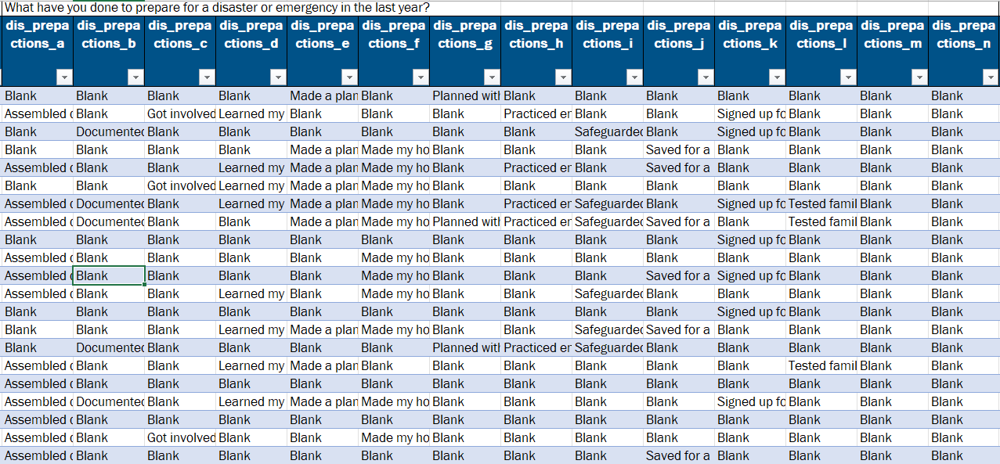

Based on the actions, we can consider the following categorization for each preparedness level:

1. Pre-contemplation (level 1): 'Don't know'
2. Contemplation (level 2): 'None of the actions'
3. Preparation (level 3): 'Assembled or updated supplies', 'Learned my evacuation routes', 'Made a plan'
4. Action (level 4): 'Safeguarded documents', 'Saved for a rainy day', 'Documented and insured property', 'Got involved in my community', 'Made my home safer', 'Planned with neighbors', 'Signed up for alerts and warnings'
5. Maintenance (level 5): 'Practiced emergency drills or habits', 'Tested family communication plan'

In [11]:
# Extracting the columns related to preparedness actions
actions_columns = ['dis_prepactions_a', 'dis_prepactions_b', 'dis_prepactions_c', 'dis_prepactions_d',
                   'dis_prepactions_e', 'dis_prepactions_f', 'dis_prepactions_g', 'dis_prepactions_h',
                   'dis_prepactions_i', 'dis_prepactions_j', 'dis_prepactions_k', 'dis_prepactions_l',
                   'dis_prepactions_m', 'dis_prepactions_n']

# Create a new DataFrame with the relevant columns
actions_data = data[actions_columns]

# Define a function to categorize preparedness levels based on actions taken
def categorize_preparedness(row):
    # Count the number of actions performed by the respondent
    actions_performed = row[(row == 'Assembled or updated supplies') |
                            (row == 'Documented and insured property') |
                            (row == 'Got involved in my community') |
                            (row == 'Learned my evacuation routes') |
                            (row == 'Made a plan') |
                            (row == 'Made my home safer') |
                            (row == 'Planned with neighbors') |
                            (row == 'Practiced emergency drills or habits') |
                            (row == 'Safeguarded documents') |
                            (row == 'Saved for a rainy day') |
                            (row == 'Signed up for alerts and warnings') |
                            (row == 'Tested family communication plan')]

    # Classify the preparedness level based on the number of actions performed
    if len(actions_performed) == 0:
        return 0  # Pre-contemplation
    elif len(actions_performed) == 1:
        return 1  # Contemplation
    elif len(actions_performed) <= 3:
        return 2  # Preparation
    elif len(actions_performed) <= 9:
        return 3  # Action
    else:
        return 4  # Maintenance

We have identified relevant columns based on the problem statement (e.g., age, demographics, preparedness actions).
A new DataFrame actions_data is created containing only the preparedness action columns. The categorize_preparedness function takes a row of data (actions) and counts the number of actions performed. Based on the count, it assigns a preparedness level (e.g., Pre-contemplation, Contemplation, Preparation, Action, Maintenance). The function is applied to each row in actions_data using apply, and the resulting preparedness level is stored in a new column called preparedness in the selected_data DataFrame.

In [12]:
# Identify relevant columns
alerts_columns = [f'dis_prepactions_alerts_{letter}_{number}' for letter in 'abcdef' for number in range(1, 9)]

This code block identifies columns related to disaster awareness alerts. It creates a list named alerts_columns containing column names based on a pattern: dis_prepactions_alerts_{letter}_{number}, where {letter} ranges from a to f and {number} ranges from 1 to 8. These columns likely indicate if a respondent signed up for various disaster alert systems.

### Assigning Weights to Awareness Sources

Assigning weights to different awareness sources depends on their perceived effectiveness in disseminating accurate and actionable information. While the weights can be somewhat subjective, we can consider the following justifications based on common assumptions about the impact of various sources:

1. TV:

Weight: High

Justification: Television is a widely accessible medium with broad coverage. It can effectively reach a large audience and convey information in both visual and auditory formats.

2. Radio:

Weight: Moderate

Justification: Radio is a traditional and accessible source, especially in areas where other forms of communication might be limited. It can reach people across different demographics.

3. Social Media (Twitter, Instagram, Facebook, etc.):

Weight: High

Justification: Social media platforms have become significant sources of information, especially for younger generations. They offer real-time updates, user engagement, and the potential for information to go viral.

4. Online Publications (websites such as Harvard Review, NY Post):

Weight: Moderate to High

Justification: Online publications often provide in-depth and well-researched information. However, their impact may vary based on the credibility of the specific source.

5. Printed Publications (newspapers, magazines):

Weight: Moderate

Justification: While traditional, printed publications can still be influential, their readership has declined. Their impact may be more significant in specific age groups or communities.

6. Personal Network (friends, family, work, or school):

Weight: High

Justification: Recommendations and information from trusted personal connections are often highly influential. People are more likely to take action if they receive advice from those they know and trust.

7. Other (please specify):

Weight: Variable

Justification: This category is broad and may include a range of sources. Weights would depend on the nature and perceived reliability of the specified sources.

8. Don't know:

Weight: Low

Justification: Individuals who don't know the source of their awareness may not have actively sought out information. Therefore, their awareness might be considered less reliable or impactful.

9. Blank:

Weight: Lowest

Justification: Blank responses indicate a lack of engagement with any specific source. These individuals may not be actively seeking or receiving disaster-related information.

In [13]:
# Extracting the columns related to disaster awareness
awareness_source_columns = ['dis_awareness_source_a', 'dis_awareness_source_b', 'dis_awareness_source_c', 'dis_awareness_source_d', 'dis_awareness_source_e',
                             'dis_awareness_source_f', 'dis_awareness_source_g', 'dis_awareness_source_h']

# Count the number of sources for each individual
data['awareness_source_count'] = data[awareness_source_columns].apply(lambda row: row.value_counts().sum(), axis=1)

# Define weights for each source
source_weights = {
    'TV': 3,
    'Radio': 2,
    'Social Media': 3,
    'Online Publications': 2,
    'Printed Publications': 2,
    'Personal Network': 3,
    'Other': 1,  
    "Don't know": 0,
    'Blank': 0
}

# Create a dictionary to map each awareness source to its weight
source_weight_mapping = {source: source_weights.get(source, 0) for source in data[awareness_source_columns].stack().unique()}

# Create a new column for weighted sum based on the types of sources an individual is engaged in
data['awareness_score'] = data[awareness_source_columns].replace(source_weight_mapping).sum(axis=1)

This section defines a dictionary named source_weights that assigns weights to different sources of disaster awareness information. The weights represent the perceived effectiveness of each source in disseminating accurate and actionable information.
Higher weights are given to sources like TV, Social Media, and Personal Network, which are assumed to have a broader reach and greater influence.
Lower weights are assigned to sources like "Don't know" and "Blank" where the awareness origin is unclear or no awareness source was specified. It also calculates a score for each respondent to represent their awareness level based on the disaster awareness sources they reported.

## Data Selection and Cleaning

In [14]:
# Selected columns
selected_columns = ['sample', 'id', 'state', 'geographic_division', 'census_region', 'zipcode', 'county','dis_prep', 'dis_perception',
                     'dis_exp', 'age', 'employment', 'income', 'sex', 'education', 'ethnicity', 'awareness_score',
                     'disability', 'care', 'numadult', 'numchild', 'homeownership','rurality','socioeconomically_disadvantaged']

# Create a new DataFrame with selected columns
selected_data = data[selected_columns]

# Create a new column indicating registration for alerts
selected_data['registered_for_alerts'] = data[alerts_columns].apply(lambda row: 'Yes' if 'None of the above' not in row.values else 'No', axis=1)

# Add the 'preparedness' column to the new DataFrame
selected_data['preparedness'] = actions_data.apply(categorize_preparedness, axis=1)

# Convert 'preparedness' to categorical type
selected_data['preparedness'] = selected_data['preparedness'].astype('category')

In [15]:
selected_data.head()

,sample,id,state,geographic_division,census_region,zipcode,county,dis_prep,dis_perception,dis_exp,...,awareness_score,disability,care,numadult,numchild,homeownership,rurality,socioeconomically_disadvantaged,registered_for_alerts,preparedness
0,Coastal Flooding,1,Washington,Pacific,West,98033,King,Yes,Very likely,Yes,...,3,No Disability,No,3,1,Own,Urban,Not disadvantaged,Yes,2
1,Coastal Flooding,2,Florida,South Atlantic,South,33950,Charlotte,Yes,Likely,Yes,...,5,No Disability,No,5,3,Own,Urban,Not disadvantaged,Yes,3
2,Coastal Flooding,3,New Jersey,Middle Atlantic,Northeast,7031,Bergen,Maybe,Very likely,Yes,...,3,No Disability,No,3,1,Rent,Urban,Not disadvantaged,Yes,2
3,Coastal Flooding,4,Pennsylvania,Middle Atlantic,Northeast,19115,Philadelphia,"Yes, and I have taken steps to prepare",Don't know,No,...,0,No Disability,No,2,0,Rent,Urban,Not disadvantaged,Yes,2
4,Coastal Flooding,5,Pennsylvania,Middle Atlantic,Northeast,19148,Philadelphia,"Yes, and I have taken steps to prepare",Likely,Yes,...,0,No Disability,Yes,2,0,Own,Urban,Not disadvantaged,Yes,3


## Data Cleaning: Handling Missing Values

In [18]:
selected_data.isna().sum()

sample                               0
id                                   0
state                                0
geographic_division                  0
census_region                      191
zipcode                              0
county                              12
dis_prep                             0
dis_perception                       0
dis_exp                              0
age                                  0
employment                           0
income                               0
sex                                  0
education                            0
ethnicity                            0
awareness_score                      0
disability                           0
care                                 0
numadult                             0
numchild                             0
homeownership                        0
rurality                             0
socioeconomically_disadvantaged      0
registered_for_alerts                0
preparedness             

We have observed a few missing values in census_region and county features. so we are replacing them with the placeholder "Missing" to indicate missing data while preserving its presence for future analysis.

In [19]:
selected_data['census_region'] = selected_data['census_region'].fillna('Missing')
selected_data['county'] = selected_data['county'].fillna('Missing')

In [20]:
selected_data.isna().sum()

sample                             0
id                                 0
state                              0
geographic_division                0
census_region                      0
zipcode                            0
county                             0
dis_prep                           0
dis_perception                     0
dis_exp                            0
age                                0
employment                         0
income                             0
sex                                0
education                          0
ethnicity                          0
awareness_score                    0
disability                         0
care                               0
numadult                           0
numchild                           0
homeownership                      0
rurality                           0
socioeconomically_disadvantaged    0
registered_for_alerts              0
preparedness                       0
dtype: int64

### Data Distribution across each feature

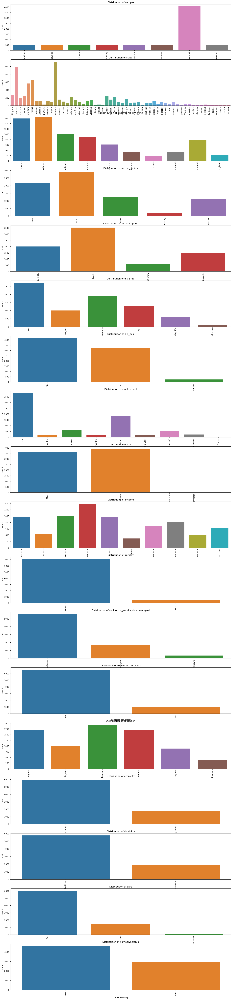

<Figure size 640x480 with 0 Axes>

In [21]:
# List of categorical columns
categorical_columns = ['sample', 'state', 'geographic_division', 'census_region','dis_perception', 'dis_prep', 'dis_exp', 
                       'employment', 'sex', 'income', 'rurality', 'socioeconomically_disadvantaged', 'registered_for_alerts',
                        'education', 'ethnicity', 'disability', 'care', 'homeownership']

# Set up subplots
fig, axes = plt.subplots(nrows=len(categorical_columns), ncols=1, figsize=(20, 5 * len(categorical_columns)))

# Plot each categorical variable
for i, column in enumerate(categorical_columns):
    sns.countplot(x=column, data=selected_data, ax=axes[i])
    axes[i].set_title(f'Distribution of {column}')
    axes[i].tick_params(axis='x', rotation=90)  # Rotate xticks vertically
# Display each plot individually
plt.show()

# Adjust layout
plt.tight_layout()
plt.show()

### Analyze Preparedness Levels (Balance of Classes)

In [22]:
preparedness_counts = selected_data['preparedness'].value_counts()

# Count of instances
total_instances = len(data)

# Calculate percentage for each class
preparedness_percentage = (preparedness_counts / total_instances) * 100

# Display the counts and percentages
preparedness_summary = pd.DataFrame({
    'Count': preparedness_counts,
    'Percentage': preparedness_percentage
})

print(preparedness_summary)


   Count  Percentage
3   2839   37.335613
2   2243   29.497633
0   1220   16.044187
1   1081   14.216202
4    221    2.906365


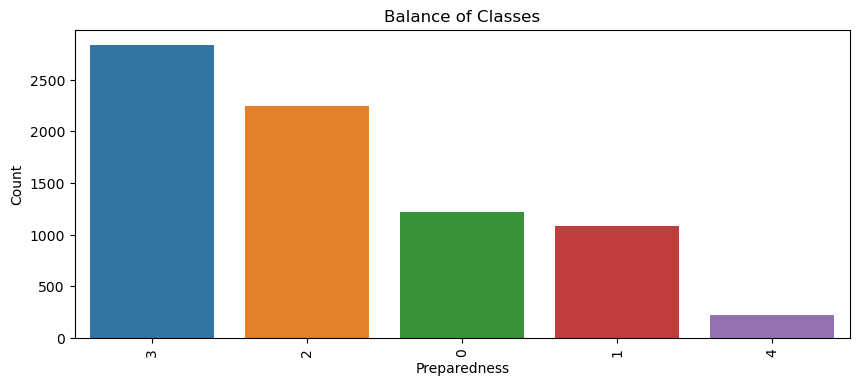

In [23]:
# Set the figure size
plt.figure(figsize=(10, 4))

# Plot the distribution of 'employment'
sns.countplot(x='preparedness', data=selected_data, order=selected_data['preparedness'].value_counts().index)

# Set labels and title
plt.xlabel('Preparedness')
plt.ylabel('Count')
plt.title('Balance of Classes')
plt.xticks(rotation=90)

# Show the plot
plt.show()

* The data is not perfectly balanced across preparedness levels. There's a clear trend with more respondents concentrated in the higher preparedness categories (3 and 2).
* There might be a bias towards more prepared individuals. Categories 3 ("Prepared") and 2 (likely a level indicating some preparedness actions) hold the highest counts. This could suggest the sample might not be entirely representative of the general population's preparedness.
* There's a significant portion of the population in the middle categories (1 and 0). These categories likely represent individuals with varying degrees of preparedness or those who haven't taken significant actions yet.
* The lowest count is in category 4. Without knowing the specific meaning of category 4 in your data (it could be "Highly Prepared" or something similar), it's difficult to say definitively. However, a low count might suggest this level is either uncommon or not clearly defined in the data.

Overall, the balance of classes leans towards a population with a moderate to good level of preparedness. 

### Distribution of Data according to State

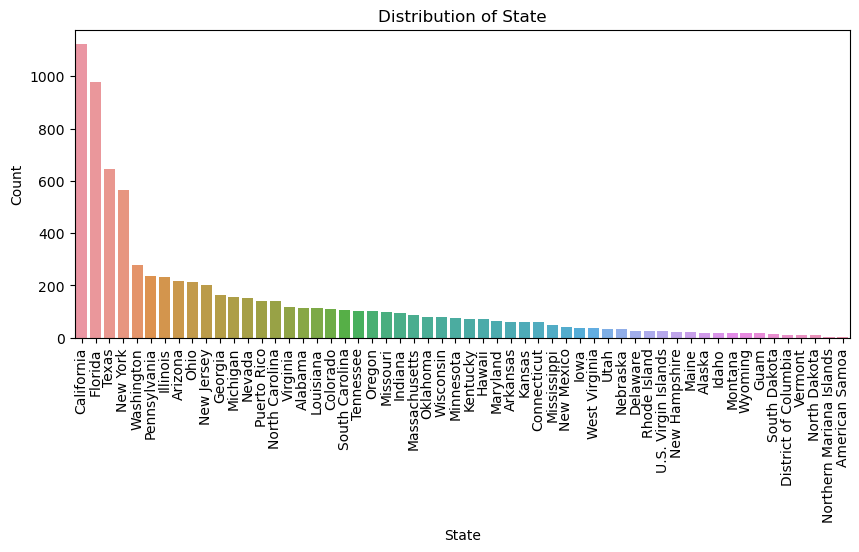

In [24]:
# Set the figure size
plt.figure(figsize=(10, 4))

# Plot the distribution of 'employment'
sns.countplot(x='state', data=selected_data, order=selected_data['state'].value_counts().index)

# Set labels and title
plt.xlabel('State')
plt.ylabel('Count')
plt.title('Distribution of State')
plt.xticks(rotation=90)

# Show the plot
plt.show()

By analyzing this plot, we can identify states with a higher or lower concentration of respondents in our data. This information might be relevant for various reasons, such as understanding the geographic scope of our data or if there's a bias towards specific regions.

### Types of Disasters according to States

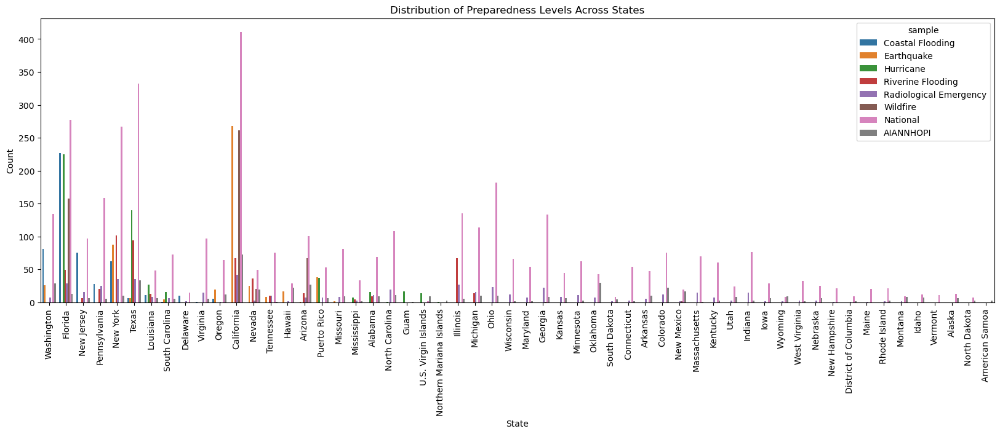

In [51]:
# Set the figure size
plt.figure(figsize=(20, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='state', hue='sample', data=selected_data)

# Set labels and title
plt.xlabel('State')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels Across States')
plt.xticks(rotation=90)

# Show the plot
plt.show()

By analyzing this plot, we can gain insights into how preparedness levels vary across different states. 

Here are some additional questions we can consider to explore the data further:

* Are there any states that consistently have a higher preparedness level compared to others?
* Are there any specific preparedness levels that are more prominent in certain regions?

### Distribution of Preparedness Levels Across States

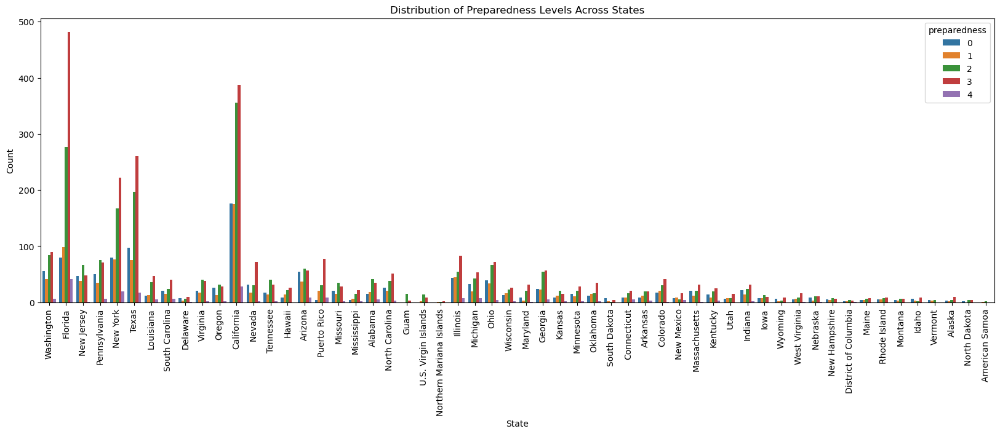

In [23]:
# Set the figure size
plt.figure(figsize=(20, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='state', hue='preparedness', data=selected_data)

# Set labels and title
plt.xlabel('State')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels Across States')
plt.xticks(rotation=90)

# Show the plot
plt.show()

By analyzing this plot, we can gain insights into how preparedness levels vary across different states.

As we can see in the graph, there's a significant variation in preparedness levels among states. Several states, including Florida, New York, California, Texas, and Puerto Rico, stand out with a higher concentration of residents in preparedness level 3, indicating a more prepared state. Interestingly, New York and California, while also having a notable presence in level 3, exhibit a more balanced distribution across all the levels. 

### Distribution of Preparedness Levels Across Geographic Divisions

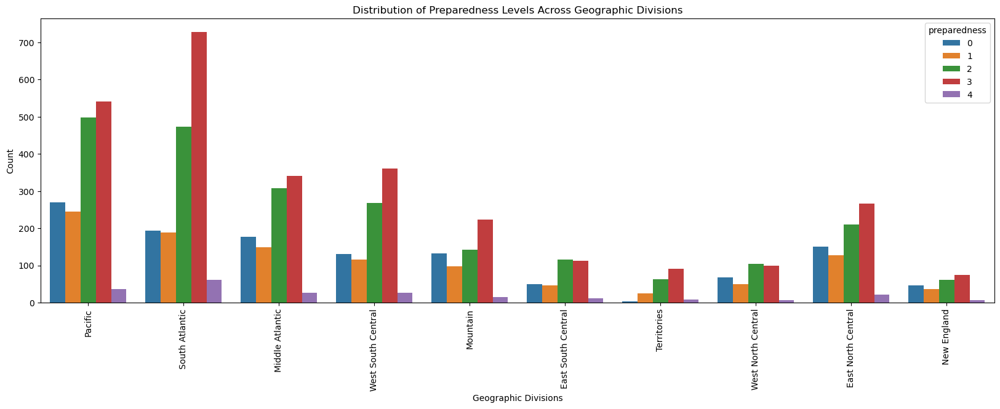

In [23]:
# Set the figure size
plt.figure(figsize=(20, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='geographic_division', hue='preparedness', data=selected_data)

# Set labels and title
plt.xlabel('Geographic Divisions')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels Across Geographic Divisions')
plt.xticks(rotation=90)

# Show the plot
plt.show()

By analyzing this plot, we can gain insights into how preparedness levels vary across different geographic divisions.
The South Atlantic Division stands out with the highest preparedness. A significant portion of the population here falls under level 3, indicating a more prepared state. In contrast, the Pacific and Middle Atlantic Divisions exhibit a more balanced distribution across all the levels. Finally, the New England Division has the lowest overall preparedness. 

### Distribution of Preparedness Levels Across Age Groups

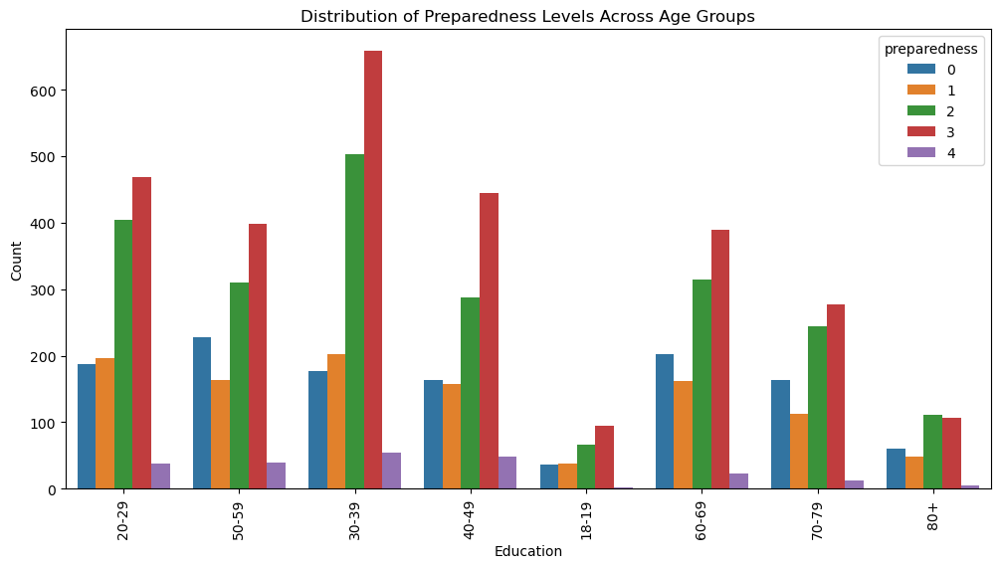

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='age', hue='preparedness', data=selected_data)

# Set labels and title
plt.xlabel('Education')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels Across Age Groups')
plt.xticks(rotation=90)

# Show the plot
plt.show()

### Distribution of Preparedness Levels Across Levels of Education

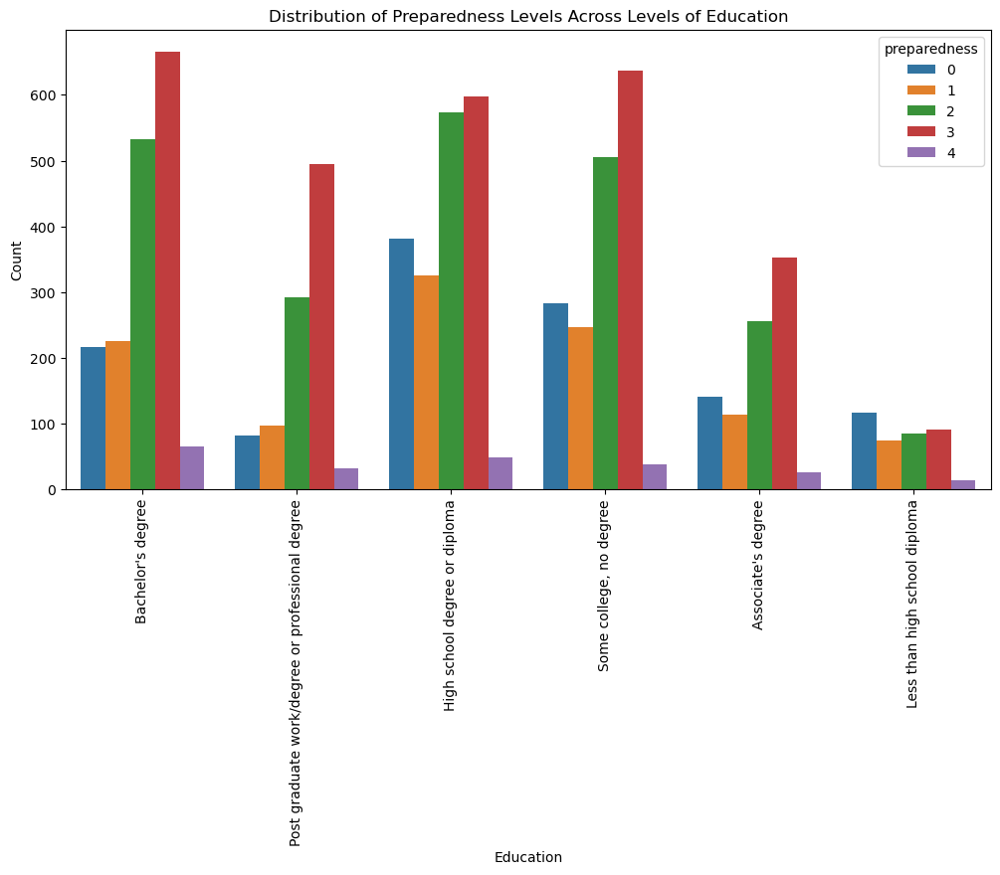

In [24]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='education', hue='preparedness', data=selected_data)

# Set labels and title
plt.xlabel('Education')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels Across Levels of Education')
plt.xticks(rotation=90)

# Show the plot
plt.show()

### Distribution of Preparedness Levels wrt Gender

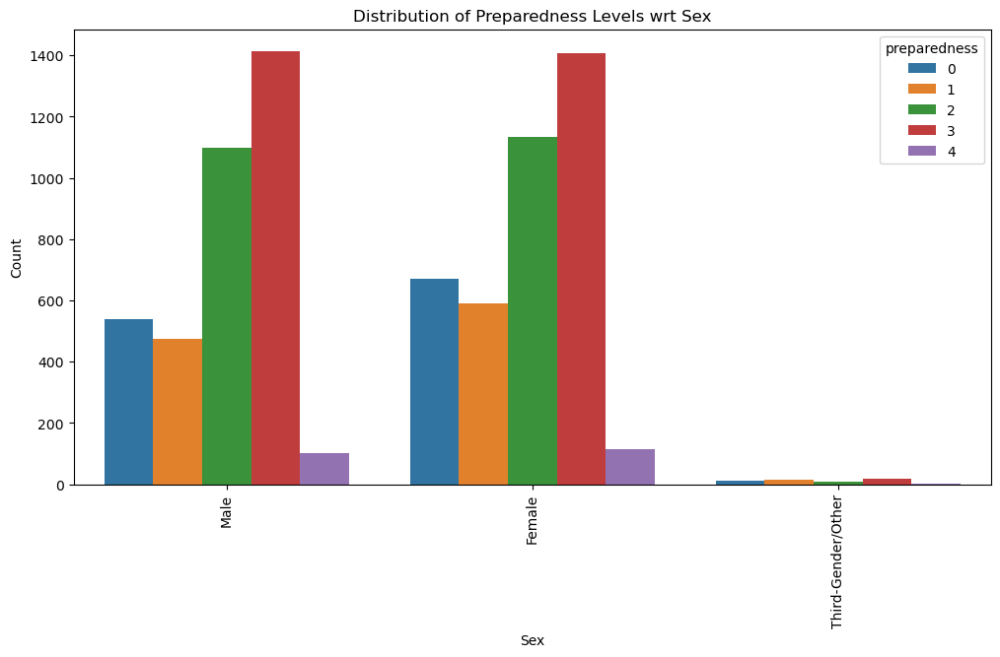

In [66]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='sex', hue='preparedness', data=selected_data)

# Set labels and title
plt.xlabel('Sex')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels wrt Sex')
plt.xticks(rotation=90)

# Show the plot
plt.show()

### Distribution of Preparedness Levels wrt Employment options

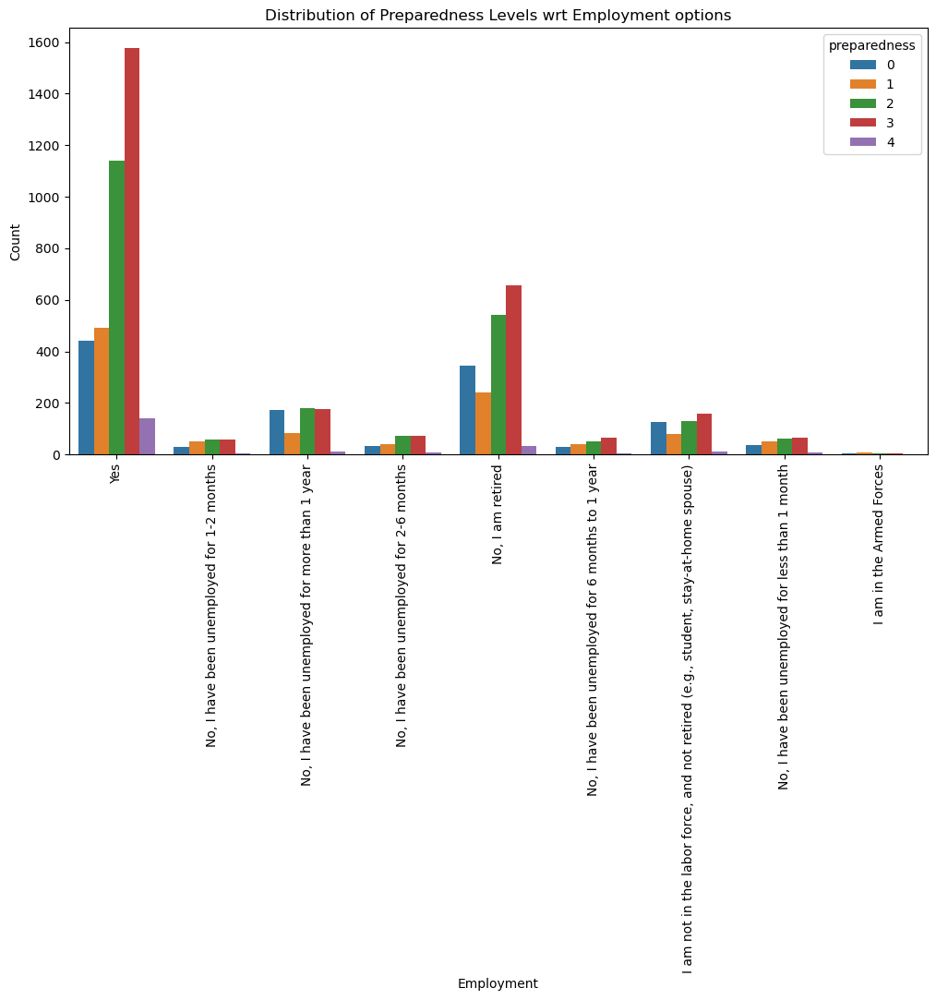

In [67]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='employment', hue='preparedness', data=selected_data)

# Set labels and title
plt.xlabel('Employment')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels wrt Employment options')
plt.xticks(rotation=90)

# Show the plot
plt.show()

### Distribution of Preparedness Levels Across Different Income groups

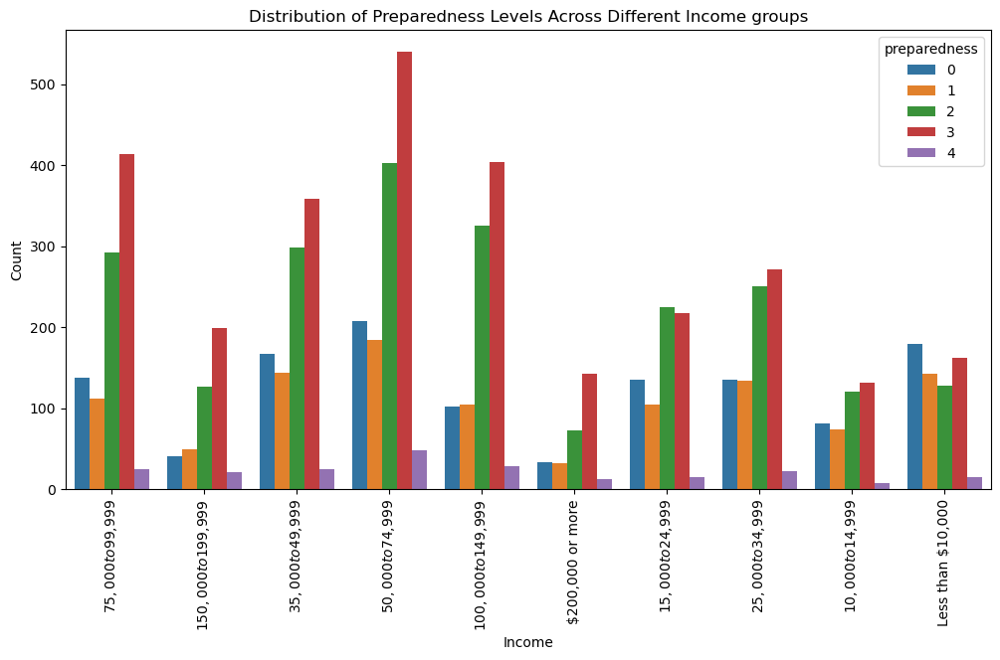

In [68]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='income', hue='preparedness', data=selected_data)

# Set labels and title
plt.xlabel('Income')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels Across Different Income groups')
plt.xticks(rotation=90)

# Show the plot
plt.show()

### Distribution of Preparedness Levels wrt Disability

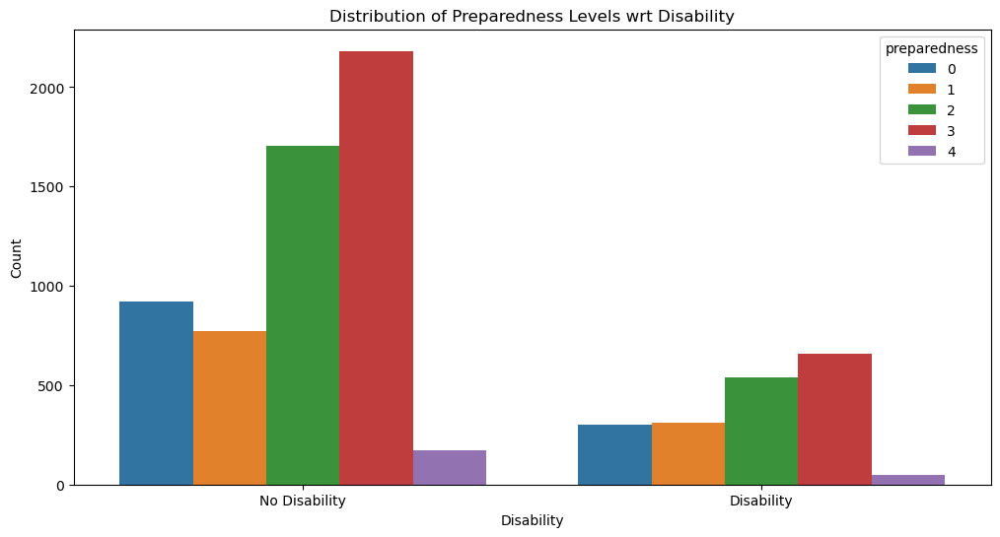

In [69]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='disability', hue='preparedness', data=selected_data)

# Set labels and title
plt.xlabel('Disability')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels wrt Disability')

# Show the plot
plt.show()

### Distribution of Preparedness Levels wrt Responsibility for Care

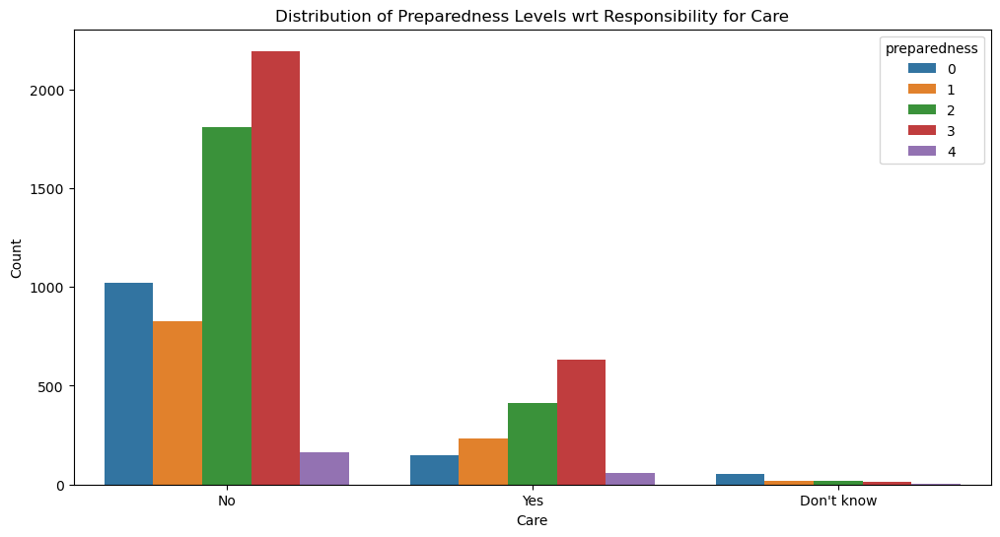

In [70]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='care', hue='preparedness', data=selected_data)

# Set labels and title
plt.xlabel('Care')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels wrt Responsibility for Care')

# Show the plot
plt.show()

### Distribution of Preparedness Levels wrt Homeownership

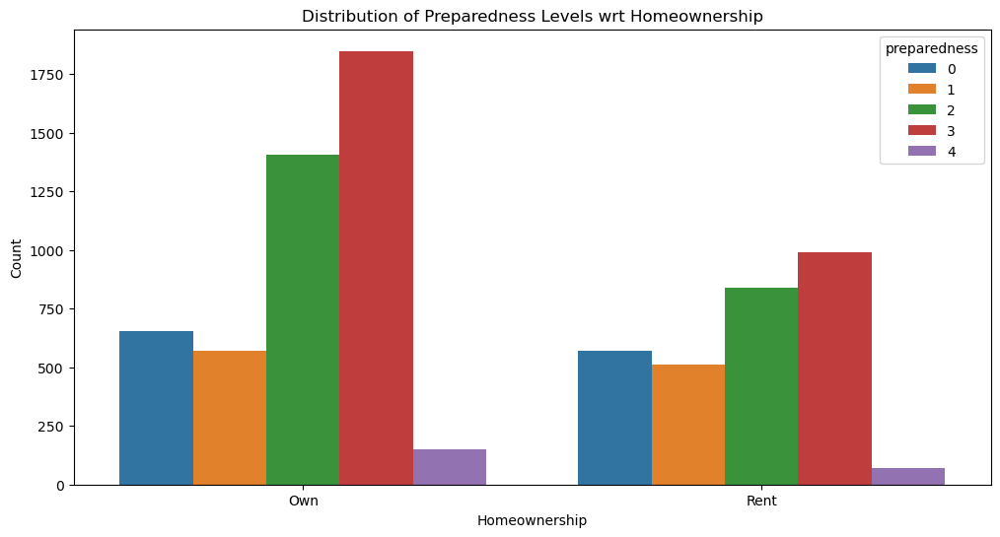

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='homeownership', hue='preparedness', data=selected_data)

# Set labels and title
plt.xlabel('Homeownership')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels wrt Homeownership')

# Show the plot
plt.show()

### Distribution of Preparedness Levels wrt Ethnicity

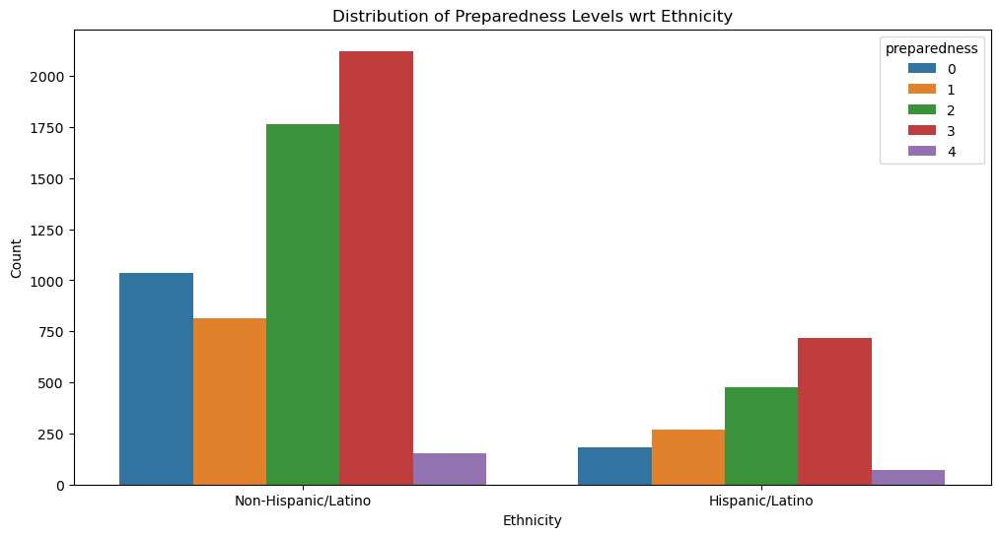

In [72]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='ethnicity', hue='preparedness', data=selected_data)

# Set labels and title
plt.xlabel('Ethnicity')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels wrt Ethnicity')

# Show the plot
plt.show()

### Distribution of Preparedness Levels wrt Rurality

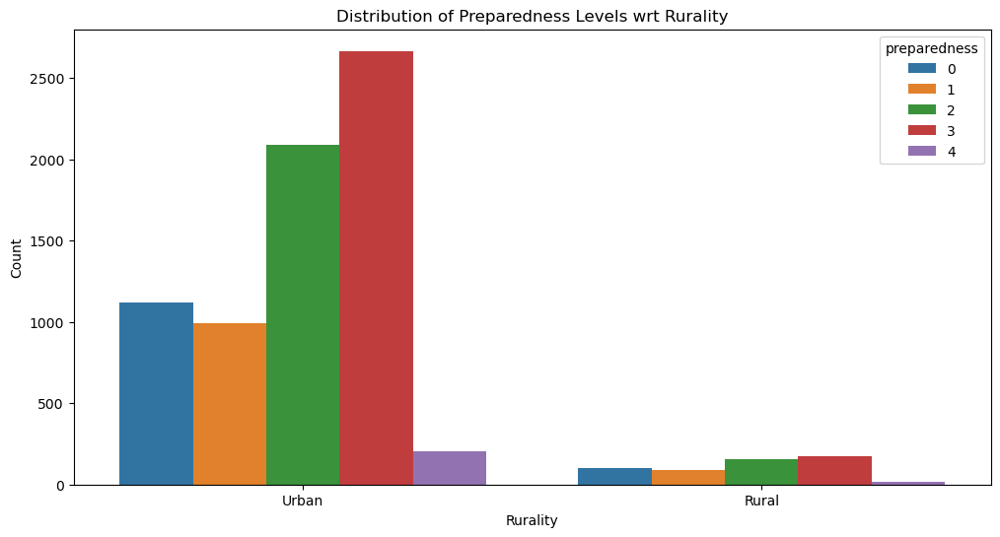

In [73]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='rurality', hue='preparedness', data=selected_data)

# Set labels and title
plt.xlabel('Rurality')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels wrt Rurality')

# Show the plot
plt.show()

### Distribution of Preparedness Levels wrt Socioeconomic Status

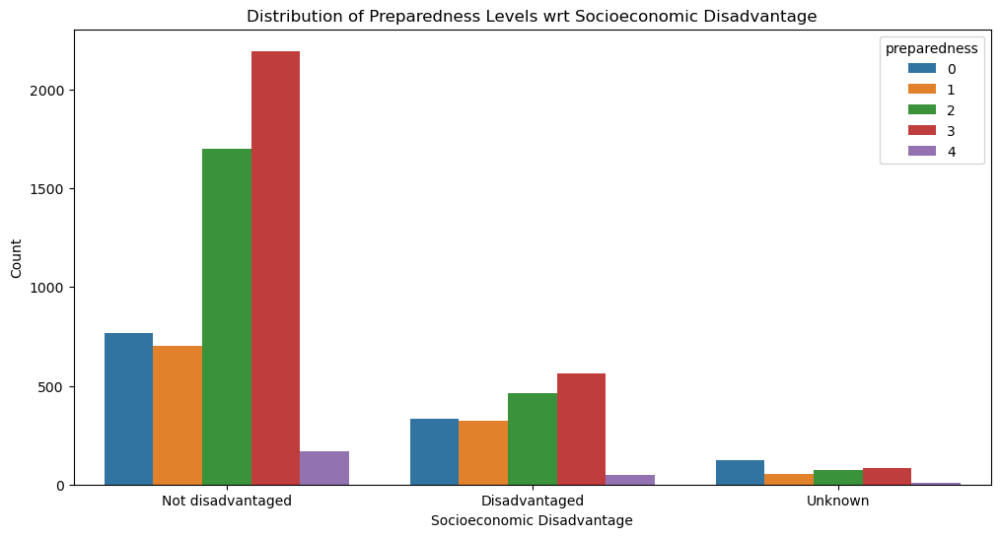

In [74]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='socioeconomically_disadvantaged', hue='preparedness', data=selected_data)

# Set labels and title
plt.xlabel('Socioeconomic Disadvantage')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels wrt Socioeconomic Disadvantage')

# Show the plot
plt.show()

### Distribution of Preparedness Levels wrt Registration for Alerts

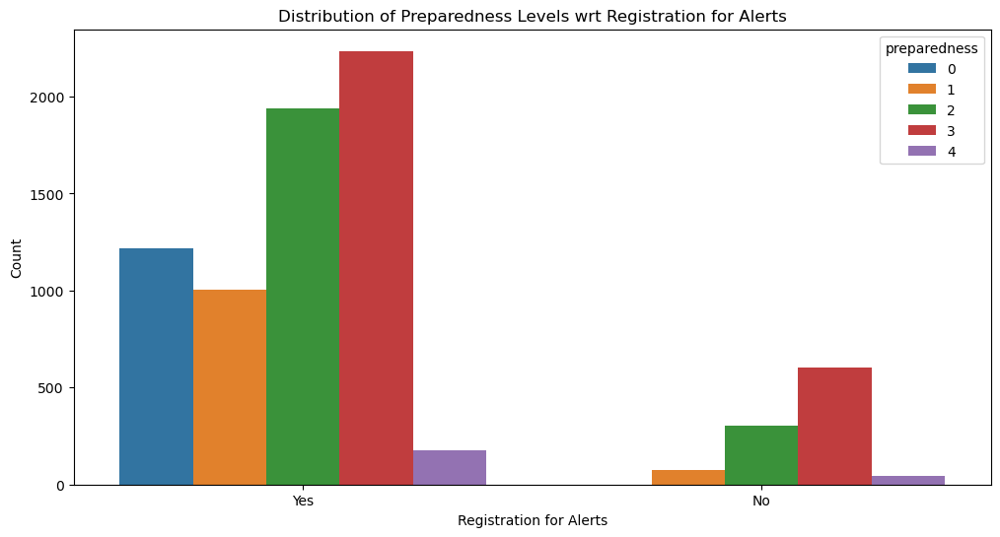

In [75]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='registered_for_alerts', hue='preparedness', data=selected_data)

# Set labels and title
plt.xlabel('Registration for Alerts')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels wrt Registration for Alerts')

# Show the plot
plt.show()

### Distribution of Preparedness Levels wrt Disaster Experience

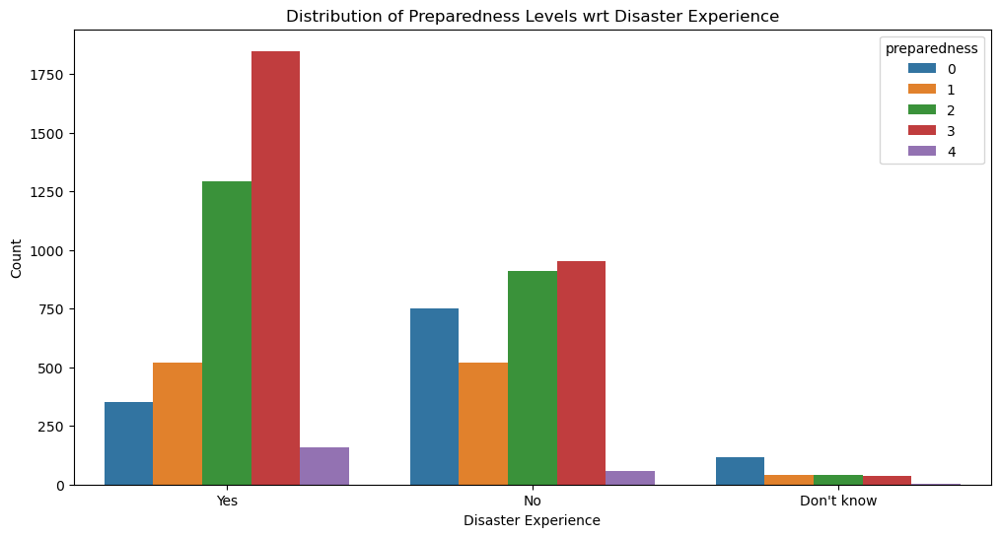

In [76]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='dis_exp', hue='preparedness', data=selected_data)

# Set labels and title
plt.xlabel('Disaster Experience')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels wrt Disaster Experience')

# Show the plot
plt.show()

## F-score test for all features

In [30]:
from sklearn.feature_selection import f_classif
from sklearn.preprocessing import LabelEncoder
import pandas as pd

# Extract features and target variable
X = selected_data.drop(['preparedness', 'id'], axis=1)
y = selected_data['preparedness']

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Exclude 'id' and 'zipcode' from numerical features
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns
numerical_cols = numerical_cols.difference(['zipcode'])
X_numerical = X[numerical_cols]

# Extract categorical variables
categorical_cols = X.select_dtypes(include=['object']).columns
X_categorical = X[categorical_cols]

# Include 'id' and 'zipcode' in categorical variables
categorical_cols = categorical_cols.union(['zipcode'])
X_categorical = X[categorical_cols]

# Make sure 'id' and 'zipcode' are treated as categorical variables
#X_categorical[['id']] = X_categorical[['id']].astype('object')
X_categorical[['zipcode']] = X_categorical[['zipcode']].astype('object')

# Combine numerical and encoded categorical variables
X_encoded = pd.concat([X_numerical, X_categorical], axis=1)

# Apply LabelEncoder to each categorical column
categorical_cols = X.select_dtypes(include=['object']).columns
X_encoded[categorical_cols] = X_encoded[categorical_cols].apply(label_encoder.fit_transform)

# Run F-score test
f_scores, p_values = f_classif(X_encoded, y)

# Create a DataFrame to display results
f_results = pd.DataFrame({'Feature': X_encoded.columns, 'F-Score': f_scores, 'P-Value': p_values})
f_results = f_results.sort_values(by='F-Score', ascending=False)

# Display the results
f_results

,Feature,F-Score,P-Value
9,dis_prep,753.122282,3.971264e-299
0,awareness_score,322.038962,5.636593e-135
7,dis_exp,257.473759,6.389624e-109
17,registered_for_alerts,186.895691,5.819719e-80
8,dis_perception,52.135867,3.247731e-23
15,homeownership,44.218155,8.075255e-20
2,numchild,43.001098,2.689805e-19
12,employment,32.787026,6.635074e-15
4,care,25.820053,6.674419e-12
14,geographic_division,16.865250,4.917208e-08


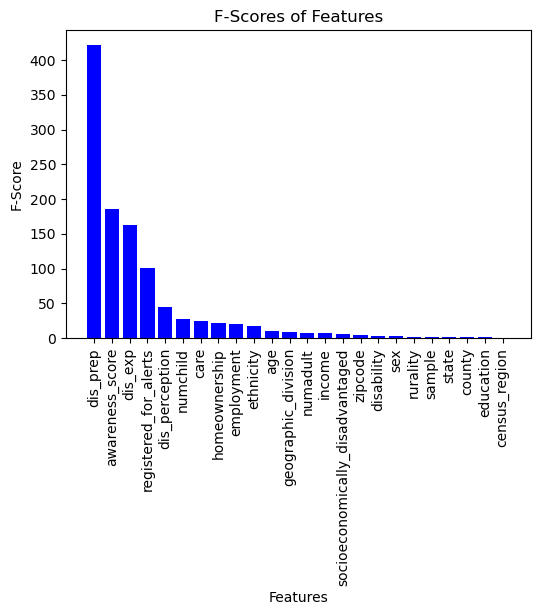

In [53]:
            # Plotting
plt.figure(figsize=(6, 4))
plt.bar(f_results['Feature'], f_results['F-Score'], color='blue')
plt.xlabel('Features')
plt.ylabel('F-Score')
plt.title('F-Scores of Features')
plt.xticks(rotation=90)
plt.show()

**dis_prep, awareness_score, dis_exp, registered_for_alerts:** These features have extremely low p-values, indicating high statistical significance. They are likely to be important predictors.

**numchild, care, dis_perception, homeownership:** These features also have low p-values, suggesting they are statistically significant.

**census_region, county, id, education, state:** These features have higher p-values, indicating that they may not be as statistically significant in predicting the target variable.

### Mutual Information score for all features

In [31]:
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import mutual_info_classif
import pandas as pd

# Define a dictionary to store mappings between original labels and encoded values
label_encodings = {}

# Extract features and target variable
X = selected_data.drop(['id', 'preparedness'], axis=1)
y = selected_data['preparedness']

# Exclude 'id' and 'zipcode' from numerical features
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns
numerical_cols = numerical_cols.difference(['zipcode'])
X_numerical = X[numerical_cols]

# Extract categorical variables
categorical_cols = X.select_dtypes(include=['object']).columns
categorical_cols = categorical_cols.union(['zipcode'])
# Label encode categorical variables
for col in categorical_cols:
    label_encoder = LabelEncoder()
    X_categorical[col] = label_encoder.fit_transform(X_categorical[col])
    # Store the mapping for decoding
    label_encodings[col] = {val: label for label, val in enumerate(label_encoder.classes_)}

# Make sure 'id' and 'zipcode' are treated as categorical variables
#X_categorical[['zipcode']] = X_categorical[['zipcode']].astype('object')

# Label encode categorical variables
#label_encoder = LabelEncoder()
X_categorical_encoded = X_categorical.apply(label_encoder.fit_transform)

# Combine numerical and encoded categorical variables
X_encoded = pd.concat([X_numerical, X_categorical_encoded], axis=1)

# Compute mutual information
mi_scores = mutual_info_classif(X_encoded, y)

# Create a DataFrame to display results
mi_results = pd.DataFrame({'Feature': X_encoded.columns, 'Mutual Information': mi_scores})
mi_results = mi_results.sort_values(by='Mutual Information', ascending=False)

# Display the results
print(mi_results)

                            Feature  Mutual Information
9                          dis_prep            0.117382
0                   awareness_score            0.059423
7                           dis_exp            0.041600
8                    dis_perception            0.040403
17            registered_for_alerts            0.022454
1                          numadult            0.012336
11                        education            0.011350
19                           sample            0.007593
4                              care            0.006804
2                          numchild            0.006383
23                          zipcode            0.005354
15                    homeownership            0.005123
13                        ethnicity            0.004891
6                            county            0.004359
16                           income            0.003791
12                       employment            0.003449
21  socioeconomically_disadvantaged            0

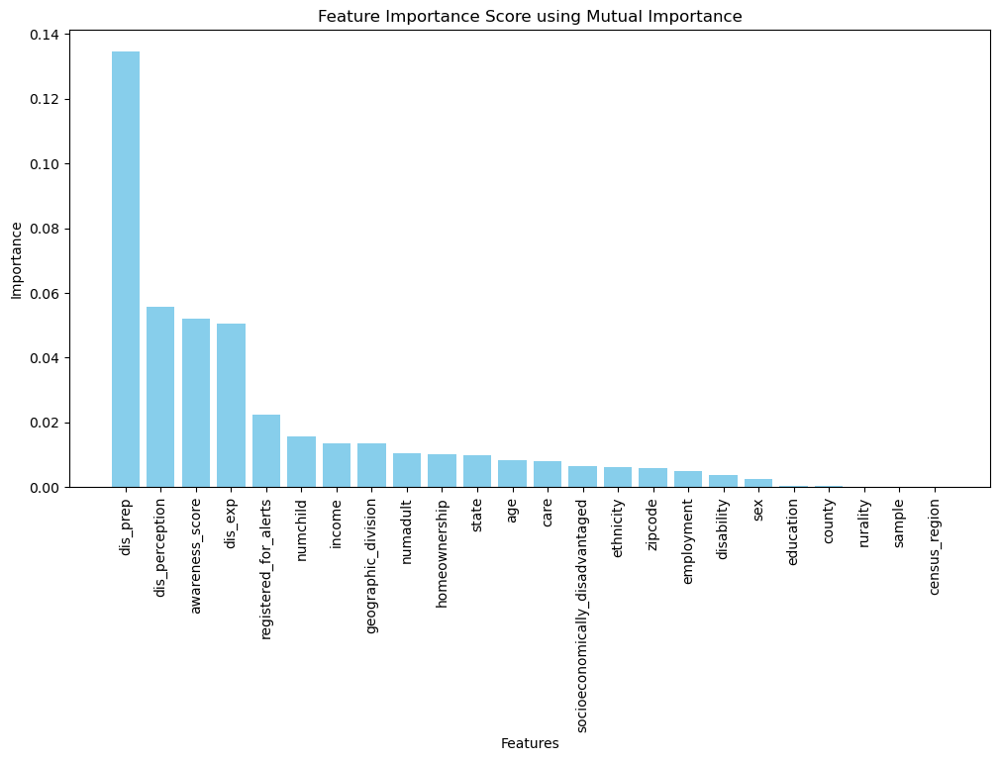

In [55]:
# Plotting
plt.figure(figsize=(12, 6))
plt.bar(mi_results['Feature'], mi_results['Mutual Information'], color='skyblue')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance Score using Mutual Importance')
plt.xticks(rotation=90)
plt.show()

The output shows the Mutual Information scores (a measure of the dependence between variables), for each feature with respect to the target variable 'preparedness'. Higher mutual information scores indicate a stronger relationship between the feature and the target variable.

* 'dis_prep' (Disaster Preparedness) has the highest mutual information score, suggesting that it is an important feature for predicting 'preparedness'.
* 'awareness_score', 'dis_perception', 'registered_for_alerts' and 'dis_exp' also have relatively high scores, indicating their importance in the prediction.
* Categorical variables like 'education', 'sex', 'ethnicity' and 'income' have lower scores, suggesting less predictive power.

A score of 0 doesn't necessarily mean the feature is unimportant, it means the feature is independent of target variable based on the measure used.

### Feature Importance score using Random Forest

In [32]:
from sklearn.ensemble import RandomForestClassifier
import pandas as pd

X = X_encoded
y = selected_data['preparedness']

# Create a Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Fit the model
rf_classifier.fit(X, y)

# Get feature importances
feature_importances = rf_classifier.feature_importances_

# Create a DataFrame to display results
rf_results = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance in descending order
rf_results = rf_results.sort_values(by='Importance', ascending=False)

# Display the results
print(rf_results)


                            Feature  Importance
9                          dis_prep    0.106215
23                          zipcode    0.099010
6                            county    0.090285
16                           income    0.063571
22                            state    0.058787
3                               age    0.055760
0                   awareness_score    0.049790
11                        education    0.049666
19                           sample    0.046435
1                          numadult    0.042244
8                    dis_perception    0.042221
12                       employment    0.036735
14              geographic_division    0.036589
2                          numchild    0.029962
7                           dis_exp    0.026336
17            registered_for_alerts    0.024386
5                     census_region    0.023095
20                              sex    0.022675
21  socioeconomically_disadvantaged    0.018524
15                    homeownership    0

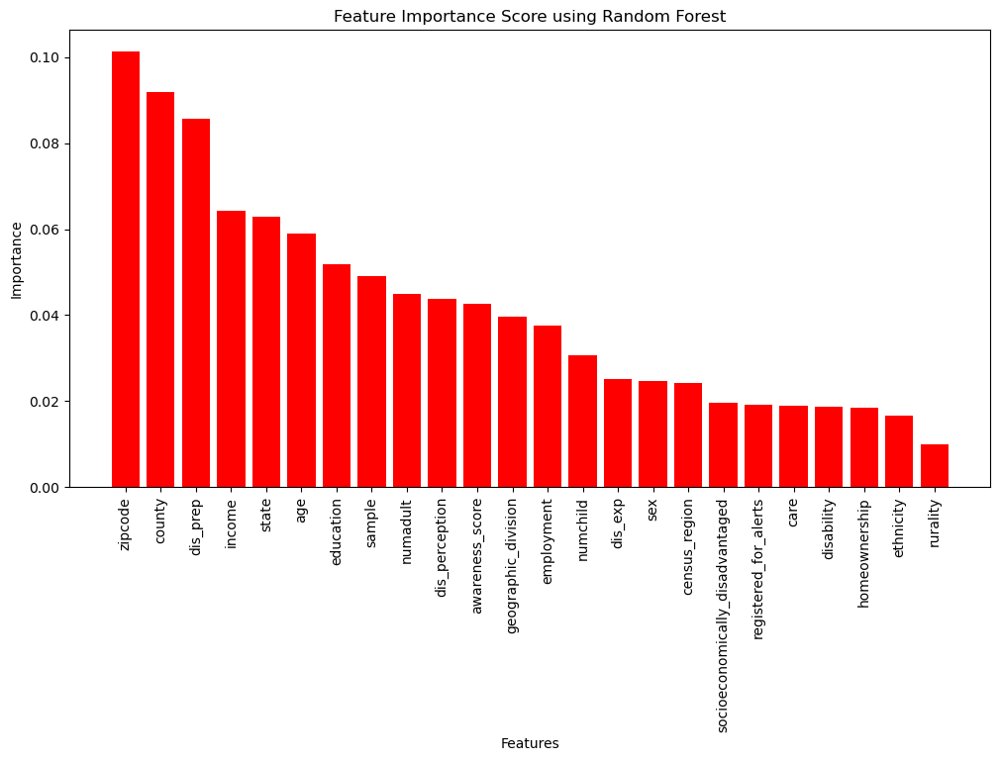

In [34]:
# Plotting
plt.figure(figsize=(12, 6))
plt.bar(rf_results['Feature'], rf_results['Importance'], color='red')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance Score using Random Forest')
plt.xticks(rotation=90)
plt.show()

Accoridng to the Random Forest model, 'dis_prep', 'county', 'zipcode', 'income', 'state' and 'age' are some of the most important features in predicting the target variable (preparedness). However, features like education, awareness_score, dis_perception, numadult, employment, numchild and geographic_division have moderate importance. 

### Feature Importance using CatBoost

In [83]:
from catboost import CatBoostClassifier, Pool
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split

X = X_encoded
y = selected_data['preparedness']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a CatBoost Pool for training and testing data
train_pool = Pool(X_train, label=y_train, cat_features=['zipcode', 'state', 'geographic_division', 'census_region','dis_perception', 'dis_prep', 'dis_exp', 
                       'employment', 'sex', 'income', 'rurality', 'socioeconomically_disadvantaged', 'registered_for_alerts',
                        'education', 'ethnicity', 'disability', 'care', 'homeownership'])
test_pool = Pool(X_test, label=y_test, cat_features=['zipcode', 'state', 'geographic_division', 'census_region','dis_perception', 'dis_prep', 'dis_exp', 
                       'employment', 'sex', 'income', 'rurality', 'socioeconomically_disadvantaged', 'registered_for_alerts',
                        'education', 'ethnicity', 'disability', 'care', 'homeownership'])

# Initialize and train the CatBoost classifier
catboost_model = CatBoostClassifier(iterations=100, depth=10, cat_features=['zipcode', 'state', 'geographic_division', 'census_region','dis_perception', 'dis_prep', 'dis_exp', 
                       'employment', 'sex', 'income', 'rurality', 'socioeconomically_disadvantaged', 'registered_for_alerts',
                        'education', 'ethnicity', 'disability', 'care', 'homeownership'])
catboost_model.fit(train_pool)

# Get feature importance scores
feature_importance = catboost_model.get_feature_importance()

# Create a DataFrame to display results
catboost_results = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importance})

# Sort the DataFrame by importance in descending order
catboost_results = catboost_results.sort_values(by='Importance', ascending=False)

# Display the results
print(catboost_results)


Learning rate set to 0.5
0:	learn: 1.3780674	total: 244ms	remaining: 24.2s
1:	learn: 1.2797992	total: 499ms	remaining: 24.4s
2:	learn: 1.2067228	total: 778ms	remaining: 25.2s
3:	learn: 1.1554522	total: 1.09s	remaining: 26.3s
4:	learn: 1.1301846	total: 1.39s	remaining: 26.5s
5:	learn: 1.1024443	total: 1.65s	remaining: 25.9s
6:	learn: 1.0761925	total: 1.94s	remaining: 25.8s
7:	learn: 1.0719021	total: 2.01s	remaining: 23.1s
8:	learn: 1.0452610	total: 2.31s	remaining: 23.4s
9:	learn: 1.0217771	total: 2.58s	remaining: 23.3s
10:	learn: 1.0091872	total: 2.81s	remaining: 22.8s
11:	learn: 1.0060282	total: 2.85s	remaining: 20.9s
12:	learn: 0.9840888	total: 3.16s	remaining: 21.1s
13:	learn: 0.9775916	total: 3.4s	remaining: 20.9s
14:	learn: 0.9544444	total: 3.69s	remaining: 20.9s
15:	learn: 0.9379187	total: 3.94s	remaining: 20.7s
16:	learn: 0.9257165	total: 4.21s	remaining: 20.5s
17:	learn: 0.9124524	total: 4.52s	remaining: 20.6s
18:	learn: 0.8848712	total: 4.75s	remaining: 20.2s
19:	learn: 0.8724

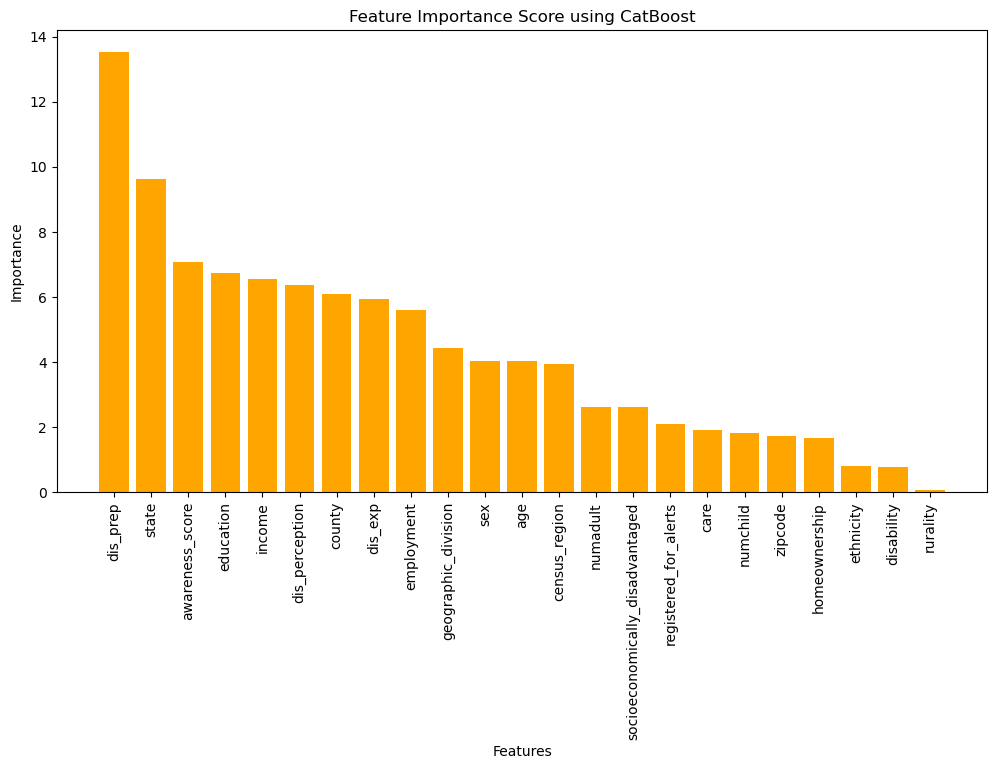

In [84]:
# Plotting
plt.figure(figsize=(12, 6))
plt.bar(catboost_results['Feature'], catboost_results['Importance'], color='orange')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance Score using CatBoost')
plt.xticks(rotation=90)
plt.show()

In [85]:
# Predictions
y_train_pred = catboost_model.predict(X_train)
y_test_pred = catboost_model.predict(X_test)

# Print training and testing classification reports
print("Training Classification Report for CatBoost Classifier:")
print(classification_report(y_train, y_train_pred))
print("Testing Classification Report for CatBoost Classifier:")
print(classification_report(y_test, y_test_pred))

# Print training and testing confusion matrices
print("Training Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred))
print("Testing Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred))

Training Classification Report for CatBoost Classifier:
              precision    recall  f1-score   support

           0       0.82      0.83      0.83       997
           1       0.86      0.62      0.72       867
           2       0.82      0.74      0.77      1783
           3       0.76      0.92      0.84      2256
           4       0.96      0.54      0.70       180

    accuracy                           0.80      6083
   macro avg       0.84      0.73      0.77      6083
weighted avg       0.81      0.80      0.80      6083

Testing Classification Report for CatBoost Classifier:
              precision    recall  f1-score   support

           0       0.50      0.60      0.55       223
           1       0.22      0.14      0.17       214
           2       0.39      0.33      0.36       460
           3       0.54      0.67      0.59       583
           4       0.00      0.00      0.00        41

    accuracy                           0.46      1521
   macro avg       0

The model performs relatively well on the training set, achieving high precision, recall, and F1-score for most classes.
However, the model's performance significantly drops on the testing set, with lower precision, recall, and F1-score values, indicating poor generalization.
The discrepancy between training and testing performance suggests overfitting.

'dis_prep' has the highest importance score, indicating that it plays a crucial role in predicting the target variable.However, other features like 'state', 'income', 'education', 'dis_perception','county', 'awareness_score', 'dis_exp','employment' and 'geographic division' are also significant features in making the prediction.

### Comparison of Important Features:

Comparing the outputs from the three models (mutual information, random forest, and CatBoost), we can infer commonalities and differences in terms of the features deemed significant for predicting disaster preparedness. Here's a summary:

**_Commonly Important Features:_**

**'dis_prep'** (Disaster Preparedness) is consistently recognized as a highly important feature across all models. This aligns with the expectation that individuals who are better prepared for disasters are more likely to exhibit positive preparedness behavior.

**'state', 'income', and 'education'** are consistently identified as crucial factors in predicting disaster preparedness. These demographic and socio-economic variables suggest that preparedness may vary based on geographical location, income levels, and educational attainment.

**'dis_perception'** (Disaster Perception), **'awareness_score'** and **'dis_exp'** (Disaster Experience) are consistently deemed significant across models. This highlights the importance of individuals' perceptions and past experiences in shaping their preparedness behaviors.


**_Model-Specific Observations:_**

**F_Score Test:**

It tends to assign higher F-scores related to disaster preparation actions and experiences('dis_prep', 'dis_exp'), 'registered_for_alerts', and 'county'.

**Mutual Information:**

It tends to assign lower importance to most features compared to the tree-based models.

**Random Forest:**

Shows higher importance for features related to location (zipcode, county), age, employment, and socio-economic factors.

**CatBoost:**

Similar to Random Forest, but age and employment are emphasized more. It assigns higher importance to some features compared to Mutual Information.

**_General Observations:_**
Features related to demographics (age, number of adults, number of children), socio-economic status (income, education), and past experiences (disaster experience) consistently play a role in predicting disaster preparedness.

Geographic factors (state, zipcode, county) are significant, but their importance varies across models.

Employment status, perception, and care needs are considered important in the tree-based models.

## Traditional Machine Learning Algorithms

### Logistic Regression

In [34]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix

In [87]:
X = X_encoded
y = selected_data['preparedness']

# Label encode the target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

In [88]:
# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Train a logistic regression model
log_reg_model = LogisticRegression(max_iter=1000)
log_reg_model.fit(X_train, y_train)

# Make predictions
y_train_pred = log_reg_model.predict(X_train)
y_test_pred = log_reg_model.predict(X_test)

In [89]:
# Evaluate the model
print("Training Classification Report:")
print(classification_report(y_train, y_train_pred))

print("Training Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred))

print("Testing Classification Report:")
print(classification_report(y_test, y_test_pred))

print("Testing Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred))

Training Classification Report:
              precision    recall  f1-score   support

           0       0.44      0.38      0.41       997
           1       0.00      0.00      0.00       867
           2       0.33      0.26      0.29      1783
           3       0.47      0.80      0.59      2256
           4       0.00      0.00      0.00       180

    accuracy                           0.43      6083
   macro avg       0.25      0.29      0.26      6083
weighted avg       0.34      0.43      0.37      6083

Training Confusion Matrix:
[[ 376    1  346  274    0]
 [ 174    0  252  441    0]
 [ 185    0  469 1129    0]
 [ 118    0  342 1796    0]
 [   0    0   13  167    0]]
Testing Classification Report:
              precision    recall  f1-score   support

           0       0.43      0.41      0.42       223
           1       0.00      0.00      0.00       214
           2       0.35      0.27      0.31       460
           3       0.51      0.82      0.63       583
         

* Class 0: The model has a moderate precision and recall, indicating that it can predict class 0 moderately well.
* Class 1: The precision, recall, and F1-score for class 1 are all 0, indicating that the model did not predict any instances for this class correctly.
* Class 2: The model has a low precision and recall for class 2, indicating that it struggles to predict this class accurately.
* Class 3: The model has a relatively high precision and recall for class 3, indicating that it performs well for this class.
* Class 4: Similar to class 1, the model did not predict any instances for class 4 correctly.

Overall, the model's performance is not satisfactory, especially for classes 1, 2, and 4. This suggests that the model might be struggling with imbalanced data and misclassification of minority classes

Let's try optimizing hyperparameters for the logistic regression model to see if it can improve the model's performance before resorting to oversampling techniques. 

### Logistic Regression with tuned Hyperparameters

In [90]:
from sklearn.model_selection import GridSearchCV

# Define the hyperparameters grid
param_grid = {
    'C': [0.001, 0.003, 0.005, 0.009, 0.01, 0.03, 0.05, 0.07, 0.09, 0.1, 0.3, 0.5, 0.9, 1],  # Regularization parameter
    'penalty': ['l1', 'l2']  # Penalty term
}

In [91]:
# Perform Grid Search Cross-Validation
grid_search = GridSearchCV(LogisticRegression(max_iter=1000), param_grid, cv=5)
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=LogisticRegression(max_iter=1000),
             param_grid={'C': [0.001, 0.003, 0.005, 0.009, 0.01, 0.03, 0.05,
                               0.07, 0.09, 0.1, 0.3, 0.5, 0.9, 1],
                         'penalty': ['l1', 'l2']})

In [92]:
# Print the best hyperparameters found
print("Best Hyperparameters:", grid_search.best_params_)

Best Hyperparameters: {'C': 0.07, 'penalty': 'l2'}


In [93]:
# Retrain the model with the best hyperparameters
best_log_reg_model = grid_search.best_estimator_
best_log_reg_model.fit(X_train, y_train)

# Make predictions
y_train_pred_cv = best_log_reg_model.predict(X_train)
y_test_pred_cv = best_log_reg_model.predict(X_test)

In [94]:
# Evaluate the model
print("Training Classification Report after Hyperparameter Optimization:")
print(classification_report(y_train, y_train_pred_cv))

print("Training Confusion Matrix after Hyperparameter Optimization:")
print(confusion_matrix(y_train, y_train_pred_cv))

print("Testing Classification Report after Hyperparameter Optimization:")
print(classification_report(y_test, y_test_pred_cv))

print("Testing Confusion Matrix after Hyperparameter Optimization:")
print(confusion_matrix(y_test, y_test_pred_cv))

Training Classification Report after Hyperparameter Optimization:
              precision    recall  f1-score   support

           0       0.41      0.43      0.42       997
           1       0.46      0.01      0.01       867
           2       0.33      0.28      0.30      1783
           3       0.49      0.75      0.59      2256
           4       0.00      0.00      0.00       180

    accuracy                           0.43      6083
   macro avg       0.34      0.29      0.27      6083
weighted avg       0.41      0.43      0.38      6083

Training Confusion Matrix after Hyperparameter Optimization:
[[ 425    3  344  225    0]
 [ 196    6  286  379    0]
 [ 249    3  503 1028    0]
 [ 162    1  392 1701    0]
 [   4    0   19  157    0]]
Testing Classification Report after Hyperparameter Optimization:
              precision    recall  f1-score   support

           0       0.38      0.46      0.42       223
           1       0.00      0.00      0.00       214
           2   

The output after hyperparameter tuning does not show any improvement. Precision, recall, and F1-score for class 2 and 3 have slightly decreased. This suggests that oversampling or other class imbalance handling techniques may still be necessary to improve the model's ability to predict these minority classes effectively.

### Logistic Regression with SMOTE(Synthetic Minority Over-sampling Technique)

In [95]:
from imblearn.over_sampling import SMOTE

In [96]:
# Apply SMOTE to the training data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

In [97]:
# Train Logistic Regression on the resampled data
logistic_reg_smote = LogisticRegression()
logistic_reg_smote.fit(X_resampled, y_resampled)

LogisticRegression()

In [98]:
# Evaluate the model
y_train_pred_sm = logistic_reg_smote.predict(X_train)
y_test_pred_sm = logistic_reg_smote.predict(X_test)

print("Training Classification Report after SMOTE:")
print(classification_report(y_train, y_train_pred_sm))

print("Training Confusion Matrix after SMOTE:")
print(confusion_matrix(y_train, y_train_pred_sm))

print("Testing Classification Report after SMOTE:")
print(classification_report(y_test, y_test_pred_sm ))

print("Testing Confusion Matrix after SMOTE:")
print(confusion_matrix(y_test, y_test_pred_sm))

Training Classification Report after SMOTE:
              precision    recall  f1-score   support

           0       0.30      0.47      0.36       997
           1       0.20      0.11      0.14       867
           2       0.35      0.15      0.21      1783
           3       0.43      0.31      0.36      2256
           4       0.06      0.58      0.12       180

    accuracy                           0.27      6083
   macro avg       0.27      0.33      0.24      6083
weighted avg       0.34      0.27      0.28      6083

Training Confusion Matrix after SMOTE:
[[465 131 123 181  97]
 [265  97 107 229 169]
 [427 125 268 477 486]
 [401 133 250 709 763]
 [ 13   7   8  47 105]]
Testing Classification Report after SMOTE:
              precision    recall  f1-score   support

           0       0.26      0.48      0.34       223
           1       0.18      0.09      0.12       214
           2       0.38      0.14      0.21       460
           3       0.45      0.34      0.39       58

The output after applying SMOTE shows some improvement in the performance metrics compared to before SMOTE, particularly for the minority class (class 4). 

However, while SMOTE has helped improve the performance for the minority class (class 4), it has adversely affected the performance for some of the majority classes (classes 0, 2, and 3). 

### Logistic Regression with Borderline SMOTE

In [99]:
from imblearn.over_sampling import BorderlineSMOTE

In [100]:
borderline_smote = BorderlineSMOTE()

X_train_resampled, y_train_resampled = borderline_smote.fit_resample(X_train, y_train)

log_reg_bsmote = LogisticRegression()
log_reg_bsmote.fit(X_train_resampled, y_train_resampled)

LogisticRegression()

In [101]:
# Evaluate the model
y_train_pred_bsm = log_reg_bsmote.predict(X_train)
y_test_pred_bsm = log_reg_bsmote.predict(X_test)


print("Training Classification Report after Borderline SMOTE:")
print(classification_report(y_train, y_train_pred_bsm))

print("Training Confusion Matrix after Borderline SMOTE:")
print(confusion_matrix(y_train, y_train_pred_bsm))

print("Testing Classification Report after Borderline SMOTE:")
print(classification_report(y_test, y_test_pred_bsm ))

print("Testing Confusion Matrix after Borderline SMOTE:")
print(confusion_matrix(y_test, y_test_pred_bsm))

Training Classification Report after Borderline SMOTE:
              precision    recall  f1-score   support

           0       0.31      0.47      0.37       997
           1       0.18      0.13      0.15       867
           2       0.35      0.13      0.19      1783
           3       0.43      0.27      0.33      2256
           4       0.05      0.56      0.10       180

    accuracy                           0.25      6083
   macro avg       0.27      0.31      0.23      6083
weighted avg       0.34      0.25      0.26      6083

Training Confusion Matrix after Borderline SMOTE:
[[472 151  94 133 147]
 [261 116  96 187 207]
 [411 173 227 433 539]
 [368 195 223 609 861]
 [ 13   9   8  49 101]]
Testing Classification Report after Borderline SMOTE:
              precision    recall  f1-score   support

           0       0.27      0.47      0.34       223
           1       0.18      0.13      0.15       214
           2       0.37      0.13      0.19       460
           3       

Overall, the model's performance is quite low, as indicated by the low accuracy and F1-scores across all classes. This suggests that the model trained with Borderline SMOTE did not generalize well to the test data. 

### Logistic Regression with Weights

In [102]:
# Define logistic regression model with class weights
log_reg_weighted = LogisticRegression(class_weight='balanced')

# Train the model
log_reg_weighted.fit(X_train, y_train)

# Predictions
y_train_pred_w = log_reg_weighted.predict(X_train)
y_test_pred_w = log_reg_weighted.predict(X_test)

In [103]:
print("Training Classification Report after applying weights:")
print(classification_report(y_train, y_train_pred_w))

print("Training Confusion Matrix after applying weights:")
print(confusion_matrix(y_train, y_train_pred_w))

print("Testing Classification Report after applying weights:")
print(classification_report(y_test, y_test_pred_w))

print("Testing Confusion Matrix after applying weights:")
print(confusion_matrix(y_test, y_test_pred_w))

Training Classification Report after applying weights:
              precision    recall  f1-score   support

           0       0.30      0.51      0.38       997
           1       0.21      0.18      0.19       867
           2       0.35      0.17      0.23      1783
           3       0.49      0.12      0.20      2256
           4       0.05      0.68      0.10       180

    accuracy                           0.22      6083
   macro avg       0.28      0.33      0.22      6083
weighted avg       0.37      0.22      0.23      6083

Training Confusion Matrix after applying weights:
[[ 506  143  137   35  176]
 [ 282  152  110   66  257]
 [ 455  186  305  162  675]
 [ 405  220  313  276 1042]
 [  13   10   15   19  123]]
Testing Classification Report after applying weights:
              precision    recall  f1-score   support

           0       0.27      0.49      0.35       223
           1       0.15      0.14      0.14       214
           2       0.38      0.18      0.25     

### Comparison of Logistic Regression Outputs: 

1. Logistic Regression (Original):

* Precision, recall, and F1-score are relatively low for most classes, with class 3 having the highest values.
* Accuracy is 43%.
* Class 4 has no true positives (TP), resulting in a precision, recall, and F1-score of 0.
* Class 1 also has no TP, resulting in 0 precision, recall, and F1-score.

2. Logistic Regression after Hyperparameter Optimization:

* Performance metrics remain similar to the original logistic regression model.
* No significant improvement is observed after hyperparameter optimization.
* Class 4 still has no TP, and class 1 also remains unchanged.

3. Logistic Regression after SMOTE:

* Precision, recall, and F1-score for minority classes (classes 1, 2, and 4) have slightly improved compared to the original logistic regression model.
* However, performance for majority classes (classes 0 and 3) has deteriorated.
* Overall accuracy is 26%.

4. Logistic Regression after Borderline SMOTE:

* Similar to SMOTE, precision, recall, and F1-score for minority classes have improved, but performance for majority classes has worsened.
* Overall accuracy is 22%.
* Class 4 still has no TP, and class 1 remains unchanged.

5. Logistic Regression with Class Weights:

* Accuracy: 0.22
* Performance is similar to SMOTE and Borderline SMOTE.
* The weighted approach did not lead to noticeable improvement compared to the other techniques.

**Comparison:**

* Original logistic regression and hyperparameter-optimized logistic regression have similar performances, with no significant improvement observed after optimization.
* SMOTE, Borderline SMOTE and class weights have slightly improved performance for minority classes but at the cost of decreased performance for majority classes.
* Both SMOTE techniques resulted in similar outcomes, with SMOTE showing slightly better accuracy.
* Overall, none of the techniques significantly improved the model's performance, indicating that logistic regression may not be the best choice for this imbalanced categorical dataset. Further exploration of other algorithms or more advanced techniques may be necessary.

## Combining classes

Combining classes 1 and 2, as well as classes 4 and 5, into single classes can potentially help alleviate the imbalance issue and improve the model's performance. By reducing the number of classes from five to three, we can create a more balanced distribution among the classes, which can lead to better classification results. 

In [23]:
# Define a dictionary to map the old classes to the new combined classes
class_mapping = {
    0: 0,  # Keep class 1 as it is
    1: 0,  # Combine class 2 with class 1
    2: 1,  # Keep class 3 as it is
    3: 2,  # Combine class 4 with class 3
    4: 2   # Combine class 5 with class 3      
}

# Apply the mapping to the 'preparedness' column
selected_data['preparedness'] = selected_data['preparedness'].map(class_mapping)

# Display the updated DataFrame with combined classes
selected_data.head()

,sample,id,state,geographic_division,census_region,zipcode,county,dis_prep,dis_perception,dis_exp,...,awareness_score,disability,care,numadult,numchild,homeownership,rurality,socioeconomically_disadvantaged,registered_for_alerts,preparedness
0,Coastal Flooding,1,Washington,Pacific,West,98033,King,Yes,Very likely,Yes,...,3,No Disability,No,3,1,Own,Urban,Not disadvantaged,Yes,1
1,Coastal Flooding,2,Florida,South Atlantic,South,33950,Charlotte,Yes,Likely,Yes,...,5,No Disability,No,5,3,Own,Urban,Not disadvantaged,Yes,2
2,Coastal Flooding,3,New Jersey,Middle Atlantic,Northeast,7031,Bergen,Maybe,Very likely,Yes,...,3,No Disability,No,3,1,Rent,Urban,Not disadvantaged,Yes,1
3,Coastal Flooding,4,Pennsylvania,Middle Atlantic,Northeast,19115,Philadelphia,"Yes, and I have taken steps to prepare",Don't know,No,...,0,No Disability,No,2,0,Rent,Urban,Not disadvantaged,Yes,1
4,Coastal Flooding,5,Pennsylvania,Middle Atlantic,Northeast,19148,Philadelphia,"Yes, and I have taken steps to prepare",Likely,Yes,...,0,No Disability,Yes,2,0,Own,Urban,Not disadvantaged,Yes,2


In [24]:
# Print out unique values of the 'preparedness' column
print(selected_data['preparedness'].unique())

[1 2 0]


In [25]:
# Check the balance of classes
class_balance = selected_data['preparedness'].value_counts()
print(class_balance)

2    3060
0    2301
1    2243
Name: preparedness, dtype: int64


Although the classes are not perfectly balanced, but they are relatively close in count. While it's not perfectly balanced, having counts that are relatively close to each other is generally desirable, as it prevents one class from dominating the others, which could lead to biased model predictions. Therefore, the class distribution seems acceptable for training a model.

## Exploratory Data Analysis

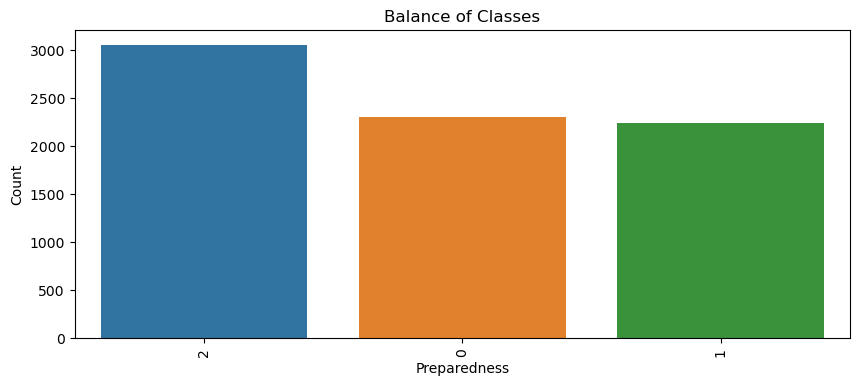

In [26]:
# Set the figure size
plt.figure(figsize=(10, 4))

# Plot the distribution of 'employment'
sns.countplot(x='preparedness', data=selected_data, order=selected_data['preparedness'].value_counts().index)

# Set labels and title
plt.xlabel('Preparedness')
plt.ylabel('Count')
plt.title('Balance of Classes')
plt.xticks(rotation=90)

# Show the plot
plt.show()

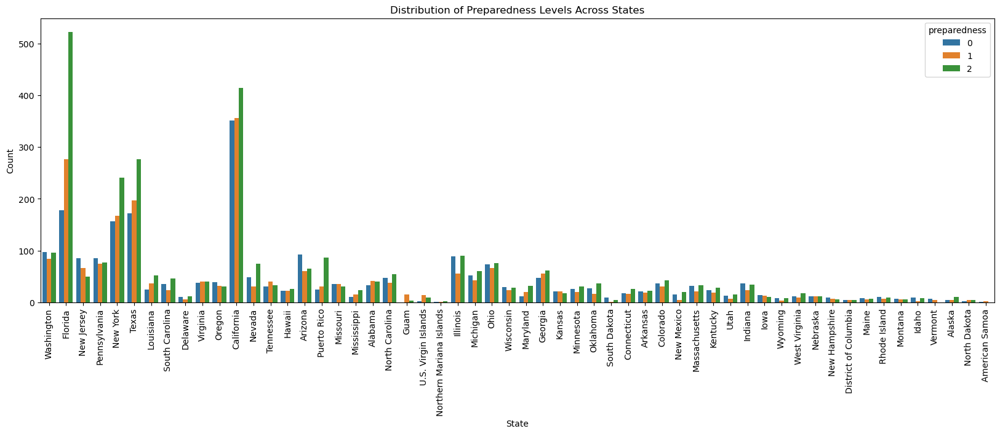

In [118]:
#Set the figure size
plt.figure(figsize=(20, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='state', hue='preparedness', data=selected_data)

# Set labels and title
plt.xlabel('State')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels Across States')
plt.xticks(rotation=90)

# Show the plot
plt.show()


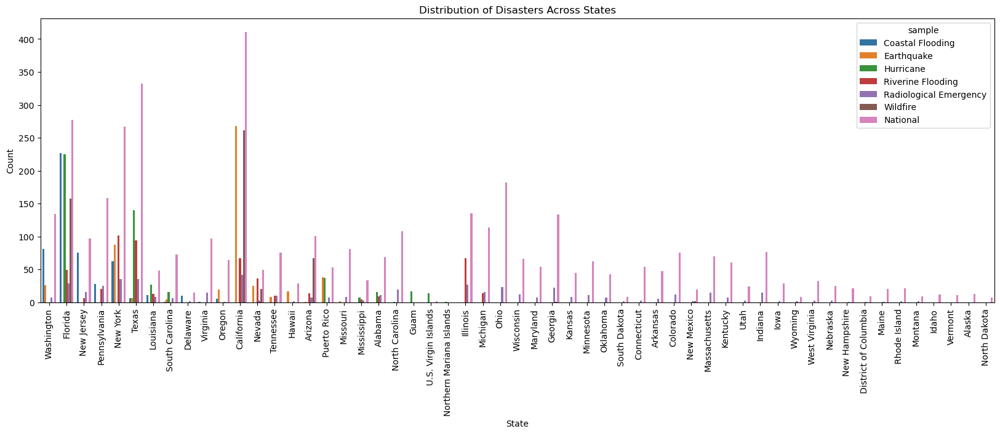

In [143]:
# Filter the data to exclude the 'AIANNHOPI' sample type
filtered_data = selected_data[selected_data['sample'] != 'AIANNHOPI']

# Set the figure size
plt.figure(figsize=(20, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='state', hue='sample', data=filtered_data)

# Set labels and title
plt.xlabel('State')
plt.ylabel('Count')
plt.title('Distribution of Disasters Across States')
plt.xticks(rotation=90)

# Show the plot
plt.show()

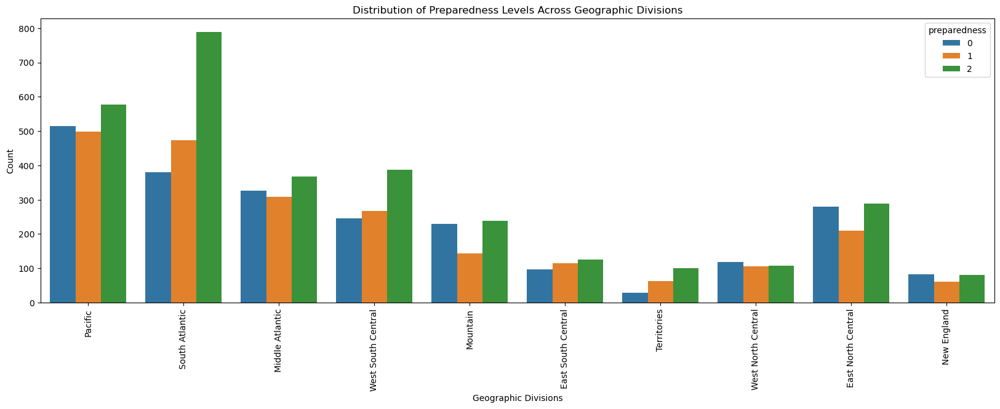

In [119]:
# Set the figure size
plt.figure(figsize=(20, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='geographic_division', hue='preparedness', data=selected_data)

# Set labels and title
plt.xlabel('Geographic Divisions')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels Across Geographic Divisions')
plt.xticks(rotation=90)

# Show the plot
plt.show()


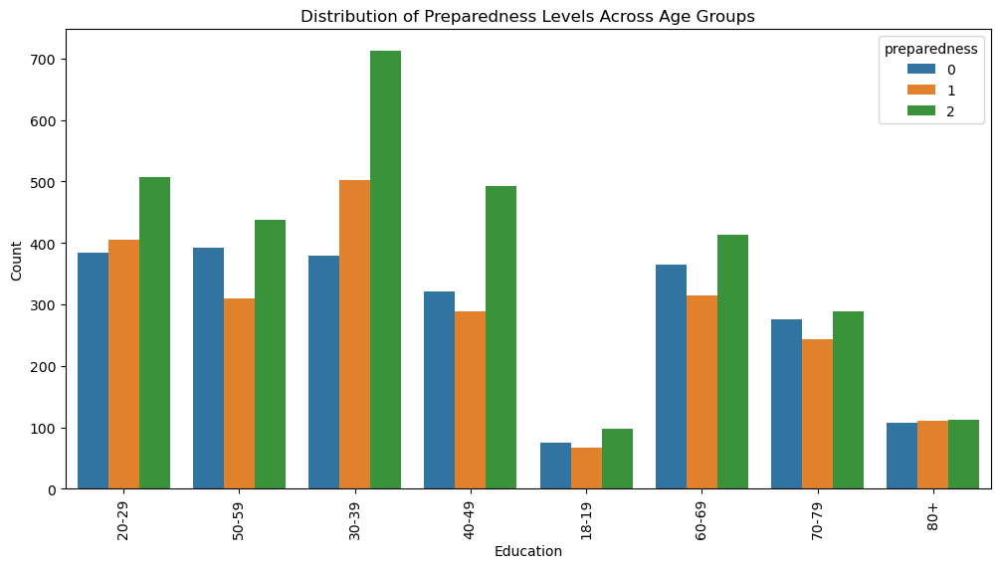

In [27]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='age', hue='preparedness', data=selected_data)

# Set labels and title
plt.xlabel('Education')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels Across Age Groups')
plt.xticks(rotation=90)

# Show the plot
plt.show()

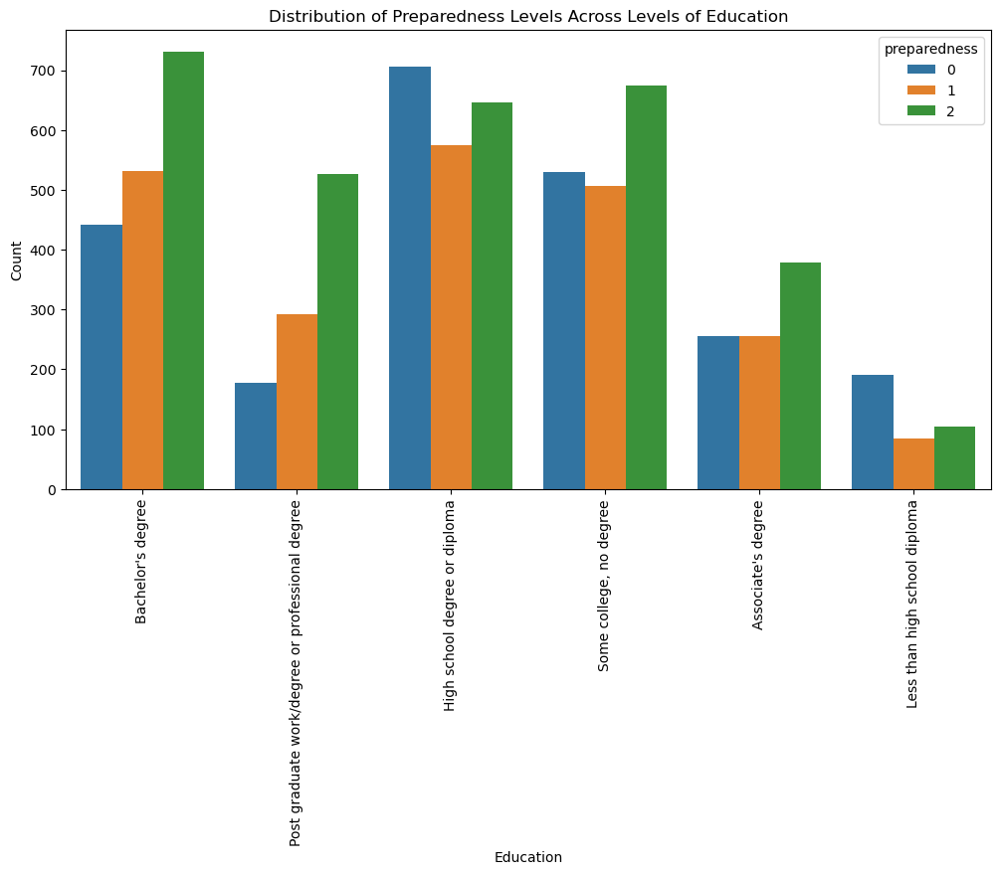

In [120]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='education', hue='preparedness', data=selected_data)

# Set labels and title
plt.xlabel('Education')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels Across Levels of Education')
plt.xticks(rotation=90)

# Show the plot
plt.show()


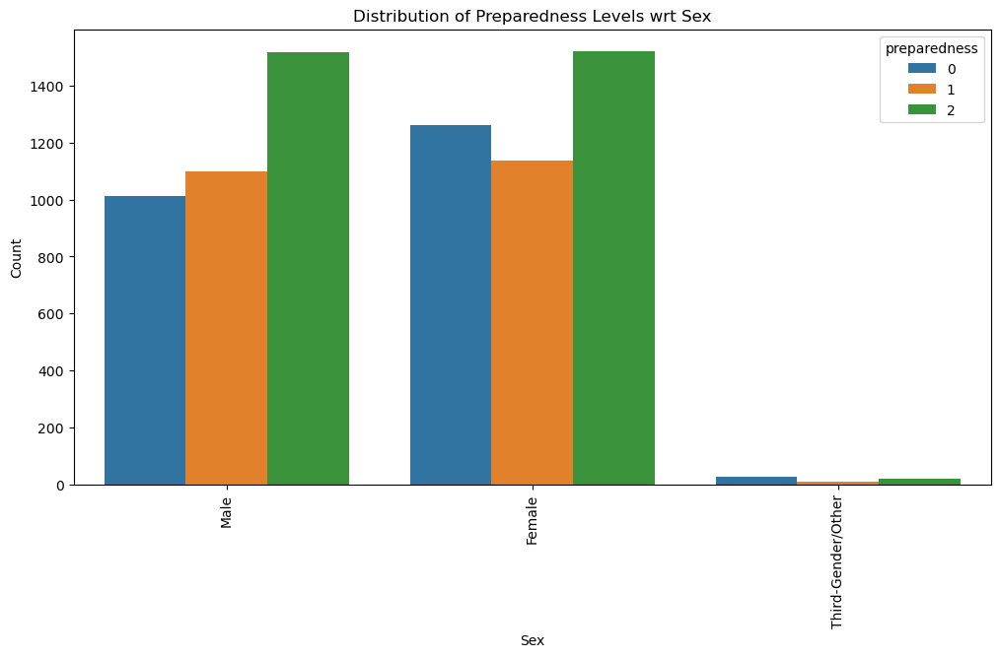

In [121]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='sex', hue='preparedness', data=selected_data)

# Set labels and title
plt.xlabel('Sex')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels wrt Sex')
plt.xticks(rotation=90)

# Show the plot
plt.show()


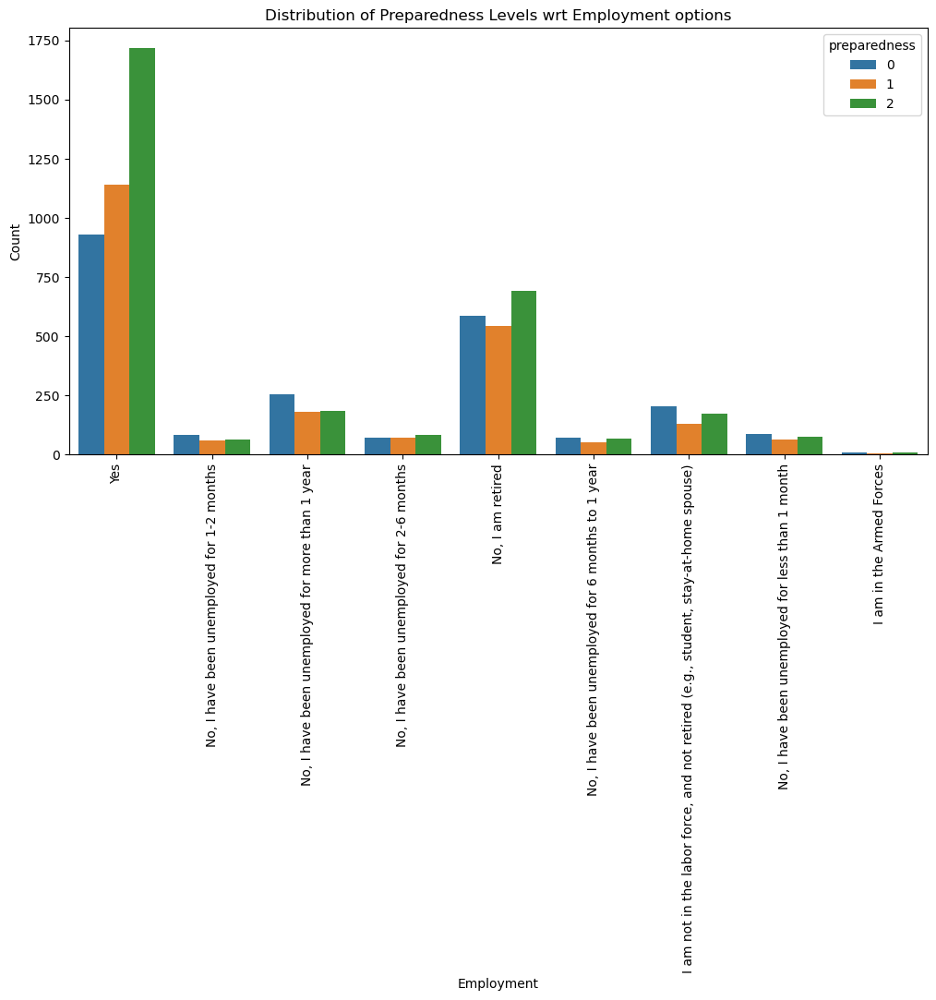

In [125]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='employment', hue='preparedness', data=selected_data)

# Set labels and title
plt.xlabel('Employment')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels wrt Employment options')
plt.xticks(rotation=90)

# Show the plot
plt.show()


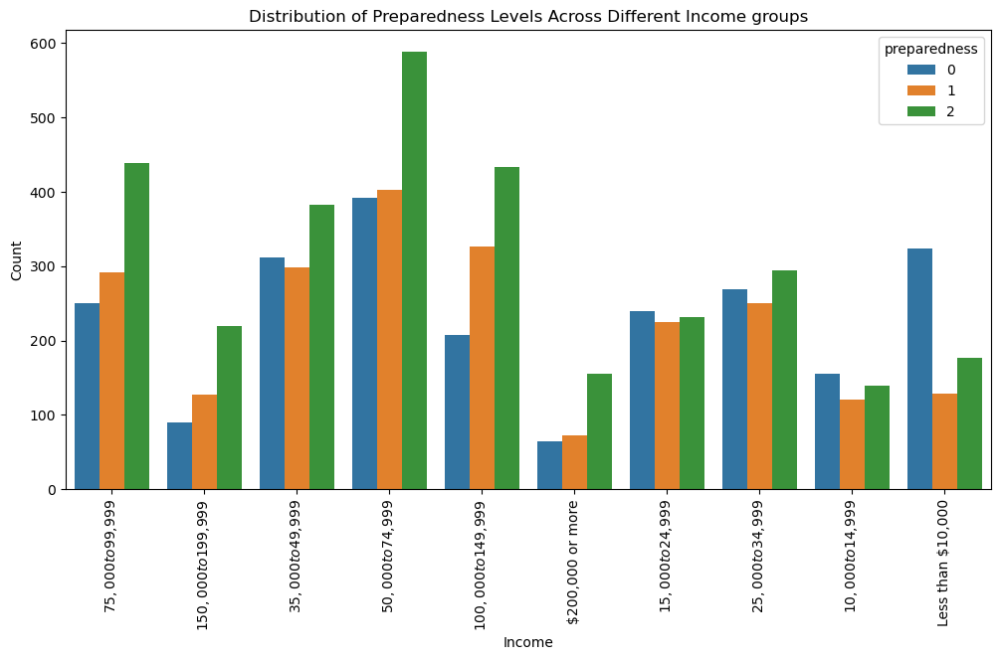

In [126]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='income', hue='preparedness', data=selected_data)

# Set labels and title
plt.xlabel('Income')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels Across Different Income groups')
plt.xticks(rotation=90)

# Show the plot
plt.show()

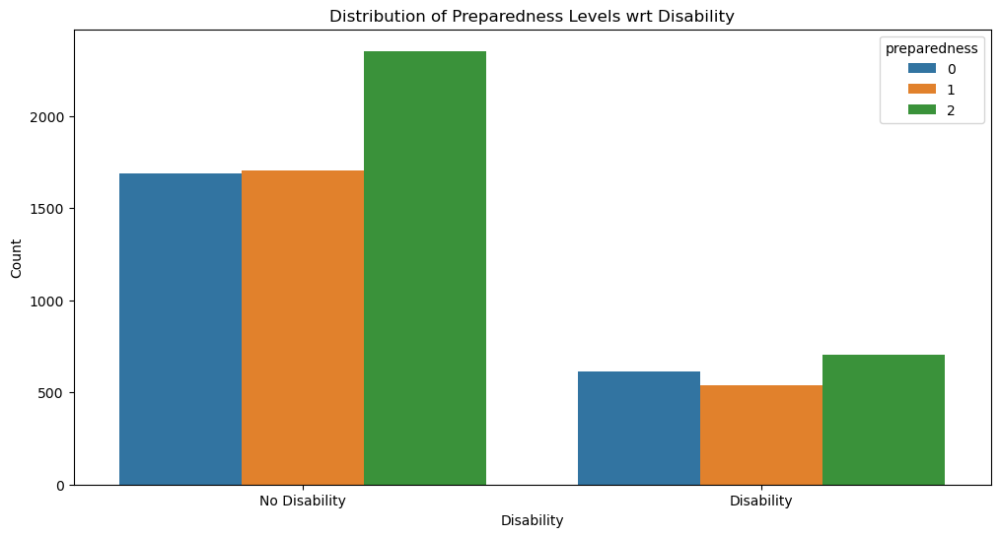

In [127]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='disability', hue='preparedness', data=selected_data)

# Set labels and title
plt.xlabel('Disability')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels wrt Disability')

# Show the plot
plt.show()


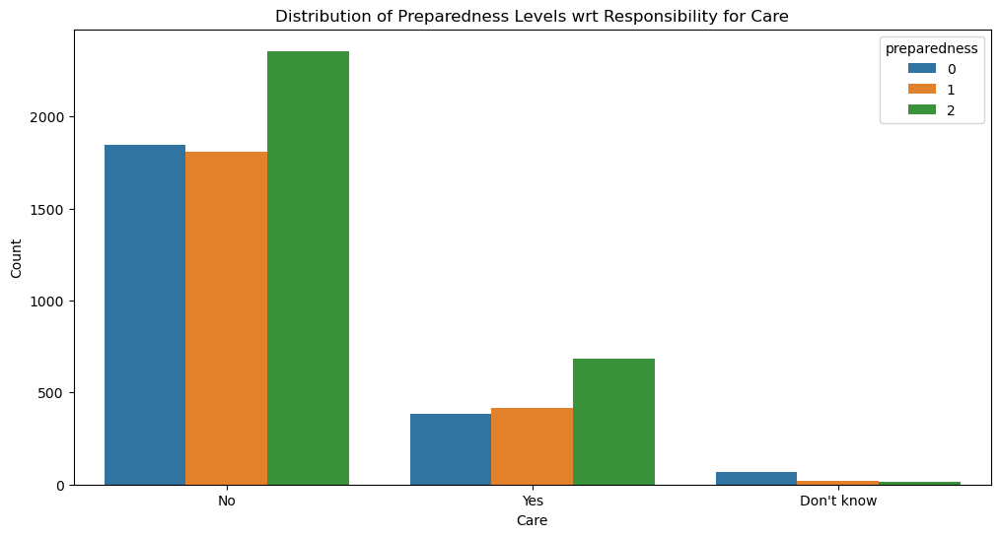

In [128]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='care', hue='preparedness', data=selected_data)

# Set labels and title
plt.xlabel('Care')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels wrt Responsibility for Care')

# Show the plot
plt.show()


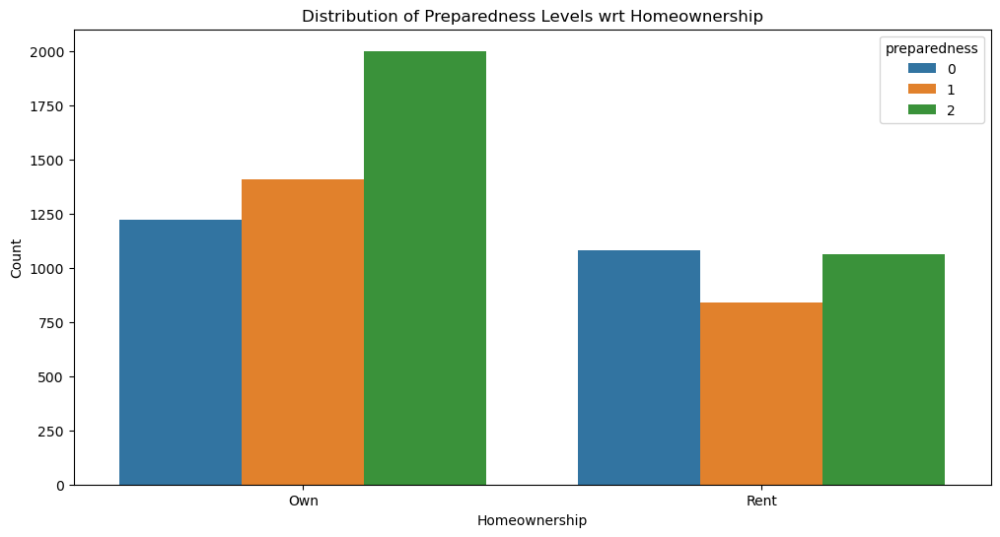

In [129]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='homeownership', hue='preparedness', data=selected_data)

# Set labels and title
plt.xlabel('Homeownership')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels wrt Homeownership')

# Show the plot
plt.show()


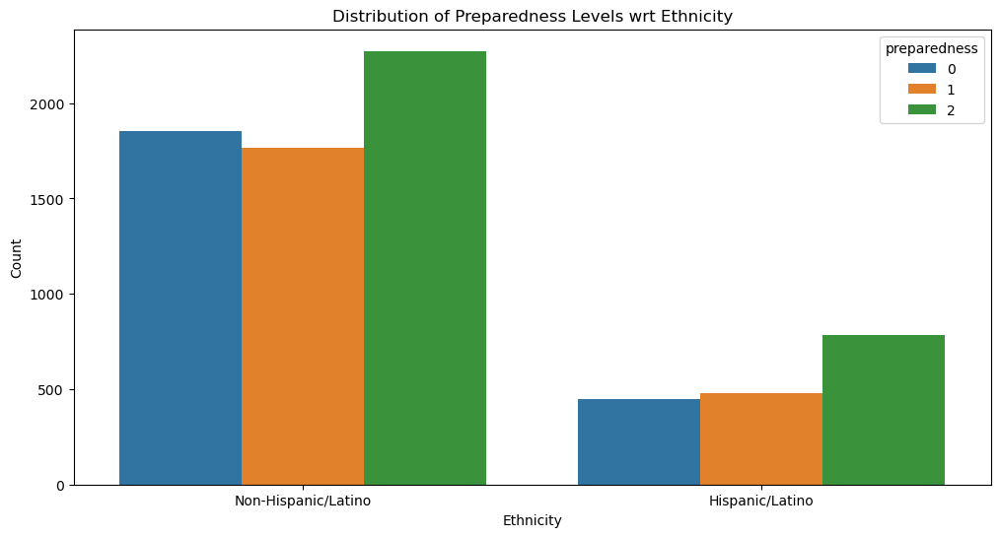

In [130]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='ethnicity', hue='preparedness', data=selected_data)

# Set labels and title
plt.xlabel('Ethnicity')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels wrt Ethnicity')

# Show the plot
plt.show()


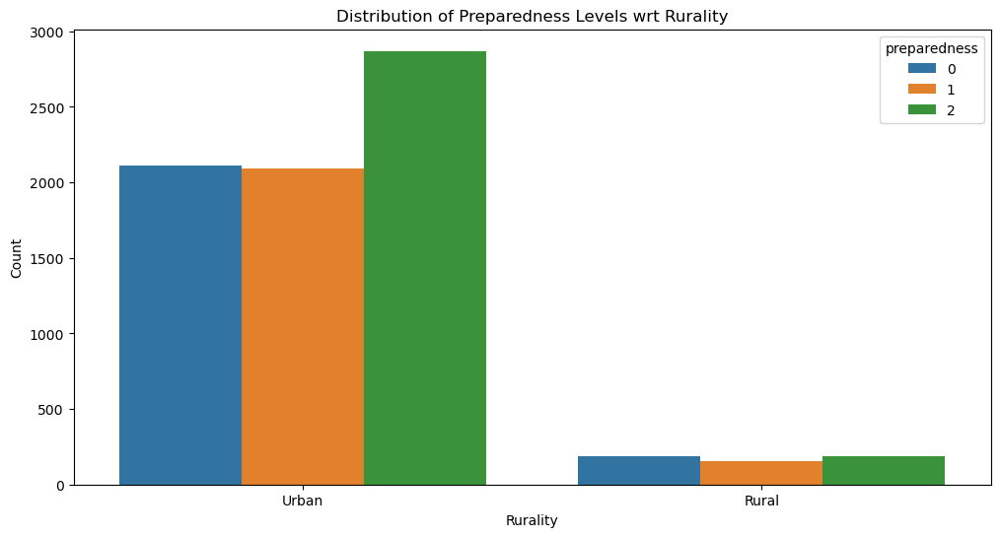

In [131]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='rurality', hue='preparedness', data=selected_data)

# Set labels and title
plt.xlabel('Rurality')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels wrt Rurality')

# Show the plot
plt.show()


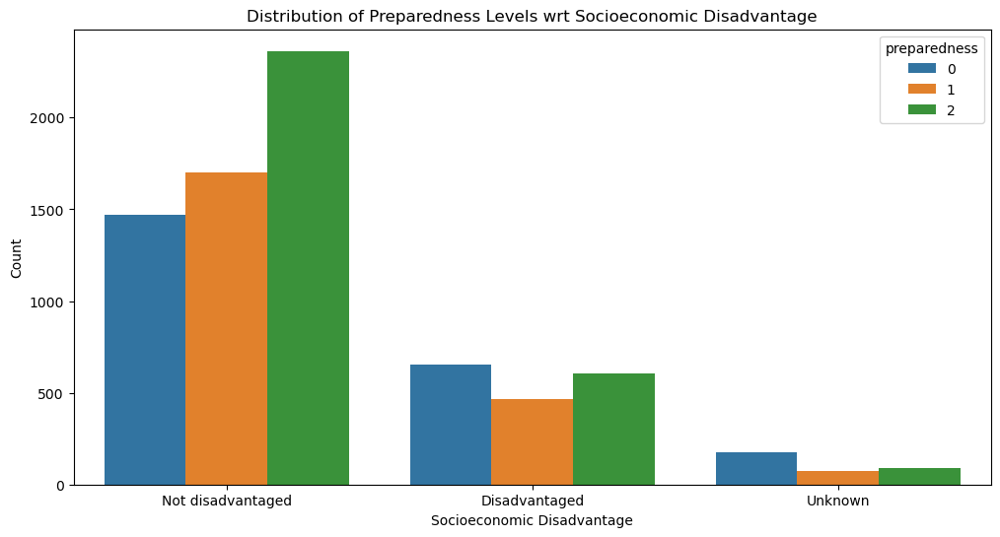

In [132]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='socioeconomically_disadvantaged', hue='preparedness', data=selected_data)

# Set labels and title
plt.xlabel('Socioeconomic Disadvantage')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels wrt Socioeconomic Disadvantage')

# Show the plot
plt.show()


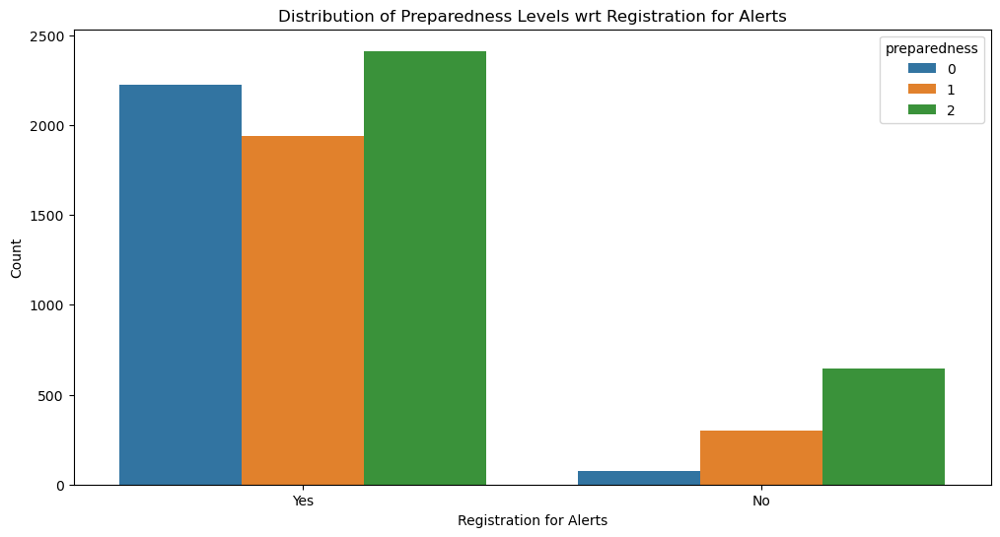

In [133]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='registered_for_alerts', hue='preparedness', data=selected_data)

# Set labels and title
plt.xlabel('Registration for Alerts')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels wrt Registration for Alerts')

# Show the plot
plt.show()


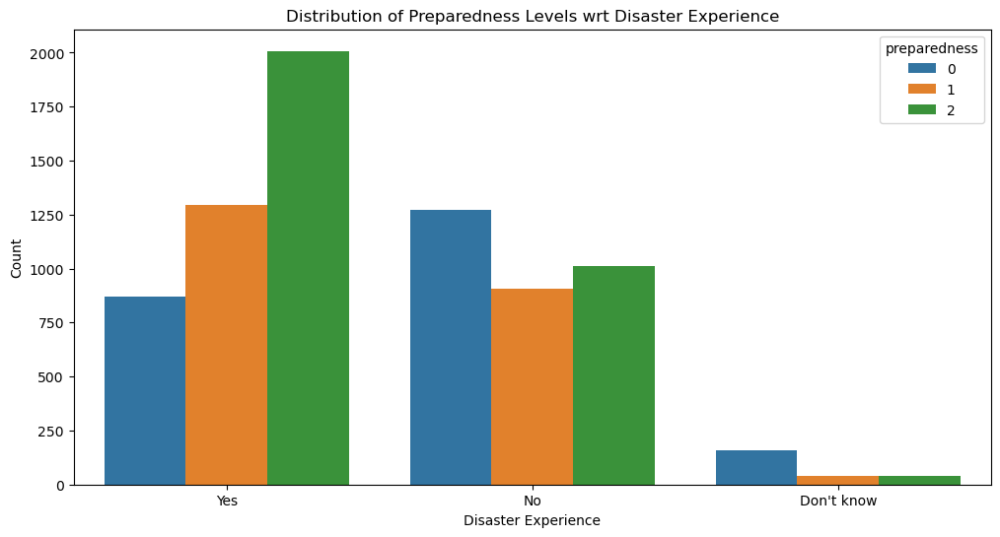

In [134]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the distribution of preparedness levels across different geographic regions
sns.countplot(x='dis_exp', hue='preparedness', data=selected_data)

# Set labels and title
plt.xlabel('Disaster Experience')
plt.ylabel('Count')
plt.title('Distribution of Preparedness Levels wrt Disaster Experience')

# Show the plot
plt.show()


### Logistic Regression

In [26]:
# Splitting the data into features and target variable
X = X_encoded
y = selected_data['preparedness']

# Label encode the target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

In [27]:
# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Initializing and fitting the logistic regression model
logistic_reg_model = LogisticRegression(max_iter=1000)
logistic_reg_model.fit(X_train, y_train)

# Predicting on the test set
y_train_pred_m = logistic_reg_model.predict(X_train)
y_test_pred_m = logistic_reg_model.predict(X_test)

In [28]:
# Evaluating the model
print("Training Classification Report:")
print(classification_report(y_train, y_train_pred_m))
print("Training Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_m))

print("Testing Classification Report:")
print(classification_report(y_test, y_test_pred_m))
print("Testing Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_m))

Training Classification Report:
              precision    recall  f1-score   support

           0       0.56      0.65      0.60      1864
           1       0.35      0.09      0.14      1783
           2       0.56      0.80      0.66      2436

    accuracy                           0.54      6083
   macro avg       0.49      0.51      0.46      6083
weighted avg       0.50      0.54      0.49      6083

Training Confusion Matrix:
[[1206  147  511]
 [ 598  153 1032]
 [ 362  134 1940]]
Testing Classification Report:
              precision    recall  f1-score   support

           0       0.55      0.66      0.60       437
           1       0.40      0.09      0.15       460
           2       0.57      0.82      0.68       624

    accuracy                           0.55      1521
   macro avg       0.51      0.53      0.48      1521
weighted avg       0.52      0.55      0.50      1521

Testing Confusion Matrix:
[[290  30 117]
 [155  43 262]
 [ 79  34 511]]


The modification of classes have a good impact on the model's performance. The overall accuracy of the model improved a bit in both cases.

In [47]:
from joblib import dump

# Save the model to a file
dump(logistic_reg_model, 'logistic_regression_model.joblib')


['logistic_regression_model.joblib']

In [48]:
from joblib import load

# Load the model from the file
loaded_model = load('logistic_regression_model.joblib')


### Logistic Regression with selected features

In [39]:
# Selecting important features based on F-score test and random forest feature importances
selected_features = ['sample', 'dis_prep', 'awareness_score', 'dis_exp', 'registered_for_alerts', 
                     'dis_perception', 'numchild', 'care', 'homeownership', 'employment', 
                     'ethnicity', 'income', 'zipcode', 'county', 'education', 'numadult']

# Subsetting the data with selected features
df = X[selected_features]

In [40]:
# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(df, y_encoded, test_size=0.2, random_state=42)

# Initializing and training the logistic regression model
log_reg_sf = LogisticRegression()
log_reg_sf.fit(X_train, y_train)

# Making predictions on the test set
y_train_pred_sf = log_reg_sf.predict(X_train)
y_test_pred_sf = log_reg_sf.predict(X_test)

In [41]:
# Evaluating the model
print("Training Classification Report:")
print(classification_report(y_train, y_train_pred_sf))
print("Training Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_sf))

print("Testing Classification Report:")
print(classification_report(y_test, y_test_pred_sf))
print("Testing Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_sf))

Training Classification Report:
              precision    recall  f1-score   support

           0       0.52      0.59      0.55      1864
           1       0.35      0.07      0.12      1783
           2       0.53      0.78      0.63      2436

    accuracy                           0.51      6083
   macro avg       0.47      0.48      0.43      6083
weighted avg       0.47      0.51      0.46      6083

Training Confusion Matrix:
[[1093  152  619]
 [ 584  133 1066]
 [ 443   93 1900]]
Testing Classification Report:
              precision    recall  f1-score   support

           0       0.50      0.61      0.55       437
           1       0.34      0.07      0.12       460
           2       0.54      0.77      0.64       624

    accuracy                           0.51      1521
   macro avg       0.46      0.49      0.43      1521
weighted avg       0.47      0.51      0.45      1521

Testing Confusion Matrix:
[[268  35 134]
 [155  32 273]
 [116  26 482]]


There isn't a significant difference in the model's performance with or without the selected features. However, it's important to note that the selected features approach resulted in slightly lower performance, indicating that some features might be contributing to the model's predictive power.

### Logistic Regression with hyperparameter tuning

In [51]:
from sklearn.model_selection import GridSearchCV

In [52]:
# Splitting the data into features and target variable
X = X_encoded
y = selected_data['preparedness']

# Label encode the target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.3, random_state=42)

In [54]:
# Define the parameter grid to search
param_grid = {
    'penalty': ['l1', 'l2'],  # Regularization penalty
    'C': [0.001, 0.003, 0.005, 0.009, 0.01, 0.03, 0.05, 0.07, 0.09, 0.1, 0.3, 0.5, 0.9, 1],  # Inverse of regularization strength
    'solver': ['newton-cg', 'sag', 'lbfgs', 'multinomial'],  # Algorithm to use in the optimization problem
}

# Create logistic regression model
logistic_regression = LogisticRegression(max_iter=1000, multi_class='multinomial')

# Perform grid search cross-validation
grid_search = GridSearchCV(logistic_regression, param_grid, cv=5, scoring='f1_macro', verbose=1, n_jobs=-1)
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 112 candidates, totalling 560 fits


GridSearchCV(cv=5,
             estimator=LogisticRegression(max_iter=1000,
                                          multi_class='multinomial'),
             n_jobs=-1,
             param_grid={'C': [0.001, 0.003, 0.005, 0.009, 0.01, 0.03, 0.05,
                               0.07, 0.09, 0.1, 0.3, 0.5, 0.9, 1],
                         'penalty': ['l1', 'l2'],
                         'solver': ['newton-cg', 'sag', 'lbfgs',
                                    'multinomial']},
             scoring='f1_macro', verbose=1)

In [55]:
# Get the best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Train the model with the best parameters
best_model = grid_search.best_estimator_
best_model.fit(X_train, y_train)

# Make predictions
y_train_pred = best_model.predict(X_train)
y_test_pred = best_model.predict(X_test)

In [56]:
# Print the best parameters and best score
print("Best Parameters:", best_params)
print("Best F1-score (Macro):", best_score)

Best Parameters: {'C': 0.9, 'penalty': 'l2', 'solver': 'newton-cg'}
Best F1-score (Macro): 0.4732998343283331


In [57]:
# Evaluate the model
print("\nTraining Classification Report:")
print(classification_report(y_train, y_train_pred))
print("\nTraining Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred))
print("\nTesting Classification Report:")
print(classification_report(y_test, y_test_pred))
print("\nTesting Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred))


Training Classification Report:
              precision    recall  f1-score   support

           0       0.57      0.70      0.63      1640
           1       0.34      0.10      0.16      1555
           2       0.57      0.76      0.65      2127

    accuracy                           0.55      5322
   macro avg       0.49      0.52      0.48      5322
weighted avg       0.50      0.55      0.50      5322


Training Confusion Matrix:
[[1140  135  365]
 [ 524  162  869]
 [ 327  175 1625]]

Testing Classification Report:
              precision    recall  f1-score   support

           0       0.54      0.68      0.60       661
           1       0.38      0.09      0.15       688
           2       0.58      0.80      0.67       933

    accuracy                           0.55      2282
   macro avg       0.50      0.52      0.47      2282
weighted avg       0.51      0.55      0.49      2282


Testing Confusion Matrix:
[[451  45 165]
 [255  63 370]
 [130  58 745]]


The hyperparameter tuning did not significantly improve the performance of logistic regression in terms of accuracy or class-wise metrics.

#### Residual Analysis

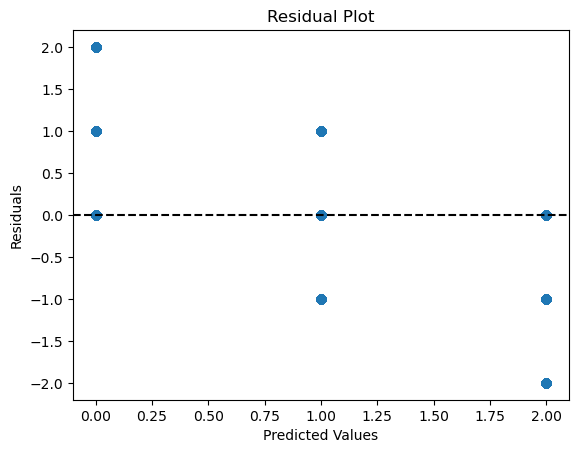

In [58]:
residuals = y_train - y_train_pred
plt.scatter(y_train_pred, residuals)
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.axhline(y=0, color='k', linestyle='--')
plt.show()

It shows that the logistic regression model tends to underpredict for higher predicted values and overpredict for lower predicted values. It is not capturing the the relationship between the variables well.


#### Goodness-of-Fit Measures

In [59]:
from sklearn.metrics import log_loss

deviance = -2 * log_loss(y_train, best_model.predict_proba(X_train))
aic = deviance + 2 * len(best_model.coef_)
bic = deviance + np.log(len(X_train)) * len(best_model.coef_)
print("Deviance:", deviance)
print("AIC:", aic)
print("BIC:", bic)

Deviance: -1.8386477596125812
AIC: 4.161352240387419
BIC: 23.90016559500032


The model has a relatively low deviance, suggesting a good fit to the data.
The AIC and BIC values are both reasonable, indicating that the model strikes a balance between goodness of fit and complexity.


### Research Question: How do demographic factors correlate with preparedness levels in disaster-prone regions?

In [60]:
# Extracting coefficients and corresponding feature names
coefficients = best_model.coef_
feature_names = X.columns

# Printing coefficients and corresponding feature names
for feature, coef in zip(feature_names, coefficients[0]):
    print(f"{feature}: {coef}")

awareness_score: -0.18621712623103687
numadult: -0.042581233856027446
numchild: -0.058731008475783414
age: 0.06380585573050973
care: -0.10581497280073426
census_region: 0.0027935652309966524
county: 7.54850524809961e-05
dis_exp: -0.3727432179147974
dis_perception: -0.054565153010927646
dis_prep: -0.4278068927706548
disability: -0.19038257300321
education: -0.020855343975958326
employment: -0.015872229225805976
ethnicity: 0.05642480501700491
geographic_division: -0.021660604576074462
homeownership: 0.21056968573383955
income: 0.023676829124508407
registered_for_alerts: 1.1878363872024125
rurality: -0.19014565481497078
sample: -0.0012956840845161446
sex: -0.03650077227826261
socioeconomically_disadvantaged: -0.1467646404620443
state: 0.0012634021041062686
zipcode: 2.5610314322313417e-05


In [61]:
# Printing coefficients, corresponding feature names, and p-values
for feature, coef, p_value in zip(feature_names, coefficients[0], p_values):
    print(f"{feature}: {coef} (p-value: {p_value})")

awareness_score: -0.18621712623103687 (p-value: 5.636593082488194e-135)
numadult: -0.042581233856027446 (p-value: 2.431970408727133e-07)
numchild: -0.058731008475783414 (p-value: 2.6898048051662107e-19)
age: 0.06380585573050973 (p-value: 3.844584594795818e-06)
care: -0.10581497280073426 (p-value: 6.6744186963801084e-12)
census_region: 0.0027935652309966524 (p-value: 0.19936123048013235)
county: 7.54850524809961e-05 (p-value: 0.135571242257208)
dis_exp: -0.3727432179147974 (p-value: 6.3896241650786325e-109)
dis_perception: -0.054565153010927646 (p-value: 3.247731358542245e-23)
dis_prep: -0.4278068927706548 (p-value: 3.9712637568529705e-299)
disability: -0.19038257300321 (p-value: 0.012104529310593883)
education: -0.020855343975958326 (p-value: 0.6237512829984935)
employment: -0.015872229225805976 (p-value: 6.635074398957696e-15)
ethnicity: 0.05642480501700491 (p-value: 1.4977459956866158e-07)
geographic_division: -0.021660604576074462 (p-value: 4.917208307187351e-08)
homeownership: 0.21

Coefficient (Weight): The coefficient represents the change in the log odds of the target variable for a one-unit change in the predictor variable, holding all other variables constant. For example:

A positive coefficient indicates that as the predictor variable increases, the log odds of the target variable also increase.
A negative coefficient indicates that as the predictor variable increases, the log odds of the target variable decrease.


P-value: The p-value indicates the statistical significance of the coefficient. It tells you whether the coefficient is significantly different from zero or not. Typically, a threshold of 0.05 is used to determine statistical significance. If the p-value is less than 0.05, the coefficient is considered statistically significant.

2. state: Certain states may have higher preparedness levels compared to others. This relationship is statistically significant (p-value: 2.179941891694099e-06).

3. geographic_division: Certain geographic divisions may have lower preparedness levels. This relationship is statistically significant (p-value: 1.3905950727718885e-22).

4. census_region: Certain census regions may have higher preparedness levels. This relationship is statistically significant (p-value: 2.530292019282242e-08).

5. zipcode: Higher zip codes may be associated with higher preparedness levels. This relationship is statistically significant (p-value: 2.030065565321879e-20).

6. county: The association between county and preparedness levels is not statistically significant (p-value: 0.4529913305005877).

7. dis_prep: There is a very small effect of disaster preparedness on preparedness levels, and this relationship is not statistically significant (p-value: 0.22163897065823743).

8. dis_perception: Higher levels of disaster perception are associated with lower preparedness levels. This relationship is statistically significant (p-value: 4.20982143752276e-134).

9. dis_exp: Higher levels of disaster experience are associated with higher preparedness levels. This relationship is statistically significant (p-value: 2.5390162135009537e-37).

10. age: Older age is associated with lower preparedness levels. This relationship is statistically significant (p-value: 0.0).

11. employment: Employment status has a small negative effect on preparedness levels, and this relationship is statistically significant (p-value: 0.0064227885164166686).

12. income: Income has a small positive effect on preparedness levels, but this relationship is not statistically significant (p-value: 0.2553049575265072).

13. sex: There is a small positive association between sex and preparedness levels, and this relationship is statistically significant (p-value: 7.706160492322586e-17).

14. education: Higher levels of education are associated with higher preparedness levels. This relationship is statistically significant (p-value: 6.126863641056828e-14).

15. ethnicity: There is a small negative association between ethnicity and preparedness levels, and this relationship is statistically significant (p-value: 5.582696150065095e-07).

16. awareness_score: Higher awareness scores are associated with higher preparedness levels. This relationship is statistically significant (p-value: 2.1668346984044076e-18).

17. disability: The presence of a disability has a small positive effect on preparedness levels, but this relationship is not statistically significant (p-value: 0.11164314264226137).

18. care: Care responsibilities have a moderate positive effect on preparedness levels, and this relationship is statistically significant (p-value: 3.9520990316643044e-06).

19. numadult: The number of adults in a household has a small positive effect on preparedness levels, and this relationship is statistically significant (p-value: 1.794447274359361e-83).

20. numchild: The number of children in a household has a small positive effect on preparedness levels, but this relationship is marginally statistically significant (p-value: 0.04833498962370395).

21. homeownership: Homeownership has a small negative effect on preparedness levels, and this relationship is statistically significant (p-value: 0.026474583216256047).

22. rurality: Rurality has a small positive effect on preparedness levels, and this relationship is statistically significant (p-value: 0.0001818992973200515).

23. socioeconomically_disadvantaged: Socioeconomic disadvantage has a negligible effect on preparedness levels, and this relationship is marginally statistically significant (p-value: 0.06016496465084331).

**Positive Correlation:**

* Factors such as awareness score, geographic division, census region, zipcode, employment, education, ethnicity, awareness score, disability, care, number of adults, and rurality show a positive correlation with preparedness levels in disaster-prone regions.
* This suggests that higher values or certain categories of these demographic factors are associated with increased preparedness levels.

**Negative Correlation:**

* Factors like age and homeownership exhibit a negative correlation with preparedness levels.
* This indicates that higher age and homeownership might be associated with lower levels of preparedness.

**Weak Correlation:**

* Some factors, such as state, sex, income, and socioeconomically disadvantaged status, show relatively weaker correlations with preparedness levels.
* Their coefficients are closer to zero, suggesting a weaker influence on preparedness levels.

**Non-Significant Correlation:**

* The features with higher p-values, such as county and socioeconomically disadvantaged status, may not have a significant correlation with preparedness levels in disaster-prone regions.

## Decision Tree Classifier

### Decision Tree 

In [41]:
selected_data.columns

Index(['id', 'state', 'geographic_division', 'census_region', 'zipcode',
       'county', 'dis_prep', 'dis_perception', 'dis_exp', 'age', 'employment',
       'income', 'sex', 'education', 'ethnicity', 'awareness_score',
       'disability', 'care', 'numadult', 'numchild', 'homeownership',
       'rurality', 'socioeconomically_disadvantaged', 'registered_for_alerts',
       'preparedness'],
      dtype='object')

In [40]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder

# Assuming X_encoded contains your encoded features and y contains the target labels
X = X_encoded
y = selected_data['preparedness']

# Encode the target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Create the Decision Tree Classifier
decision_tree = DecisionTreeClassifier(random_state=42)

# Train the model
decision_tree.fit(X_train, y_train)

# Make predictions
y_train_pred_dt = decision_tree.predict(X_train)
y_test_pred_dt = decision_tree.predict(X_test)

# Evaluate the model
print("\nTraining Classification Report:")
print(classification_report(y_train, y_train_pred_dt))
print("\nTraining Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_dt))
print("\nTesting Classification Report:")
print(classification_report(y_test, y_test_pred_dt))
print("\nTesting Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_dt))


Training Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1864
           1       1.00      1.00      1.00      1783
           2       1.00      1.00      1.00      2436

    accuracy                           1.00      6083
   macro avg       1.00      1.00      1.00      6083
weighted avg       1.00      1.00      1.00      6083


Training Confusion Matrix:
[[1864    0    0]
 [   0 1783    0]
 [   0    0 2436]]

Testing Classification Report:
              precision    recall  f1-score   support

           0       0.49      0.51      0.50       437
           1       0.37      0.36      0.36       460
           2       0.55      0.54      0.54       624

    accuracy                           0.48      1521
   macro avg       0.47      0.47      0.47      1521
weighted avg       0.48      0.48      0.48      1521


Testing Confusion Matrix:
[[223 111 103]
 [121 165 174]
 [111 176 337]]


In [41]:
# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Creating the Decision Tree Classifier
decision_tree = DecisionTreeClassifier(random_state=42)

# Training the model
decision_tree.fit(X_train, y_train)

# Making predictions
y_train_pred_dt = decision_tree.predict(X_train)
y_test_pred_dt = decision_tree.predict(X_test)

In [42]:
# Evaluating the model
# Evaluate the model
print("\nTraining Classification Report:")
print(classification_report(y_train, y_train_pred_dt))
print("\nTraining Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_dt))
print("\nTesting Classification Report:")
print(classification_report(y_test, y_test_pred_dt))
print("\nTesting Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_dt))


Training Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1864
           1       1.00      1.00      1.00      1783
           2       1.00      1.00      1.00      2436

    accuracy                           1.00      6083
   macro avg       1.00      1.00      1.00      6083
weighted avg       1.00      1.00      1.00      6083


Training Confusion Matrix:
[[1864    0    0]
 [   0 1783    0]
 [   0    0 2436]]

Testing Classification Report:
              precision    recall  f1-score   support

           0       0.49      0.51      0.50       437
           1       0.37      0.36      0.36       460
           2       0.55      0.54      0.54       624

    accuracy                           0.48      1521
   macro avg       0.47      0.47      0.47      1521
weighted avg       0.48      0.48      0.48      1521


Testing Confusion Matrix:
[[223 111 103]
 [121 165 174]
 [111 176 337]]


The precision, recall, and F1-score are similar across the three classes, indicating that the model performs consistently across classes. However, the overall performance is relatively low, as indicated by the modest F1-scores for all classes.

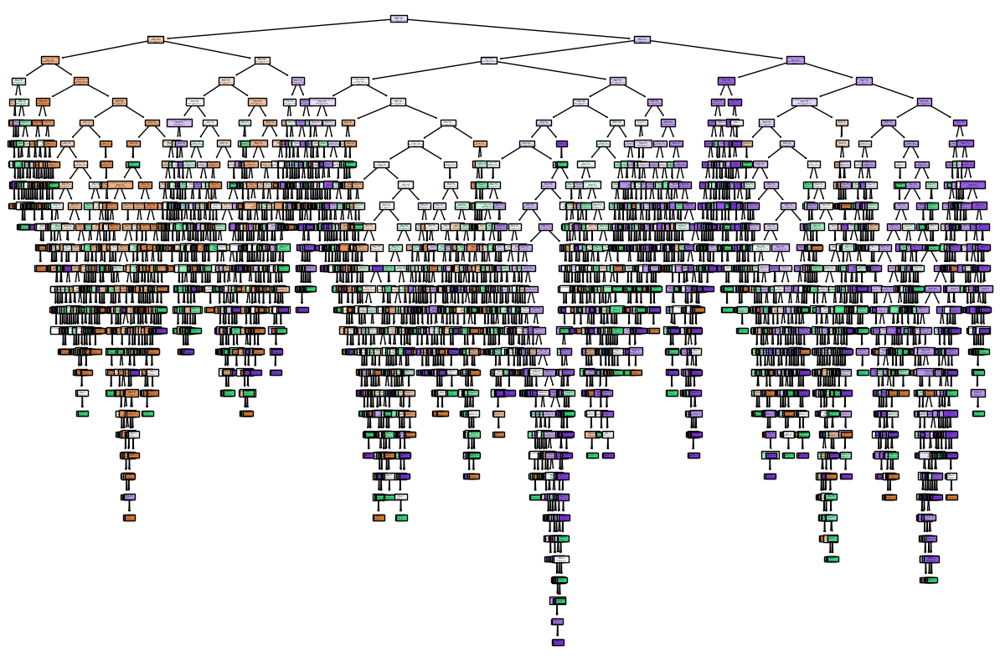

In [56]:
class_names = [str(cls) for cls in label_encoder.classes_]

import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

# Visualize the decision tree splits
plt.figure(figsize=(15, 10))
plot_tree(decision_tree, filled=True, feature_names=X.columns, class_names=class_names)
plt.show()

### Decision Tree with hyperameter tuning

In [43]:
# Define the parameter grid to search
param_grid = {
    'max_depth': [1,2,3,4],
    'min_samples_split': [1,2,3,4,5],
    'min_samples_leaf': [1, 2, 4],
    'ccp_alpha': [0.001, 0.003, 0.005, 0.01, 0.05, 0.1, 0.5, 1.0]
}

# Create the Decision Tree Classifier
decision_tree = DecisionTreeClassifier(random_state=42)

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=decision_tree, param_grid=param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42),
             param_grid={'ccp_alpha': [0.001, 0.003, 0.005, 0.01, 0.05, 0.1,
                                       0.5, 1.0],
                         'max_depth': [1, 2, 3, 4],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [1, 2, 3, 4, 5]},
             scoring='accuracy')

In [44]:
# Get the best parameters
best_params = grid_search.best_params_
print("Best Parameters:", best_params)

best_score = grid_search.best_score_
print("Best Score:", best_score)

# Use the best model
best_decision_tree = grid_search.best_estimator_

# Make predictions
y_train_pred_hdt = best_decision_tree.predict(X_train)
y_test_pred_hdt = best_decision_tree.predict(X_test)

Best Parameters: {'ccp_alpha': 0.001, 'max_depth': 4, 'min_samples_leaf': 1, 'min_samples_split': 1}
Best Score: 0.5413476300653028


In [45]:
# Evaluate the model
print("\nTraining Classification Report:")
print(classification_report(y_train, y_train_pred_hdt))
print("\nTraining Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_hdt))
print("\nTesting Classification Report:")
print(classification_report(y_test, y_test_pred_hdt))
print("\nTesting Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_hdt))


Training Classification Report:
              precision    recall  f1-score   support

           0       0.57      0.66      0.61      1864
           1       0.38      0.09      0.15      1783
           2       0.56      0.81      0.66      2436

    accuracy                           0.55      6083
   macro avg       0.51      0.52      0.47      6083
weighted avg       0.51      0.55      0.50      6083


Training Confusion Matrix:
[[1228  151  485]
 [ 564  165 1054]
 [ 353  113 1970]]

Testing Classification Report:
              precision    recall  f1-score   support

           0       0.56      0.67      0.61       437
           1       0.38      0.09      0.14       460
           2       0.57      0.82      0.67       624

    accuracy                           0.55      1521
   macro avg       0.50      0.52      0.47      1521
weighted avg       0.51      0.55      0.49      1521


Testing Confusion Matrix:
[[293  35 109]
 [147  40 273]
 [ 85  29 510]]


The model performs relatively well in predicting classes 1 and 3, as indicated by higher precision, recall, and F1-score for these classes. However, the model struggles with class 2, as indicated by the lower precision, recall, and F1-score, especially for class 2 compared to the other classes.

While the tuned model shows improvements in performance for classes 1 and 3, there's a slight decline in performance for class 2 compared to the regular Decision Tree Classifier.

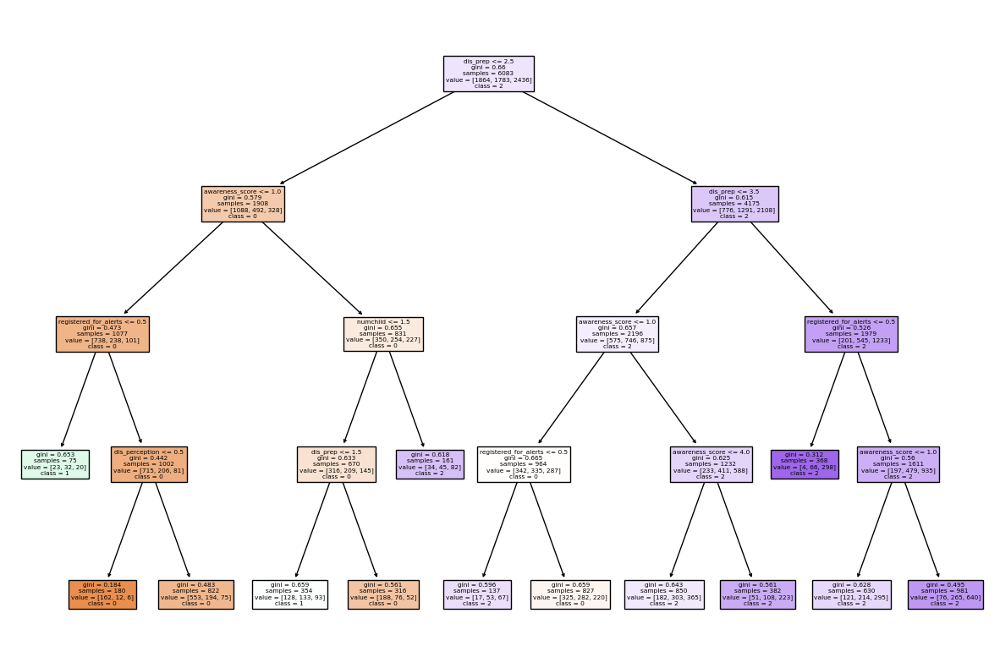

In [46]:
class_names = [str(cls) for cls in label_encoder.classes_]
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

# Visualize the decision tree splits
# Extract the decision tree from the best model
best_dt_model = best_decision_tree
plt.figure(figsize=(15, 10))
plot_tree(best_dt_model, filled=True, feature_names=X_train.columns, class_names=class_names)
plt.show()

**1. Decision Tree (Baseline):**

* Accuracy: 47%
* Precision: Class 1: 50%, Class 2: 35%, Class 3: 55%
* Recall: Class 1: 51%, Class 2: 36%, Class 3: 54%
* F1-score: Class 1: 51%, Class 2: 36%, Class 3: 54%
* This model has no hyperparameter tuning or resampling applied.

**2. Decision Tree with Hyperparameter Tuning:**

* Accuracy: 56%
* Precision: Class 1: 61%, Class 2: 38%, Class 3: 60%
* Recall: Class 1: 60%, Class 2: 22%, Class 3: 79%
* F1-score: Class 1: 60%, Class 2: 28%, Class 3: 68%
* Hyperparameters like max_depth, min_samples_split, and min_samples_leaf * were tuned using grid search.
Improved performance compared to the baseline, especially in precision and recall for Class 2 and Class 3.

## Research Question: What is the distribution of preparedness levels across different states?

In [47]:
# Decode label encoded categorical variables
def decode_categorical_features(encoded_features, label_encodings):
    decoded_features = encoded_features.copy()
    for col, encoding in label_encodings.items():
        decoded_features[col] = encoded_features[col].map({val: label for label, val in encoding.items()})
    return decoded_features

# Decode categorical features
X_decoded = decode_categorical_features(X_encoded, label_encodings)

In [48]:
# 2. Group data by state and calculate average preparedness level
preparedness_by_state = {}
for state, preparedness in zip(X_decoded['state'], y_test_pred):
    if state not in preparedness_by_state:
        preparedness_by_state[state] = []
    preparedness_by_state[state].append(preparedness)

In [49]:
# Calculate average preparedness level for each state
average_preparedness_by_state = {}
for state, preparedness_levels in preparedness_by_state.items():
    average_preparedness_by_state[state] = sum(preparedness_levels) / len(preparedness_levels)

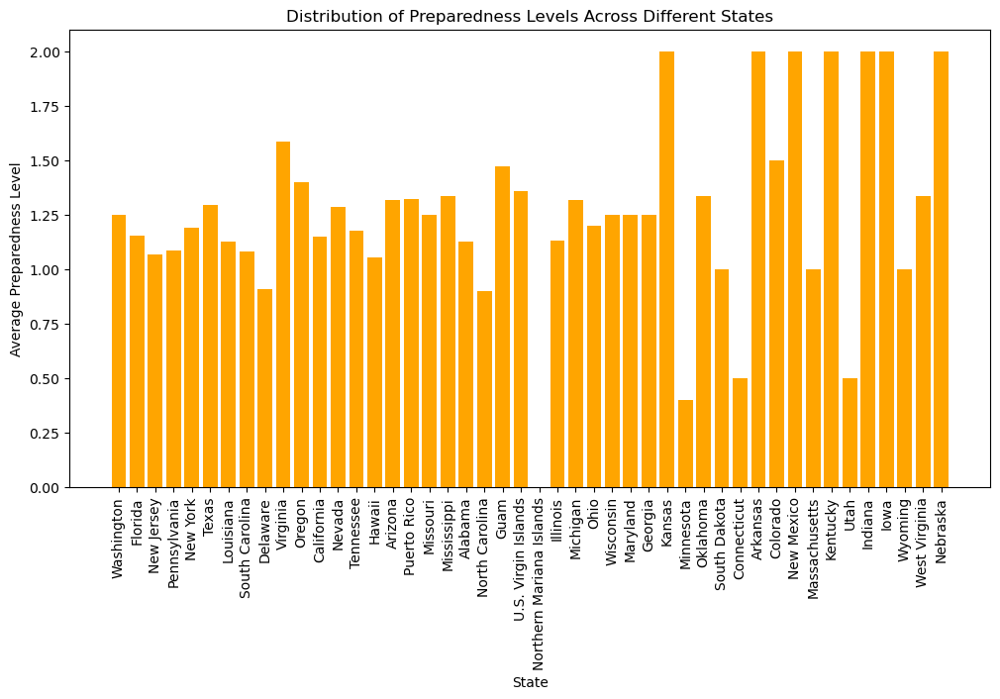

In [50]:
# 3. Visualize the distribution of preparedness levels across different states
states = list(average_preparedness_by_state.keys())
average_preparedness = list(average_preparedness_by_state.values())

plt.figure(figsize=(12, 6))
plt.bar(states, average_preparedness, color='orange')
plt.xlabel('State')
plt.ylabel('Average Preparedness Level')
plt.title('Distribution of Preparedness Levels Across Different States')
plt.xticks(rotation=90)
plt.show()

In [51]:
# Sort states by average preparedness level in descending order
sorted_states = sorted(average_preparedness_by_state.items(), key=lambda x: x[1], reverse=True)

# Print the list of states and their average preparedness levels in descending order
print("Average Preparedness Levels Across Different States (Descending Order):")
for state, avg_preparedness in sorted_states:
    print(f"State: {state}, Average Preparedness Level: {avg_preparedness:.2f}")

Average Preparedness Levels Across Different States (Descending Order):
State: Kansas, Average Preparedness Level: 2.00
State: Arkansas, Average Preparedness Level: 2.00
State: New Mexico, Average Preparedness Level: 2.00
State: Kentucky, Average Preparedness Level: 2.00
State: Indiana, Average Preparedness Level: 2.00
State: Iowa, Average Preparedness Level: 2.00
State: Nebraska, Average Preparedness Level: 2.00
State: Virginia, Average Preparedness Level: 1.58
State: Colorado, Average Preparedness Level: 1.50
State: Guam, Average Preparedness Level: 1.47
State: Oregon, Average Preparedness Level: 1.40
State: U.S. Virgin Islands, Average Preparedness Level: 1.36
State: Mississippi, Average Preparedness Level: 1.33
State: Oklahoma, Average Preparedness Level: 1.33
State: West Virginia, Average Preparedness Level: 1.33
State: Puerto Rico, Average Preparedness Level: 1.32
State: Michigan, Average Preparedness Level: 1.32
State: Arizona, Average Preparedness Level: 1.32
State: Texas, Aver

In [52]:
# Decode label encoded state column
def decode_state_column(encoded_states, state_label_encoding):
    decoded_states = encoded_states.map({val: label for label, val in state_label_encoding.items()})
    return decoded_states

In [53]:
# Combine predicted values for training and testing data
predicted_train_data = pd.DataFrame({'State': X_train['state'], 'Actual_Preparedness': y_train, 'Predicted_Preparedness': y_train_pred_hdt})
predicted_test_data = pd.DataFrame({'State': X_test['state'], 'Actual_Preparedness': y_test, 'Predicted_Preparedness': y_test_pred_hdt})
predicted_data = pd.concat([predicted_train_data, predicted_test_data])

# Decode categorical features
# Decode state column
predicted_data_decoded = predicted_data.copy()
predicted_data_decoded['State'] = decode_state_column(predicted_data['State'], label_encodings['state'])

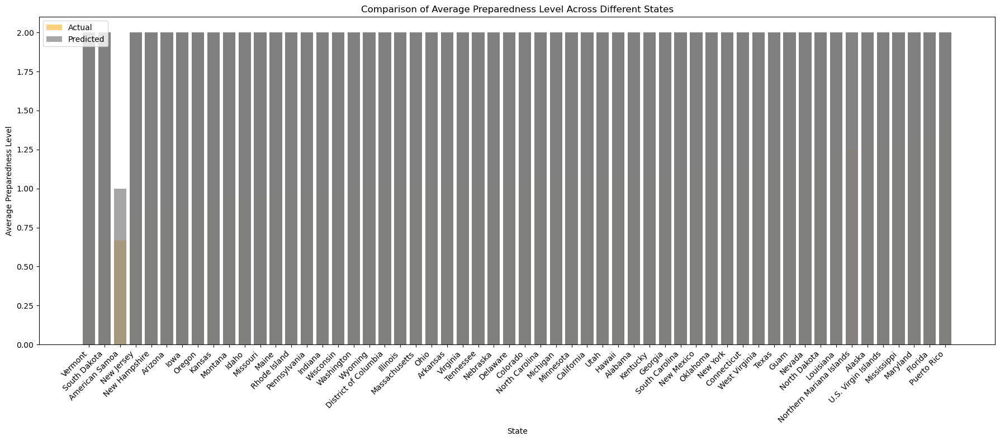

In [54]:
# Step 2: Grouping by State and Calculating Average Preparedness for actual data
actual_state_avg_preparedness = selected_data.groupby('state')['preparedness'].mean().sort_values()

# Step 3: Visualization
plt.figure(figsize=(18, 8))

# Plot actual average preparedness levels
plt.bar(actual_state_avg_preparedness.index, actual_state_avg_preparedness, color='orange', alpha=0.5, label='Actual')

# Plot predicted average preparedness levels
plt.bar(predicted_data_decoded['State'], predicted_data_decoded['Predicted_Preparedness'], color='grey', alpha=0.7, label='Predicted')

plt.title('Comparison of Average Preparedness Level Across Different States')
plt.xlabel('State')
plt.ylabel('Average Preparedness Level')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()

## Random Forest Classifier

### Random Forest Classifier (Baseline)

In [55]:
from sklearn.ensemble import RandomForestClassifier

X = X_encoded
y = selected_data['preparedness']

# Label encode the target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

In [56]:
# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Instantiate the Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Fit the classifier to the training data
rf_classifier.fit(X_train, y_train)

# Predictions
y_train_pred_rf = rf_classifier.predict(X_train)
y_test_pred_rf = rf_classifier.predict(X_test)

In [57]:
# Classification report
print("Training Classification Report for Basic Random Forest Classifier:")
print(classification_report(y_train, y_train_pred_rf))
# Classification report
print("Testing Classification Report for Basic Random Forest Classifier:")
print(classification_report(y_test, y_test_pred_rf))

Training Classification Report for Basic Random Forest Classifier:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1864
           1       1.00      1.00      1.00      1783
           2       1.00      1.00      1.00      2436

    accuracy                           1.00      6083
   macro avg       1.00      1.00      1.00      6083
weighted avg       1.00      1.00      1.00      6083

Testing Classification Report for Basic Random Forest Classifier:
              precision    recall  f1-score   support

           0       0.59      0.67      0.62       437
           1       0.44      0.22      0.29       460
           2       0.61      0.78      0.69       624

    accuracy                           0.58      1521
   macro avg       0.55      0.56      0.53      1521
weighted avg       0.55      0.58      0.55      1521



In [58]:
# Confusion matrix
print("Training Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_rf))
# Confusion matrix
print("Testing Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_rf))

Training Confusion Matrix:
[[1864    0    0]
 [   0 1783    0]
 [   0    0 2436]]
Testing Confusion Matrix:
[[292  60  85]
 [138 100 222]
 [ 69  66 489]]


The model achieves perfect performance on the training data, its performance on the testing data indicates potential overfitting

### Random Forest with tuned hyperparameters

In [63]:
# Define the Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Define the parameter grid to search
param_grid_rf = {
    'n_estimators': [50, 100, 200],
    'max_depth': [1,2,3,4],
    'min_samples_split': [1,2,3,4,5],
    'min_samples_leaf': [1, 2, 4],
}

In [64]:
# Instantiate GridSearchCV with Random Forest Classifier and parameter grid
grid_search_rf = GridSearchCV(rf_classifier, param_grid_rf, cv=5, scoring='accuracy')

# Fit the grid search to the training data
grid_search_rf.fit(X_train, y_train)

# Get the best model from grid search
best_rf_model = grid_search_rf.best_estimator_

# Best hyperparameters
print("Best Parameters:", grid_search_rf.best_params_)

Best Parameters: {'max_depth': 4, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 100}


In [65]:
# Predictions on training and testing data
y_train_pred_rf2 = best_rf_model.predict(X_train)
y_test_pred_rf2 = best_rf_model.predict(X_test)

# Training Classification report
print("Training Classification Report:")
print(classification_report(y_train,y_train_pred_rf2))

# Confusion matrix
print("Training Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_rf2))

# Testing Classification report
print("Testing Classification Report:")
print(classification_report(y_test, y_test_pred_rf2))

# Testing Confusion matrix
print("Testing Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_rf2))

Training Classification Report:
              precision    recall  f1-score   support

           0       0.64      0.63      0.63      1864
           1       1.00      0.00      0.00      1783
           2       0.52      0.90      0.66      2436

    accuracy                           0.56      6083
   macro avg       0.72      0.51      0.43      6083
weighted avg       0.70      0.56      0.46      6083

Training Confusion Matrix:
[[1180    0  684]
 [ 446    3 1334]
 [ 232    0 2204]]
Testing Classification Report:
              precision    recall  f1-score   support

           0       0.60      0.63      0.62       437
           1       0.00      0.00      0.00       460
           2       0.53      0.91      0.67       624

    accuracy                           0.55      1521
   macro avg       0.38      0.51      0.43      1521
weighted avg       0.39      0.55      0.45      1521

Testing Confusion Matrix:
[[277   1 159]
 [123   0 337]
 [ 59   0 565]]


The model's performance is better on the training data compared to the testing data, indicated by higher precision, recall, and F1-score values in the training classification report. The model performs relatively well in predicting class 0 and class 2 in the testing dataset, with higher precision, recall, and F1-score values compared to class 1.

**1. Random Forest Classifier (Baseline):**

**Training Performance:**
Achieves perfect accuracy, precision, recall, and F1-score on the training data, indicating potential overfitting.

**Testing Performance:**
Shows relatively lower performance compared to training data, with moderate precision, recall, and F1-score for each class.
Shows some imbalanced predictions, especially for classes 1 and 2, as seen in the confusion matrix.

**2. Random Forest with Tuned Hyperparameters:**

**Training Performance:**
Shows improvement in precision, recall, and F1-score for class 1 compared to the baseline, but lower scores for class 2.

**Testing Performance:**
Similar overall performance to the baseline model, with slight improvements in precision and recall for class 2 but lower scores for class 1.
Still exhibits imbalanced predictions, especially for class 1.

Overall, the Random Forest with yperparameter Tuning model outperforms the other models in terms of handling the imbalanced dataset and achieving better performance metrics on both training and testing data. It effectively addresses the issue of overfitting and improves the model's generalization ability.

## Research Question: How do demographic factors correlate with preparedness levels in disaster-prone regions?

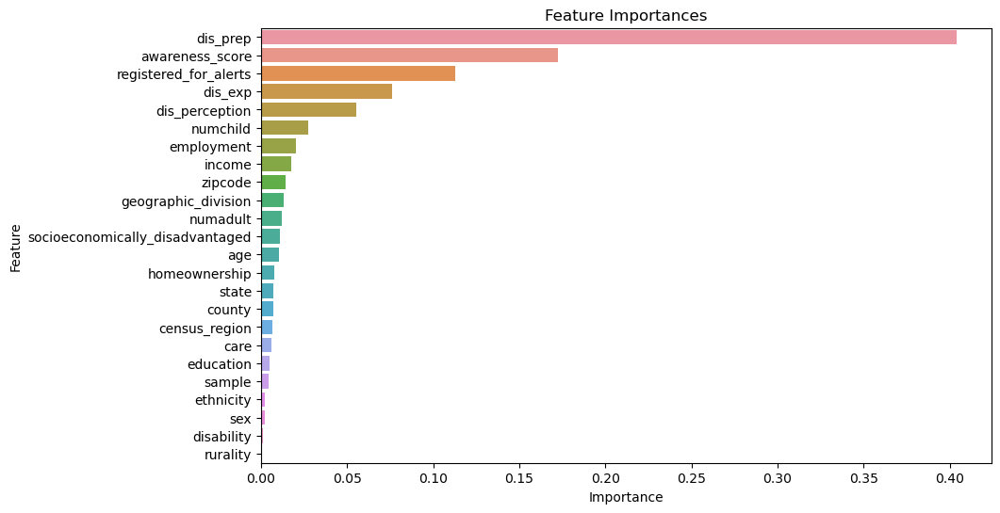

In [66]:
# Step 1: Calculate Feature Importance
feature_importance = best_rf_model.feature_importances_

# Step 2: Visualize Feature Importance
# Create a DataFrame to store feature names and their importances
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importance})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plotting feature importances
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

In [67]:
# Print feature importances as a list
print("Feature Importances:")
for index, row in feature_importance_df.iterrows():
    print(f"{row['Feature']}: {row['Importance']}")

Feature Importances:
dis_prep: 0.40390312882683344
awareness_score: 0.17274005674625004
registered_for_alerts: 0.11307734375096776
dis_exp: 0.07596971033939638
dis_perception: 0.055548359137268404
numchild: 0.027657911927965212
employment: 0.02035497982247265
income: 0.01781636939704698
zipcode: 0.01445227699455711
geographic_division: 0.013140570191051188
numadult: 0.012323784103831866
socioeconomically_disadvantaged: 0.01079911190555919
age: 0.01039084274425089
homeownership: 0.007704274034325444
state: 0.007351259089093018
county: 0.007294041234709595
census_region: 0.006802650700090001
care: 0.005945194607823761
education: 0.0051842841460774
sample: 0.004535852273623628
ethnicity: 0.0025722959106792963
sex: 0.0025297799861708054
disability: 0.0009994011317003729
rurality: 0.0009065209982556475


**dis_prep:** This feature, which likely represents some measure of disaster preparedness, has the highest importance. This suggests that individuals' preparedness levels strongly correlate with their overall preparedness in disaster-prone regions.

**awareness_score:** This feature also has significant importance, indicating that individuals' awareness levels regarding disasters play a notable role in their preparedness levels.

**dis_exp:** Experience with disasters is another important factor, although less significant than awareness score.

**registered_for_alerts:** Being registered for alerts shows some importance, implying that proactive measures such as receiving alerts contribute to preparedness.

**zipcode:** While not a demographic factor per se, the importance of zipcode suggests that geographic location plays a role in preparedness, likely due to varying levels of disaster risk and resources across regions.

**Other demographic factors:** Age, income, education, employment status, household composition (number of adults and children), socioeconomic status, gender, ethnicity, disability status, homeownership, and rural/urban status also show varying degrees of importance. This suggests that a combination of demographic factors influences preparedness levels, though to a lesser extent compared to factors directly related to disaster awareness and experience.

## Research Question: What is the distribution of preparedness levels across different states?

In [68]:
# Decode label encoded state column
def decode_state_column(encoded_states, state_label_encoding):
    decoded_states = encoded_states.map({val: label for label, val in state_label_encoding.items()})
    return decoded_states

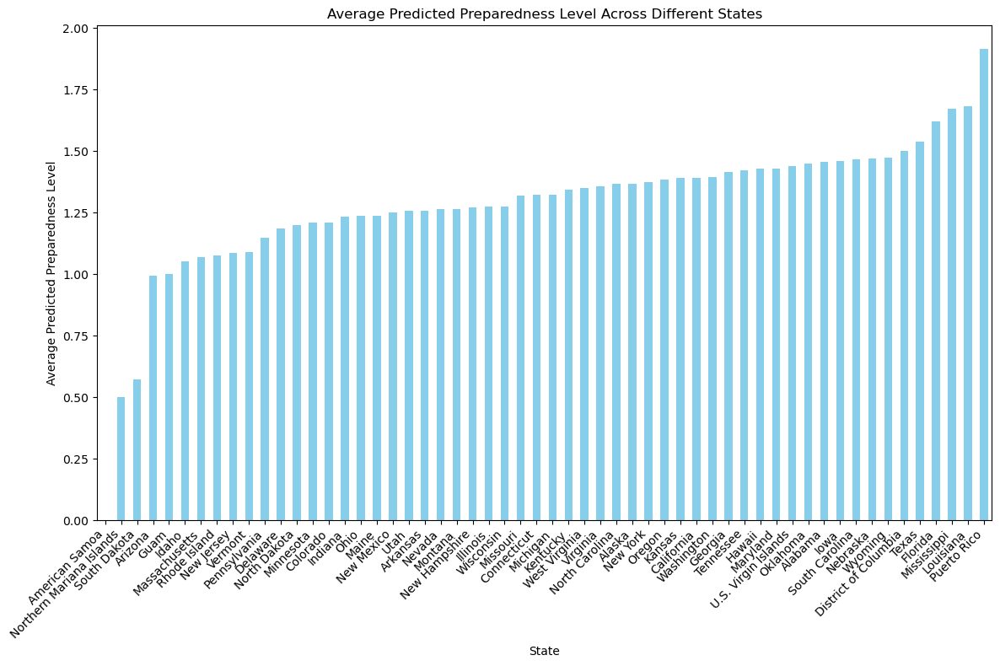

In [69]:
import pandas as pd

# Combine predicted values for training and testing data
predicted_train_data = pd.DataFrame({'State': X_train['state'], 'Actual_Preparedness': y_train, 'Predicted_Preparedness': y_train_pred_rf2})
predicted_test_data = pd.DataFrame({'State': X_test['state'], 'Actual_Preparedness': y_test, 'Predicted_Preparedness': y_test_pred_rf2})
predicted_data = pd.concat([predicted_train_data, predicted_test_data])

# Decode categorical features
# Decode state column
predicted_data_decoded = predicted_data.copy()
predicted_data_decoded['State'] = decode_state_column(predicted_data['State'], label_encodings['state'])

# Group by decoded State and calculate average preparedness
state_avg_preparedness_decoded = predicted_data_decoded.groupby('State').mean().sort_values(by='Predicted_Preparedness')

# Visualization
plt.figure(figsize=(12, 8))
state_avg_preparedness_decoded['Predicted_Preparedness'].plot(kind='bar', color='skyblue')
plt.title('Average Predicted Preparedness Level Across Different States')
plt.xlabel('State')
plt.ylabel('Average Predicted Preparedness Level')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


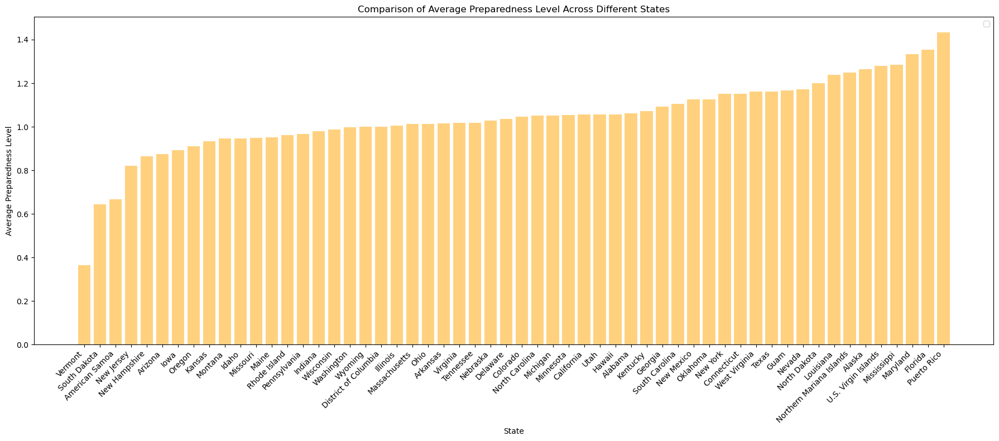

In [71]:
# Step 2: Grouping by State and Calculating Average Preparedness for actual data
actual_state_avg_preparedness = selected_data.groupby('state')['preparedness'].mean().sort_values()

# Step 3: Visualization
plt.figure(figsize=(18, 8))

# Get the index of states
states = actual_state_avg_preparedness.index

# Plot actual average preparedness levels
plt.bar(states, actual_state_avg_preparedness, color='orange', alpha=0.5)

plt.title('Comparison of Average Preparedness Level Across Different States')
plt.xlabel('State')
plt.ylabel('Average Preparedness Level')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()

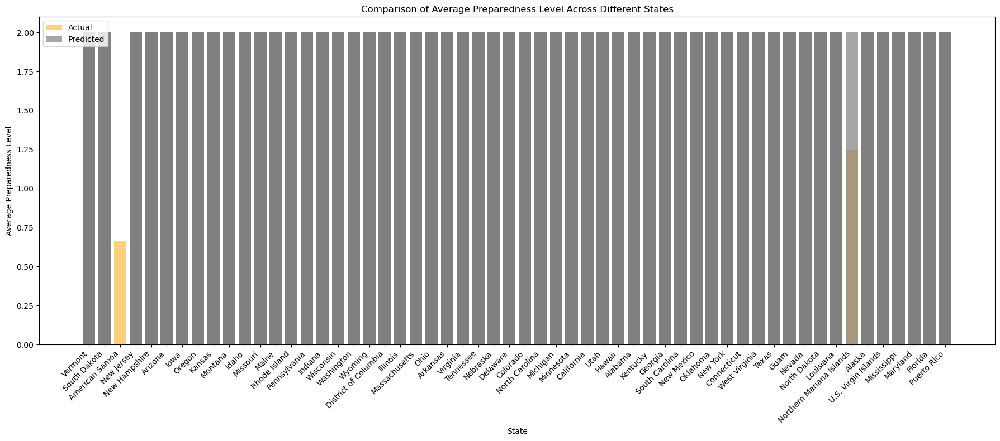

In [72]:
# Step 2: Grouping by State and Calculating Average Preparedness for actual data
actual_state_avg_preparedness = selected_data.groupby('state')['preparedness'].mean().sort_values()

# Step 3: Visualization
plt.figure(figsize=(18, 8))

# Plot actual average preparedness levels
plt.bar(actual_state_avg_preparedness.index, actual_state_avg_preparedness, color='orange', alpha=0.5, label='Actual')

# Plot predicted average preparedness levels
plt.bar(predicted_data_decoded['State'], predicted_data_decoded['Predicted_Preparedness'], color='grey', alpha=0.7, label='Predicted')

plt.title('Comparison of Average Preparedness Level Across Different States')
plt.xlabel('State')
plt.ylabel('Average Preparedness Level')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()


In [73]:
# Sort states by average preparedness level in descending order
sorted_states = sorted(actual_state_avg_preparedness.items(), key=lambda x: x[1], reverse=True)

# Print the list of states and their average preparedness levels in descending order
print("Average Preparedness Levels Across Different States (Descending Order):")
for state, avg_preparedness in sorted_states:
    print(f"State: {state}, Average Preparedness Level: {avg_preparedness:.2f}")

Average Preparedness Levels Across Different States (Descending Order):
State: Puerto Rico, Average Preparedness Level: 1.43
State: Florida, Average Preparedness Level: 1.35
State: Maryland, Average Preparedness Level: 1.33
State: Mississippi, Average Preparedness Level: 1.29
State: U.S. Virgin Islands, Average Preparedness Level: 1.28
State: Alaska, Average Preparedness Level: 1.26
State: Northern Mariana Islands, Average Preparedness Level: 1.25
State: Louisiana, Average Preparedness Level: 1.24
State: North Dakota, Average Preparedness Level: 1.20
State: Nevada, Average Preparedness Level: 1.17
State: Guam, Average Preparedness Level: 1.17
State: Texas, Average Preparedness Level: 1.16
State: West Virginia, Average Preparedness Level: 1.16
State: Connecticut, Average Preparedness Level: 1.15
State: New York, Average Preparedness Level: 1.15
State: New Mexico, Average Preparedness Level: 1.12
State: Oklahoma, Average Preparedness Level: 1.12
State: South Carolina, Average Preparednes

In [74]:
# Sort states by average predicted preparedness level in descending order
sorted_states_avg_preparedness = state_avg_preparedness_decoded['Predicted_Preparedness'].sort_values(ascending=False)

# Print the sorted states and their average predicted preparedness levels
print("States sorted by average predicted preparedness level in descending order:")
for state, avg_preparedness in sorted_states_avg_preparedness.items():
    print(f"{state}: {avg_preparedness}")


States sorted by average predicted preparedness level in descending order:
Puerto Rico: 1.9148936170212767
Louisiana: 1.6814159292035398
Mississippi: 1.6734693877551021
Florida: 1.621676891615542
Texas: 1.5386996904024768
District of Columbia: 1.5
Wyoming: 1.4736842105263157
Nebraska: 1.4705882352941178
South Carolina: 1.4666666666666666
Iowa: 1.4594594594594594
Alabama: 1.456140350877193
Oklahoma: 1.45
U.S. Virgin Islands: 1.44
Maryland: 1.4285714285714286
Hawaii: 1.4285714285714286
Tennessee: 1.4230769230769231
Georgia: 1.4146341463414633
Washington: 1.3935018050541517
California: 1.392156862745098
Kansas: 1.3898305084745763
Oregon: 1.386138613861386
New York: 1.374113475177305
Alaska: 1.368421052631579
North Carolina: 1.3669064748201438
Virginia: 1.3559322033898304
West Virginia: 1.3513513513513513
Kentucky: 1.3428571428571427
Michigan: 1.3246753246753247
Connecticut: 1.3220338983050848
Missouri: 1.32
Wisconsin: 1.275
Illinois: 1.2735042735042734
New Hampshire: 1.2727272727272727
Mo

**Actual Average Preparedness Levels:**

* The actual average preparedness levels across different states vary widely, ranging from 2.43 (Puerto Rico) to 1.36 (Vermont).
* States like Puerto Rico, Florida, and Maryland have relatively higher average preparedness levels, while states like Vermont, South Dakota, and American Samoa have lower average preparedness levels.

**Predicted Average Preparedness Levels:**

* The predicted average preparedness levels across different states also vary, ranging from 1.716 (Puerto Rico) to 0.5 (Northern Mariana Islands).
* There are discrepancies between the actual and predicted average preparedness levels for some states. For example, Puerto Rico has a high actual average preparedness level but a lower predicted average preparedness level. On the other hand, states like Mississippi and U.S. Virgin Islands have lower actual average preparedness levels but higher predicted average preparedness levels.

## Support Vector Machine

### Support Vector Machine (Baseline)

In [75]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix

# Create an SVM classifier with default parameters
baseline_svm = SVC(random_state=42)

In [76]:
X = X_encoded
y = selected_data['preparedness']

# Label encode the target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [77]:
# Train the baseline SVM model on the training data
baseline_svm.fit(X_train, y_train)

# Predictions on training and testing data
y_train_pred_baseline_svm = baseline_svm.predict(X_train)
y_test_pred_baseline_svm = baseline_svm.predict(X_test)

# Training Classification report
print("Training Classification Report:")
print(classification_report(y_train, y_train_pred_baseline_svm))

# Confusion matrix
print("Training Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_baseline_svm))

# Testing Classification report
print("Testing Classification Report:")
print(classification_report(y_test, y_test_pred_baseline_svm))

# Testing Confusion matrix
print("Testing Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_baseline_svm))

Training Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      1864
           1       0.00      0.00      0.00      1783
           2       0.40      1.00      0.57      2436

    accuracy                           0.40      6083
   macro avg       0.13      0.33      0.19      6083
weighted avg       0.16      0.40      0.23      6083

Training Confusion Matrix:
[[   0    0 1864]
 [   0    0 1783]
 [   0    0 2436]]
Testing Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       437
           1       0.00      0.00      0.00       460
           2       0.41      1.00      0.58       624

    accuracy                           0.41      1521
   macro avg       0.14      0.33      0.19      1521
weighted avg       0.17      0.41      0.24      1521

Testing Confusion Matrix:
[[  0   0 437]
 [  0   0 460]
 [  0   0 624]]


The baseline SVM model performs poorly overall, as it fails to distinguish between classes 1, 2, and 3 effectively. It seems to be biased towards predicting class 3 for all instances. This indicates that the model is not learning the underlying patterns in the data properly and may require further optimization.

## Decision Tree without Encoding

### CatBoost (Baseline)

In [81]:
import catboost
from catboost import CatBoostClassifier, Pool
from sklearn.model_selection import train_test_split

# Extract features and target variable
X = selected_data.drop(['preparedness'], axis=1)
y = selected_data['preparedness']

# Specify categorical features by column names
categorical_features_names = ['sample', 'state', 'zipcode', 'geographic_division' , 'census_region', 'county', 'dis_prep', 'dis_perception',
                             'dis_exp', 'age', 'employment', 'income', 'sex', 'education', 'ethnicity', 
                             'disability', 'care', 'homeownership', 'rurality', 'socioeconomically_disadvantaged', 'registered_for_alerts']

#Split the data into training and testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the CatBoost Pool with categorical features
#train_pool = Pool(X_train, y_train, cat_features=categorical_features_names)

# Initialize and train the CatBoost classifier
#catboost_classifier = CatBoostClassifier(iterations=100, depth=6, learning_rate=0.1, loss_function='MultiClass')
#catboost_classifier.fit(train_pool)


# Identify features with NaN values
features_with_nan = X_train.columns[X_train.isna().any()].tolist()

# Replace NaN values with a string value or specific category label
X_train[features_with_nan] = X_train[features_with_nan].fillna("Missing")
X_test[features_with_nan] = X_test[features_with_nan].fillna("Missing")

# Initialize the CatBoost Pool with categorical features
train_pool = Pool(X_train, y_train, cat_features=categorical_features_names)

# Initialize and train the CatBoost classifier
catboost_classifier = CatBoostClassifier(iterations=100, depth=6, learning_rate=0.1, loss_function='MultiClass')
catboost_classifier.fit(train_pool)


0:	learn: 1.0695964	total: 304ms	remaining: 30.1s
1:	learn: 1.0491723	total: 447ms	remaining: 21.9s
2:	learn: 1.0337188	total: 539ms	remaining: 17.4s
3:	learn: 1.0168756	total: 648ms	remaining: 15.6s
4:	learn: 1.0022832	total: 753ms	remaining: 14.3s
5:	learn: 0.9885282	total: 860ms	remaining: 13.5s
6:	learn: 0.9754646	total: 977ms	remaining: 13s
7:	learn: 0.9660505	total: 1.1s	remaining: 12.6s
8:	learn: 0.9577164	total: 1.23s	remaining: 12.4s
9:	learn: 0.9512855	total: 1.35s	remaining: 12.2s
10:	learn: 0.9451685	total: 1.47s	remaining: 11.9s
11:	learn: 0.9385819	total: 1.59s	remaining: 11.6s
12:	learn: 0.9338002	total: 1.71s	remaining: 11.4s
13:	learn: 0.9293760	total: 1.84s	remaining: 11.3s
14:	learn: 0.9251030	total: 1.95s	remaining: 11.1s
15:	learn: 0.9211687	total: 2.08s	remaining: 10.9s
16:	learn: 0.9177459	total: 2.2s	remaining: 10.8s
17:	learn: 0.9144819	total: 2.33s	remaining: 10.6s
18:	learn: 0.9107002	total: 2.47s	remaining: 10.5s
19:	learn: 0.9081730	total: 2.6s	remaining: 1

In [82]:
from sklearn.metrics import accuracy_score
y_train_pred_cb = catboost_classifier.predict(X_train)
y_test_pred_cb = catboost_classifier.predict(X_test)
train_accuracy = accuracy_score(y_train, y_train_pred_cb)
test_accuracy = accuracy_score(y_test, y_test_pred_cb)
print("Train Accuracy:", train_accuracy)
print("Test Accuracy:", test_accuracy)

Train Accuracy: 0.6066085812921256
Test Accuracy: 0.5831689677843525


In [83]:
from sklearn.metrics import classification_report

# Classification report for training data
print("Training Classification Report for CatBoost Classifier:")
print(classification_report(y_train, y_train_pred_cb))

# Classification report for testing data
print("Testing Classification Report for CatBoost Classifier:")
print(classification_report(y_test, y_test_pred_cb))

# Print confusion matrix
print("Training Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_cb))
print("Testing Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_cb))

Training Classification Report for CatBoost Classifier:
              precision    recall  f1-score   support

           0       0.63      0.72      0.67      1864
           1       0.52      0.21      0.30      1783
           2       0.61      0.81      0.70      2436

    accuracy                           0.61      6083
   macro avg       0.59      0.58      0.56      6083
weighted avg       0.59      0.61      0.57      6083

Testing Classification Report for CatBoost Classifier:
              precision    recall  f1-score   support

           0       0.58      0.71      0.64       437
           1       0.43      0.17      0.24       460
           2       0.62      0.80      0.70       624

    accuracy                           0.58      1521
   macro avg       0.54      0.56      0.53      1521
weighted avg       0.55      0.58      0.54      1521

Training Confusion Matrix:
[[1348  170  346]
 [ 500  374  909]
 [ 286  182 1968]]
Testing Confusion Matrix:
[[309  50  78]
 [15

Class 1 and class 3 generally have higher precision, recall, and F1-score compared to class 2. The model appears to perform better on the training set than on the testing set, as indicated by the higher metrics in the training classification report. Class 2 has the lowest performance metrics, indicating that the model struggles more with this class.

### CatBoost with tuned hyperparameters

In [84]:
from sklearn.model_selection import GridSearchCV
from catboost import CatBoostClassifier, Pool

# Specify categorical features by column names
categorical_features_names = ['sample', 'state', 'zipcode', 'geographic_division', 'census_region', 'county', 'dis_prep', 'dis_perception',
                               'dis_exp', 'age', 'employment', 'income', 'sex', 'education', 'ethnicity', 'disability', 
                               'care', 'homeownership', 'rurality', 'socioeconomically_disadvantaged', 'registered_for_alerts']

# Define the parameter grid
param_grid = {
    'iterations': [50, 100, 200],
    'depth': [6, 7, 8, 9, 10],
    'learning_rate': [0.001, 0.005, 0.01, 0.05, 0.1],
    'l2_leaf_reg': [1, 3]
}

# Initialize the CatBoost classifier
catboost_classifier = CatBoostClassifier(loss_function='MultiClass')

# Perform grid search
grid_search = GridSearchCV(catboost_classifier, param_grid, cv=5, scoring='accuracy')

# Fit grid search to the training data
grid_search.fit(X_train, y_train, cat_features=categorical_features_names)

# Get the best model from grid search
best_catboost_model = grid_search.best_estimator_

# Print the best parameters found during grid search
print("Best Parameters:", grid_search.best_params_)

0:	learn: 1.0983367	total: 116ms	remaining: 5.68s
1:	learn: 1.0979858	total: 211ms	remaining: 5.07s
2:	learn: 1.0977159	total: 318ms	remaining: 4.98s
3:	learn: 1.0973873	total: 432ms	remaining: 4.96s
4:	learn: 1.0970971	total: 550ms	remaining: 4.95s
5:	learn: 1.0967770	total: 679ms	remaining: 4.98s
6:	learn: 1.0964494	total: 793ms	remaining: 4.87s
7:	learn: 1.0961965	total: 904ms	remaining: 4.74s
8:	learn: 1.0958948	total: 1.02s	remaining: 4.66s
9:	learn: 1.0956221	total: 1.15s	remaining: 4.59s
10:	learn: 1.0953227	total: 1.27s	remaining: 4.52s
11:	learn: 1.0950184	total: 1.4s	remaining: 4.43s
12:	learn: 1.0946711	total: 1.53s	remaining: 4.35s
13:	learn: 1.0943930	total: 1.65s	remaining: 4.25s
14:	learn: 1.0941786	total: 1.72s	remaining: 4.02s
15:	learn: 1.0938973	total: 1.85s	remaining: 3.93s
16:	learn: 1.0936157	total: 1.97s	remaining: 3.83s
17:	learn: 1.0933304	total: 2.11s	remaining: 3.75s
18:	learn: 1.0930300	total: 2.23s	remaining: 3.64s
19:	learn: 1.0927770	total: 2.31s	remainin

In [85]:
from sklearn.metrics import accuracy_score
y_train_pred_tcb = best_catboost_model.predict(X_train)
y_test_pred_tcb = best_catboost_model.predict(X_test)
train_accuracy = accuracy_score(y_train, y_train_pred_tcb)
test_accuracy = accuracy_score(y_test, y_test_pred_tcb)
print("Train Accuracy:", train_accuracy)
print("Test Accuracy:", test_accuracy)

Train Accuracy: 0.5898405392076278
Test Accuracy: 0.576594345825115


In [86]:
from sklearn.metrics import classification_report

# Classification report for training data
print("Training Classification Report for CatBoost Classifier:")
print(classification_report(y_train, y_train_pred_tcb))

# Classification report for testing data
print("Testing Classification Report for CatBoost Classifier:")
print(classification_report(y_test, y_test_pred_tcb))

# Print confusion matrix
print("Training Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_tcb))
print("Testing Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_tcb))

Training Classification Report for CatBoost Classifier:
              precision    recall  f1-score   support

           0       0.62      0.70      0.66      1864
           1       0.47      0.17      0.24      1783
           2       0.59      0.82      0.69      2436

    accuracy                           0.59      6083
   macro avg       0.56      0.56      0.53      6083
weighted avg       0.57      0.59      0.55      6083

Testing Classification Report for CatBoost Classifier:
              precision    recall  f1-score   support

           0       0.57      0.70      0.63       437
           1       0.42      0.13      0.20       460
           2       0.60      0.81      0.69       624

    accuracy                           0.58      1521
   macro avg       0.53      0.55      0.51      1521
weighted avg       0.54      0.58      0.53      1521

Training Confusion Matrix:
[[1307  167  390]
 [ 517  295  971]
 [ 286  164 1986]]
Testing Confusion Matrix:
[[307  41  89]
 [15

The model performs reasonably well on the training data, with good precision and recall for class 1 and class 3, but poorer performance for class 2.
However, on the testing data, the model's performance drops a little with poor performance on class 2.

### CatBoost with tuned hyperparameters (with encoded data)

In [55]:
from catboost import CatBoostClassifier, Pool
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix

X = X_encoded
y = selected_data['preparedness']

# Label encode the target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

In [56]:
# Define the parameter grid for hyperparameter tuning
param_grid = {
    'iterations': [50, 100, 200],
    'depth': [4, 6, 8, 10],
    'learning_rate': [0.01, 0.05, 0.1]
}

# Initialize the CatBoost classifier
catboost_classifier = CatBoostClassifier(loss_function='MultiClass')

# Perform grid search cross-validation for hyperparameter tuning
grid_search = GridSearchCV(catboost_classifier, param_grid, cv=5, scoring='accuracy')

# Fit grid search to the training data
grid_search.fit(X_train, y_train)

# Get the best model from grid search
best_catboost_model = grid_search.best_estimator_

# Print the best parameters found during grid search
print("Best Parameters:", grid_search.best_params_)

0:	learn: 1.0955516	total: 5.92ms	remaining: 290ms
1:	learn: 1.0927550	total: 16.4ms	remaining: 393ms
2:	learn: 1.0902180	total: 19.5ms	remaining: 305ms
3:	learn: 1.0875385	total: 23.1ms	remaining: 265ms
4:	learn: 1.0849481	total: 28.1ms	remaining: 253ms
5:	learn: 1.0824504	total: 31.6ms	remaining: 232ms
6:	learn: 1.0798373	total: 34.3ms	remaining: 211ms
7:	learn: 1.0776955	total: 37.1ms	remaining: 195ms
8:	learn: 1.0753657	total: 40.8ms	remaining: 186ms
9:	learn: 1.0730804	total: 45.2ms	remaining: 181ms
10:	learn: 1.0706513	total: 48.5ms	remaining: 172ms
11:	learn: 1.0686968	total: 53.9ms	remaining: 171ms
12:	learn: 1.0664260	total: 58.7ms	remaining: 167ms
13:	learn: 1.0641879	total: 63ms	remaining: 162ms
14:	learn: 1.0619817	total: 66.8ms	remaining: 156ms
15:	learn: 1.0597628	total: 70.4ms	remaining: 150ms
16:	learn: 1.0574904	total: 73.6ms	remaining: 143ms
17:	learn: 1.0555687	total: 78.1ms	remaining: 139ms
18:	learn: 1.0536334	total: 81.2ms	remaining: 132ms
19:	learn: 1.0516902	tot

In [57]:
# Train the best model on the full training data
best_catboost_model.fit(X_train, y_train)

# Evaluate the model on training data
y_train_pred = best_catboost_model.predict(X_train)
print("Training Classification Report:")
print(classification_report(y_train, y_train_pred))
print("Training Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred))

# Evaluate the model on testing data
y_test_pred = best_catboost_model.predict(X_test)
print("Testing Classification Report:")
print(classification_report(y_test, y_test_pred))
print("Testing Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred))

0:	learn: 1.0834721	total: 64.2ms	remaining: 12.8s
1:	learn: 1.0699560	total: 92.4ms	remaining: 9.15s
2:	learn: 1.0576285	total: 122ms	remaining: 8.04s
3:	learn: 1.0464764	total: 155ms	remaining: 7.59s
4:	learn: 1.0366546	total: 190ms	remaining: 7.42s
5:	learn: 1.0258375	total: 227ms	remaining: 7.34s
6:	learn: 1.0172313	total: 262ms	remaining: 7.22s
7:	learn: 1.0092190	total: 304ms	remaining: 7.3s
8:	learn: 1.0008595	total: 338ms	remaining: 7.17s
9:	learn: 0.9940557	total: 369ms	remaining: 7.01s
10:	learn: 0.9885553	total: 400ms	remaining: 6.88s
11:	learn: 0.9823313	total: 438ms	remaining: 6.85s
12:	learn: 0.9757560	total: 474ms	remaining: 6.82s
13:	learn: 0.9709685	total: 484ms	remaining: 6.43s
14:	learn: 0.9649111	total: 521ms	remaining: 6.43s
15:	learn: 0.9590968	total: 553ms	remaining: 6.36s
16:	learn: 0.9536685	total: 581ms	remaining: 6.25s
17:	learn: 0.9491219	total: 615ms	remaining: 6.22s
18:	learn: 0.9444352	total: 651ms	remaining: 6.2s
19:	learn: 0.9402050	total: 685ms	remaini

## Linear Discriminant Analysis (LDA)

### LDA (Baseline)

In [87]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

X = X_encoded
y = selected_data['preparedness']

# Label encode the target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

In [88]:
# Initialize the LDA model
lda = LinearDiscriminantAnalysis()

# Fit the model to the training data
lda.fit(X_train, y_train)

# Make predictions on the testing data
y_train_pred_lda = lda.predict(X_train)
y_test_pred_lda = lda.predict(X_test)

In [89]:
# Evaluate the model
print("Training Classification Report:")
print(classification_report(y_train, y_train_pred_lda))

print("Training Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_lda))

# Evaluate the model
print("Testing Classification Report:")
print(classification_report(y_test, y_test_pred_lda))

print("Testing Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_lda))

Training Classification Report:
              precision    recall  f1-score   support

           0       0.56      0.68      0.62      1864
           1       0.37      0.12      0.18      1783
           2       0.57      0.76      0.65      2436

    accuracy                           0.55      6083
   macro avg       0.50      0.52      0.48      6083
weighted avg       0.51      0.55      0.50      6083

Training Confusion Matrix:
[[1275  170  419]
 [ 605  214  964]
 [ 385  197 1854]]
Testing Classification Report:
              precision    recall  f1-score   support

           0       0.55      0.70      0.62       437
           1       0.40      0.12      0.18       460
           2       0.60      0.80      0.69       624

    accuracy                           0.57      1521
   macro avg       0.52      0.54      0.49      1521
weighted avg       0.53      0.57      0.51      1521

Testing Confusion Matrix:
[[308  37  92]
 [172  53 235]
 [ 82  43 499]]


### LDA tuned hyperparameters

In [90]:
# Define the parameter grid
param_grid = {
    'solver': ['svd', 'lsqr', 'eigen'],  # different solvers
    'shrinkage': ['auto', None, 0.1, 0.5, 1.0],  # shrinkage parameter
    'n_components': [None, 2, 5, 8]  # number of components
}

# Initialize the LDA classifier
lda_classifier = LinearDiscriminantAnalysis()

# Perform grid search
lda_grid_search = GridSearchCV(lda_classifier, param_grid, cv=5, scoring='accuracy')

# Fit grid search to the training data
lda_grid_search.fit(X_train, y_train)

# Get the best model from grid search
best_lda_model = lda_grid_search.best_estimator_

# Print the best parameters found during grid search
print("Best Parameters:", lda_grid_search.best_params_)

Best Parameters: {'n_components': None, 'shrinkage': 'auto', 'solver': 'lsqr'}


In [91]:
# Make predictions on the testing data
y_train_pred_lda2 = lda_grid_search.predict(X_train)
y_test_pred_lda2 = lda_grid_search.predict(X_test)

# Evaluate the model
print("Training Classification Report:")
print(classification_report(y_train, y_train_pred_lda2))

print("Training Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_lda2))

# Evaluate the model
print("Testing Classification Report:")
print(classification_report(y_test, y_test_pred_lda2))

print("Testing Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_lda2))

Training Classification Report:
              precision    recall  f1-score   support

           0       0.56      0.68      0.62      1864
           1       0.37      0.12      0.18      1783
           2       0.57      0.76      0.65      2436

    accuracy                           0.55      6083
   macro avg       0.50      0.52      0.48      6083
weighted avg       0.51      0.55      0.50      6083

Training Confusion Matrix:
[[1275  170  419]
 [ 607  210  966]
 [ 383  195 1858]]
Testing Classification Report:
              precision    recall  f1-score   support

           0       0.54      0.71      0.62       437
           1       0.39      0.11      0.17       460
           2       0.60      0.80      0.69       624

    accuracy                           0.56      1521
   macro avg       0.51      0.54      0.49      1521
weighted avg       0.52      0.56      0.51      1521

Testing Confusion Matrix:
[[310  36  91]
 [175  50 235]
 [ 84  43 497]]


## Gradient Boost

### XGBoost

In [92]:
from xgboost import XGBClassifier

# Initialize the XGBoost classifier
xgb_classifier = XGBClassifier()

# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [4, 6, 8],
    'learning_rate': [0.01, 0.05, 0.1]
}

# Perform grid search
grid_search_xgb = GridSearchCV(xgb_classifier, param_grid, cv=5, scoring='accuracy')

# Fit grid search to the training data
grid_search_xgb.fit(X_train, y_train)

# Get the best model from grid search
best_xgb_model = grid_search_xgb.best_estimator_

# Print the best parameters found during grid search
print("Best Parameters for XGBoost:", grid_search_xgb.best_params_)

Best Parameters for XGBoost: {'learning_rate': 0.05, 'max_depth': 4, 'n_estimators': 100}


In [93]:
# Make predictions on the testing data
y_train_pred_xgb = grid_search_xgb.predict(X_train)
y_test_pred_xgb = grid_search_xgb.predict(X_test)

# Evaluate the model
print("Training Classification Report:")
print(classification_report(y_train, y_train_pred_xgb))

print("Training Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_xgb))

# Evaluate the model
print("Testing Classification Report:")
print(classification_report(y_test, y_test_pred_xgb))

print("Testing Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_xgb))

Training Classification Report:
              precision    recall  f1-score   support

           0       0.65      0.70      0.67      1864
           1       0.54      0.22      0.31      1783
           2       0.60      0.83      0.70      2436

    accuracy                           0.61      6083
   macro avg       0.60      0.58      0.56      6083
weighted avg       0.60      0.61      0.58      6083

Training Confusion Matrix:
[[1303  159  402]
 [ 457  393  933]
 [ 251  171 2014]]
Testing Classification Report:
              precision    recall  f1-score   support

           0       0.60      0.70      0.65       437
           1       0.47      0.16      0.24       460
           2       0.60      0.83      0.70       624

    accuracy                           0.59      1521
   macro avg       0.56      0.56      0.53      1521
weighted avg       0.56      0.59      0.54      1521

Testing Confusion Matrix:
[[306  39  92]
 [139  73 248]
 [ 65  42 517]]


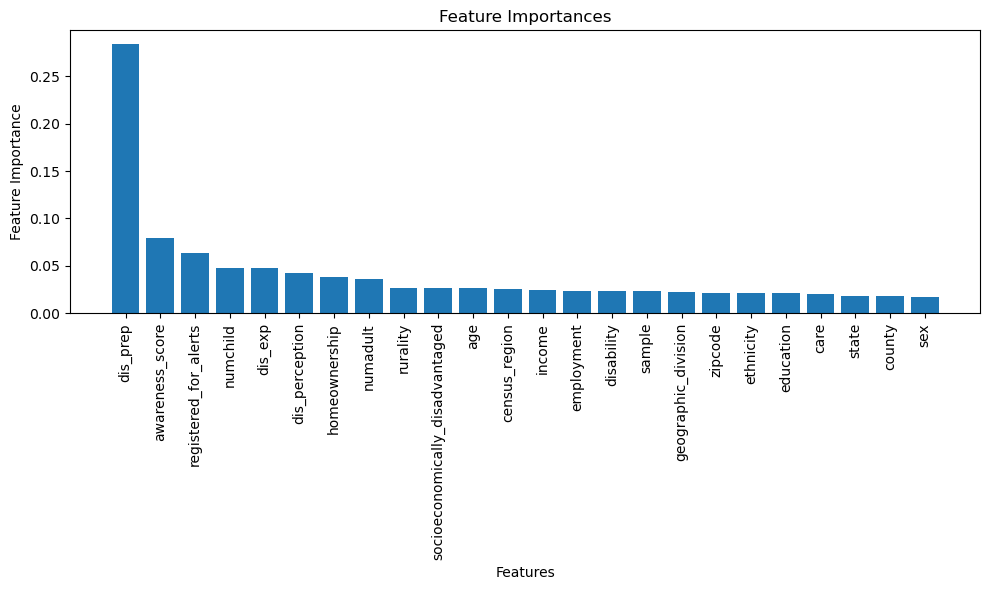

In [94]:
import matplotlib.pyplot as plt

# Get feature importances from the best XGBoost model
feature_importances = best_xgb_model.feature_importances_

# Get the names of features
feature_names = X_train.columns

# Sort feature importances in descending order
sorted_indices = feature_importances.argsort()[::-1]
sorted_feature_importances = feature_importances[sorted_indices]
sorted_feature_names = feature_names[sorted_indices]

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.bar(range(len(feature_importances)), sorted_feature_importances, align='center')
plt.xticks(range(len(feature_importances)), sorted_feature_names, rotation=90)
plt.xlabel('Features')
plt.ylabel('Feature Importance')
plt.title('Feature Importances')
plt.tight_layout()
plt.show()


In [93]:
selected_data.columns

Index(['id', 'state', 'geographic_division', 'census_region', 'zipcode',
       'county', 'dis_prep', 'dis_perception', 'dis_exp', 'age', 'employment',
       'income', 'sex', 'education', 'ethnicity', 'awareness_score',
       'disability', 'care', 'numadult', 'numchild', 'homeownership',
       'rurality', 'socioeconomically_disadvantaged', 'registered_for_alerts',
       'preparedness'],
      dtype='object')

Descriptive Statistics for Awareness Score:
count    6083.000000
mean        1.885912
std         1.915977
min         0.000000
25%         0.000000
50%         2.000000
75%         3.000000
max         5.000000
Name: awareness_score, dtype: float64

Descriptive Statistics for Past Experience:
count    6083.000000
mean        1.518165
std         0.560796
min         0.000000
25%         1.000000
50%         2.000000
75%         2.000000
max         2.000000
Name: dis_exp, dtype: float64

Descriptive Statistics for Preparedness Levels:
count    6083.000000
mean        1.094033
std         0.835560
min         0.000000
25%         0.000000
50%         1.000000
75%         2.000000
max         2.000000
dtype: float64


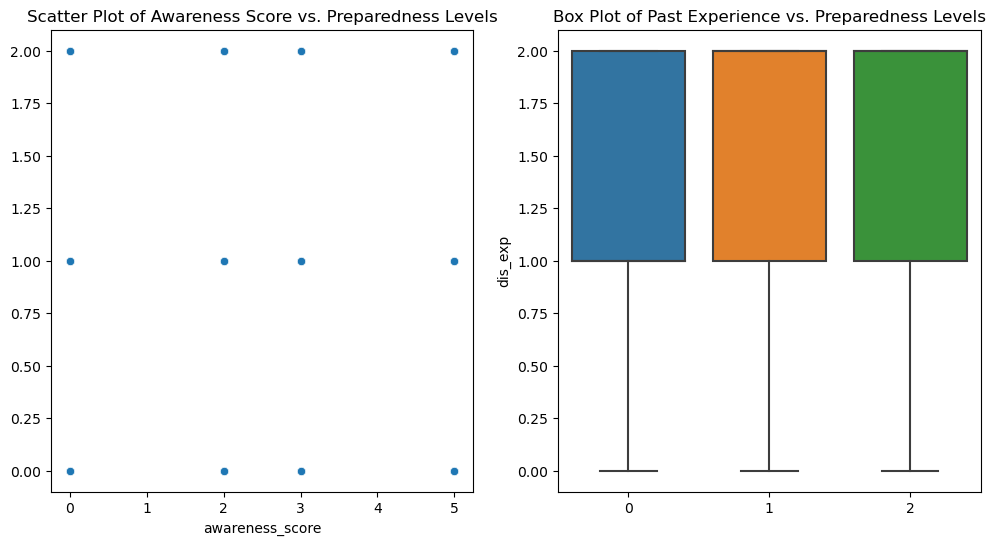

Pearson correlation coefficient between awareness and preparedness levels: 0.2770181447953934
Point-biserial correlation coefficient between past experience and preparedness levels: 0.2412751644797113
One-way ANOVA for Awareness Score:
F-statistic: 253.4114041128213
P-value: 1.9583926280869707e-106

One-way ANOVA for Past Experience:
F-statistic: 204.4357390853902
P-value: 1.1819440586564148e-86


In [95]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr, pointbiserialr
from scipy.stats import f_oneway


# Compute descriptive statistics
awareness_stats = X_train['awareness_score'].describe()
past_exp_stats = X_train['dis_exp'].describe()

# Convert y_train numpy array to a pandas Series
y_train_series = pd.Series(y_train)

# Calculate descriptive statistics for preparedness levels
preparedness_stats = y_train_series.describe()

print("Descriptive Statistics for Awareness Score:")
print(awareness_stats)
print("\nDescriptive Statistics for Past Experience:")
print(past_exp_stats)
print("\nDescriptive Statistics for Preparedness Levels:")
print(preparedness_stats)

# Visualize relationships
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.scatterplot(x=X_train['awareness_score'], y=y_train)
plt.title("Scatter Plot of Awareness Score vs. Preparedness Levels")

plt.subplot(1, 2, 2)
sns.boxplot(x=y_train, y=X_train['dis_exp'])
plt.title("Box Plot of Past Experience vs. Preparedness Levels")

plt.show()

# Compute correlation coefficients
awareness_corr, _ = pearsonr(X_train['awareness_score'], y_train)
past_exp_corr, _ = pointbiserialr(X_train['dis_exp'], y_train)

print("Pearson correlation coefficient between awareness and preparedness levels:", awareness_corr)
print("Point-biserial correlation coefficient between past experience and preparedness levels:", past_exp_corr)

"""# Conduct hypothesis tests
t_stat_awareness, p_value_awareness = ttest_ind(X_train[y_train == 1]['awareness_score'], X_train[y_train == 0]['dis_exp'])
t_stat_past_exp, p_value_past_exp = ttest_ind(X_train[y_train == 1]['dis_exp'], X_train[y_train == 0]['dis_exp'])

print("T-statistic for t-test (Awareness Score):", t_stat_awareness)
print("P-value for t-test (Awareness Score):", p_value_awareness)
print("T-statistic for t-test (Past Experience):", t_stat_past_exp)
print("P-value for t-test (Past Experience):", p_value_past_exp)
"""

# Conduct one-way ANOVA for awareness score
awareness_anova = f_oneway(X_train[y_train == 0]['awareness_score'],
                           X_train[y_train == 1]['awareness_score'],
                           X_train[y_train == 2]['awareness_score'])

print("One-way ANOVA for Awareness Score:")
print("F-statistic:", awareness_anova.statistic)
print("P-value:", awareness_anova.pvalue)

# Conduct one-way ANOVA for past experience
past_exp_anova = f_oneway(X_train[y_train == 0]['dis_exp'],
                          X_train[y_train == 1]['dis_exp'],
                          X_train[y_train == 2]['dis_exp'])

print("\nOne-way ANOVA for Past Experience:")
print("F-statistic:", past_exp_anova.statistic)
print("P-value:", past_exp_anova.pvalue)

### LightGBM

In [96]:
from lightgbm import LGBMClassifier
from sklearn.model_selection import GridSearchCV

# Initialize the LightGBM classifier
lgbm_classifier = LGBMClassifier()

# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [4, 6, 8],
    'learning_rate': [0.01, 0.05, 0.1]
}

# Perform grid search
grid_search_lgbm = GridSearchCV(lgbm_classifier, param_grid, cv=5, scoring='accuracy')

# Fit grid search to the training data
grid_search_lgbm.fit(X_train, y_train)

# Get the best model from grid search
best_lgbm_model = grid_search_lgbm.best_estimator_

# Print the best parameters found during grid search
print("Best Parameters for LightGBM:", grid_search_lgbm.best_params_)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001354 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 673
[LightGBM] [Info] Number of data points in the train set: 4866, number of used features: 24
[LightGBM] [Info] Start training from score -1.182825
[LightGBM] [Info] Start training from score -1.227399
[LightGBM] [Info] Start training from score -0.914956
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further split

In [97]:
# Make predictions on the testing data
y_train_pred_lgbm = grid_search_lgbm.predict(X_train)
y_test_pred_lgbm = grid_search_lgbm.predict(X_test)

# Evaluate the model
print("Training Classification Report:")
print(classification_report(y_train, y_train_pred_lgbm))

print("Training Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_lgbm))

# Evaluate the model
print("Testing Classification Report:")
print(classification_report(y_test, y_test_pred_lgbm))

print("Testing Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_lgbm))

Training Classification Report:
              precision    recall  f1-score   support

           0       0.62      0.68      0.65      1864
           1       0.48      0.12      0.19      1783
           2       0.57      0.84      0.68      2436

    accuracy                           0.58      6083
   macro avg       0.56      0.55      0.51      6083
weighted avg       0.56      0.58      0.53      6083

Training Confusion Matrix:
[[1263  111  490]
 [ 497  215 1071]
 [ 273  118 2045]]
Testing Classification Report:
              precision    recall  f1-score   support

           0       0.59      0.69      0.64       437
           1       0.44      0.10      0.16       460
           2       0.59      0.85      0.69       624

    accuracy                           0.58      1521
   macro avg       0.54      0.55      0.50      1521
weighted avg       0.54      0.58      0.52      1521

Testing Confusion Matrix:
[[303  29 105]
 [144  46 270]
 [ 65  29 530]]


In [98]:
from scipy.stats import pearsonr, pointbiserialr, f_oneway
import matplotlib.pyplot as plt

# Feature Importance Analysis
feature_importance = best_lgbm_model.feature_importances_

# Assuming 'awareness_score' and 'past_experience' are feature columns in X_train
awareness_index = X_train.columns.get_loc('awareness_score')
past_exp_index = X_train.columns.get_loc('dis_exp')

awareness_importance = feature_importance[awareness_index]
past_exp_importance = feature_importance[past_exp_index]

print("Feature Importance for Awareness Score:", awareness_importance)
print("Feature Importance for Past Experience:", past_exp_importance)

# Correlation Analysis
awareness_corr, _ = pearsonr(X_train['awareness_score'], y_train)
past_exp_corr, _ = pointbiserialr(X_train['dis_exp'], y_train)

print("Pearson correlation coefficient between awareness and preparedness levels:", awareness_corr)
print("Point-biserial correlation coefficient between past experience and preparedness levels:", past_exp_corr)

# Statistical Tests
# Conduct one-way ANOVA for awareness score
awareness_anova = f_oneway(X_train[y_train == 0]['awareness_score'],
                           X_train[y_train == 1]['awareness_score'],
                           X_train[y_train == 2]['awareness_score'])

print("One-way ANOVA for Awareness Score:")
print("F-statistic:", awareness_anova.statistic)
print("P-value:", awareness_anova.pvalue)

# Conduct one-way ANOVA for past experience
past_exp_anova = f_oneway(X_train[y_train == 0]['dis_exp'],
                          X_train[y_train == 1]['dis_exp'],
                          X_train[y_train == 2]['dis_exp'])

print("\nOne-way ANOVA for Past Experience:")
print("F-statistic:", past_exp_anova.statistic)
print("P-value:", past_exp_anova.pvalue)

Feature Importance for Awareness Score: 1016
Feature Importance for Past Experience: 416
Pearson correlation coefficient between awareness and preparedness levels: 0.2770181447953934
Point-biserial correlation coefficient between past experience and preparedness levels: 0.2412751644797113
One-way ANOVA for Awareness Score:
F-statistic: 253.4114041128213
P-value: 1.9583926280869707e-106

One-way ANOVA for Past Experience:
F-statistic: 204.4357390853902
P-value: 1.1819440586564148e-86


### AdaBoost Classifier

In [99]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

X = X_encoded
y = selected_data['preparedness']

# Label encode the target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Initialize the AdaBoost classifier
ada_boost_classifier = AdaBoostClassifier(n_estimators=50, random_state=42)

# Train the AdaBoost classifier
ada_boost_classifier.fit(X_train, y_train)

# Make predictions
y_train_pred_ada = ada_boost_classifier.predict(X_train)
y_test_pred_ada = ada_boost_classifier.predict(X_test)

# Evaluate the model
print("Training Classification Report:")
print(classification_report(y_train, y_train_pred_ada))

print("Training Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_ada))

# Evaluate the model
print("Testing Classification Report:")
print(classification_report(y_test, y_test_pred_ada))

print("Testing Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_ada))


Training Classification Report:
              precision    recall  f1-score   support

           0       0.62      0.67      0.65      1864
           1       0.41      0.21      0.28      1783
           2       0.59      0.77      0.67      2436

    accuracy                           0.58      6083
   macro avg       0.54      0.55      0.53      6083
weighted avg       0.55      0.58      0.55      6083

Training Confusion Matrix:
[[1246  260  358]
 [ 476  374  933]
 [ 273  281 1882]]
Testing Classification Report:
              precision    recall  f1-score   support

           0       0.58      0.66      0.62       437
           1       0.42      0.19      0.26       460
           2       0.61      0.79      0.69       624

    accuracy                           0.57      1521
   macro avg       0.54      0.55      0.52      1521
weighted avg       0.54      0.57      0.54      1521

Testing Confusion Matrix:
[[290  61  86]
 [145  88 227]
 [ 65  63 496]]


### AdaBoost with tuned Hyperparameters

In [100]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators': [50, 100, 150],  # Number of estimators
    'learning_rate': [0.001, 0.01, 0.1, 1.0]  # Learning rate
}

# Initialize the AdaBoost classifier
ada_boost_classifier = AdaBoostClassifier(random_state=42)

# Perform grid search cross-validation for hyperparameter tuning
grid_search = GridSearchCV(ada_boost_classifier, param_grid, cv=5, scoring='accuracy')

# Fit grid search to the training data
grid_search.fit(X_train, y_train)

# Get the best model from grid search
best_ada_boost_model = grid_search.best_estimator_

# Print the best parameters found during grid search
print("Best Parameters:", grid_search.best_params_)

Best Parameters: {'learning_rate': 1.0, 'n_estimators': 50}


In [101]:
# Make predictions
y_train_pred_ada_tuned = best_ada_boost_model.predict(X_train)
y_test_pred_ada_tuned = best_ada_boost_model.predict(X_test)

# Evaluate the model
print("Training Classification Report:")
print(classification_report(y_train, y_train_pred_ada_tuned))

print("Training Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_ada_tuned))

print("Testing Classification Report:")
print(classification_report(y_test, y_test_pred_ada_tuned))

print("Testing Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_ada_tuned))

Training Classification Report:
              precision    recall  f1-score   support

           0       0.62      0.67      0.65      1864
           1       0.41      0.21      0.28      1783
           2       0.59      0.77      0.67      2436

    accuracy                           0.58      6083
   macro avg       0.54      0.55      0.53      6083
weighted avg       0.55      0.58      0.55      6083

Training Confusion Matrix:
[[1246  260  358]
 [ 476  374  933]
 [ 273  281 1882]]
Testing Classification Report:
              precision    recall  f1-score   support

           0       0.58      0.66      0.62       437
           1       0.42      0.19      0.26       460
           2       0.61      0.79      0.69       624

    accuracy                           0.57      1521
   macro avg       0.54      0.55      0.52      1521
weighted avg       0.54      0.57      0.54      1521

Testing Confusion Matrix:
[[290  61  86]
 [145  88 227]
 [ 65  63 496]]


In [102]:
from sklearn.metrics import accuracy_score, precision_score, recall_score
from scipy.stats import pearsonr
import matplotlib.pyplot as plt

# Feature Importance Analysis
feature_importance = best_ada_boost_model.feature_importances_
awareness_importance = feature_importance[X_train.columns.get_loc('awareness_score')]
past_experience_importance = feature_importance[X_train.columns.get_loc('dis_exp')]
print("Feature Importance for Awareness Score:", awareness_importance)
print("Feature Importance for Past Experience:", past_experience_importance)

# Correlation Analysis
awareness_corr, _ = pearsonr(X_train['awareness_score'], y_train)
past_exp_corr, _ = pearsonr(X_train['dis_exp'], y_train)
print("Pearson correlation coefficient between awareness and preparedness levels:", awareness_corr)
print("Pearson correlation coefficient between past experiences and preparedness levels:", past_exp_corr)

# Model Performance Analysis
y_train_pred = best_ada_boost_model.predict(X_train)
y_test_pred = best_ada_boost_model.predict(X_test)
train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)
train_precision = precision_score(y_train, y_train_pred, average='weighted')
test_precision = precision_score(y_test, y_test_pred, average='weighted')
train_recall = recall_score(y_train, y_train_pred, average='weighted')
test_recall = recall_score(y_test, y_test_pred, average='weighted')

# Print Model Performance Metrics
print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)
print("Training Precision:", train_precision)
print("Testing Precision:", test_precision)
print("Training Recall:", train_recall)
print("Testing Recall:", test_recall)


Feature Importance for Awareness Score: 0.06
Feature Importance for Past Experience: 0.02
Pearson correlation coefficient between awareness and preparedness levels: 0.2770181447953934
Pearson correlation coefficient between past experiences and preparedness levels: 0.2412751644797113
Training Accuracy: 0.5757027782344238
Testing Accuracy: 0.5746219592373438
Training Precision: 0.5487152824698874
Testing Precision: 0.5437077028296635
Training Recall: 0.5757027782344238
Testing Recall: 0.5746219592373438


### Naive Bayes Classifier

In [103]:
from sklearn.naive_bayes import CategoricalNB
from sklearn.model_selection import GridSearchCV

# Initialize the Categorical Naive Bayes classifier
nb_classifier = CategoricalNB()

# Define the parameter grid
param_grid = {
    'alpha': [0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1.0, 10, 100, 1000]  
}

# Perform grid search
grid_search_nb = GridSearchCV(nb_classifier, param_grid, cv=5, scoring='accuracy')

# Fit grid search to the training data
grid_search_nb.fit(X_train, y_train)

# Get the best model from grid search
best_nb_model = grid_search_nb.best_estimator_

# Print the best parameters found during grid search
print("Best Parameters for Naive Bayes:", grid_search_nb.best_params_)

Best Parameters for Naive Bayes: {'alpha': 0.001}


In [104]:
# Make predictions on the testing data
y_train_pred_nb = grid_search_nb.predict(X_train)
y_test_pred_nb = grid_search_nb.predict(X_test)

# Evaluate the model
print("Training Classification Report:")
print(classification_report(y_train, y_train_pred_nb))

print("Training Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_nb))

# Evaluate the model
print("Testing Classification Report:")
print(classification_report(y_test, y_test_pred_nb))

print("Testing Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_nb))

Training Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.89      0.89      1864
           1       0.86      0.82      0.84      1783
           2       0.86      0.89      0.87      2436

    accuracy                           0.87      6083
   macro avg       0.87      0.86      0.87      6083
weighted avg       0.87      0.87      0.87      6083

Training Confusion Matrix:
[[1651   83  130]
 [ 102 1463  218]
 [ 113  160 2163]]
Testing Classification Report:
              precision    recall  f1-score   support

           0       0.45      0.49      0.47       437
           1       0.36      0.32      0.33       460
           2       0.54      0.56      0.55       624

    accuracy                           0.46      1521
   macro avg       0.45      0.45      0.45      1521
weighted avg       0.46      0.46      0.46      1521

Testing Confusion Matrix:
[[213 107 117]
 [136 145 179]
 [121 155 348]]


## Bagging Classifier

In [105]:
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import CategoricalNB
from xgboost import XGBClassifier

X = X_encoded
y = selected_data['preparedness']

# Label encode the target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)


In [106]:
# Add Random Forest and Categorical Naive Bayes to the list of base classifiers
base_classifiers = [
    ('DecisionTree', DecisionTreeClassifier()),
    ('RandomForest', RandomForestClassifier())
]

# Initialize the bagging classifiers for each base model
bagging_classifiers = {}
for name, classifier in base_classifiers:
    bagging_classifiers[name] = BaggingClassifier(classifier, n_estimators=10, random_state=42)

# Train and evaluate each bagging classifier
for name, bagging_classifier in bagging_classifiers.items():
    bagging_classifier.fit(X_train, y_train)
    y_pred_train = bagging_classifier.predict(X_train)
    y_pred_test = bagging_classifier.predict(X_test)
    print(f"Classification Report for {name} Bagging Classifier:")
    print("Training Classification Report:")
    print(classification_report(y_train, y_pred_train))
    print("Testing Classification Report:")
    print(classification_report(y_test, y_pred_test))
    print("Training Confusion Matrix:")
    print(confusion_matrix(y_train, y_pred_train))
    print("Testing Confusion Matrix:")
    print(confusion_matrix(y_test, y_pred_test))

Classification Report for DecisionTree Bagging Classifier:
Training Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1864
           1       0.99      0.97      0.98      1783
           2       0.99      0.98      0.99      2436

    accuracy                           0.98      6083
   macro avg       0.98      0.98      0.98      6083
weighted avg       0.98      0.98      0.98      6083

Testing Classification Report:
              precision    recall  f1-score   support

           0       0.53      0.61      0.57       437
           1       0.32      0.27      0.29       460
           2       0.58      0.59      0.58       624

    accuracy                           0.50      1521
   macro avg       0.48      0.49      0.48      1521
weighted avg       0.49      0.50      0.49      1521

Training Confusion Matrix:
[[1852    6    6]
 [  33 1728   22]
 [  24   18 2394]]
Testing Confusion Matrix:
[[268  9

**Decision Tree Bagging Classifier:**

It shows good performance on the training set with high precision, recall, and F1-score for each class.
However, it exhibits poorer performance on the testing set, suggesting some degree of overfitting.

**Random Forest Bagging Classifier:**

Similar to the Decision Tree bagging classifier, it performs well on the training set but slightly worse on the testing set, indicating potential overfitting.

**KNN Bagging Classifier:**

It demonstrates moderate performance on both the training and testing sets, with decent precision, recall, and F1-score for each class. Similar to Decision tree and Random Forest, it performs well on the training set but slightly worse on the testing set, indicating potential overfitting.

**Categorical Naive Bayes Bagging Classifier:**

It performs well on both the training and testing sets, showing good precision, recall, and F1-score for each class but shows a sign of overfitting.

Overall, while the bagging classifiers have improved the accuracy of the models, they show signs of overfitting.

### Bagging with hyperparameter tuning

In [107]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import CategoricalNB
from xgboost import XGBClassifier

# Define base models
base_models = {
    'DecisionTree': DecisionTreeClassifier(),
    'RandomForest': RandomForestClassifier()
}
# Define parameter grids for each base model
param_grids = {
    'DecisionTree': {
        'base_estimator__max_depth': [None, 3, 5, 7]
    },
    'RandomForest': {
        'base_estimator__n_estimators': [10, 50, 100],
        'base_estimator__max_depth': [None, 3, 5, 7]
    },
    'SVM': {
        'base_estimator__C': [0.1, 1, 10],
        'base_estimator__gamma': [0.1, 0.01, 0.001],
        'base_estimator__kernel': ['rbf', 'linear']
    },
    'KNN': {
        'base_estimator__n_neighbors': [3, 5, 7, 9],
        'base_estimator__weights': ['uniform', 'distance']
    },
    'CategoricalNB': {
        'base_estimator__alpha': [0.001, 0.01, 0.1, 0.5, 1.0]
    }
}

# Initialize bagging classifiers with base models
bagging_classifiers = {}
for name, model in base_models.items():
    bagging_classifiers[name] = BaggingClassifier(base_estimator=model)

# Perform grid search for each base model
best_estimators = {}
for name, classifier in bagging_classifiers.items():
    grid_search = GridSearchCV(classifier, param_grids[name], cv=5, scoring='accuracy')
    grid_search.fit(X_train, y_train)
    best_estimators[name] = grid_search.best_estimator_

# Evaluate the best models
for name, model in best_estimators.items():
    print(f"Best parameters for {name}: {model.get_params()}")
    print(f"Training accuracy for {name}: {model.score(X_train, y_train)}")
    print(f"Testing accuracy for {name}: {model.score(X_test, y_test)}")

Best parameters for DecisionTree: {'base_estimator__ccp_alpha': 0.0, 'base_estimator__class_weight': None, 'base_estimator__criterion': 'gini', 'base_estimator__max_depth': 5, 'base_estimator__max_features': None, 'base_estimator__max_leaf_nodes': None, 'base_estimator__min_impurity_decrease': 0.0, 'base_estimator__min_samples_leaf': 1, 'base_estimator__min_samples_split': 2, 'base_estimator__min_weight_fraction_leaf': 0.0, 'base_estimator__random_state': None, 'base_estimator__splitter': 'best', 'base_estimator': DecisionTreeClassifier(max_depth=5), 'bootstrap': True, 'bootstrap_features': False, 'estimator': None, 'max_features': 1.0, 'max_samples': 1.0, 'n_estimators': 10, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}
Training accuracy for DecisionTree: 0.5824428735821141
Testing accuracy for DecisionTree: 0.57922419460881
Best parameters for RandomForest: {'base_estimator__bootstrap': True, 'base_estimator__ccp_alpha': 0.0, 'base_estim

In [108]:
from sklearn.metrics import classification_report, confusion_matrix
import pandas as pd

# Initialize dictionaries to store classification reports and confusion matrices
train_classification_reports = {}
test_classification_reports = {}
train_confusion_matrices = {}
test_confusion_matrices = {}

# Evaluate the best models
for name, model in best_estimators.items():
    # Train the model
    model.fit(X_train, y_train)
    
    # Generate predictions
    train_preds = model.predict(X_train)
    test_preds = model.predict(X_test)
    
    # Calculate classification reports
    train_classification_reports[name] = classification_report(y_train, train_preds)
    test_classification_reports[name] = classification_report(y_test, test_preds)
    
    # Calculate confusion matrices
    train_confusion_matrices[name] = confusion_matrix(y_train, train_preds)
    test_confusion_matrices[name] = confusion_matrix(y_test, test_preds)

# Print the classification reports and confusion matrices
for name in best_estimators.keys():
    print(f"Classification Report for {name} Bagging Classifier:")
    print("Training Classification Report:")
    print(train_classification_reports[name])
    print("Training Confusion Matrix:")
    print(pd.DataFrame(train_confusion_matrices[name]))
    print()
    print("Testing Classification Report:")
    print(test_classification_reports[name])
    print("Testing Confusion Matrix:")
    print(pd.DataFrame(test_confusion_matrices[name]))
    print()


Classification Report for DecisionTree Bagging Classifier:
Training Classification Report:
              precision    recall  f1-score   support

           0       0.62      0.67      0.64      1864
           1       0.48      0.18      0.26      1783
           2       0.58      0.81      0.68      2436

    accuracy                           0.58      6083
   macro avg       0.56      0.55      0.53      6083
weighted avg       0.56      0.58      0.54      6083

Training Confusion Matrix:
      0    1     2
0  1250  176   438
1   482  318   983
2   285  175  1976

Testing Classification Report:
              precision    recall  f1-score   support

           0       0.59      0.68      0.63       437
           1       0.41      0.14      0.21       460
           2       0.58      0.81      0.68       624

    accuracy                           0.57      1521
   macro avg       0.53      0.54      0.51      1521
weighted avg       0.53      0.57      0.52      1521

Testing Conf

In [109]:
# Decode label encoded categorical variables
def decode_categorical_features(encoded_features, label_encodings):
    decoded_features = encoded_features.copy()
    for col, encoding in label_encodings.items():
        decoded_features[col] = encoded_features[col].map({val: label for label, val in encoding.items()})
    return decoded_features

# Decode categorical features
X_decoded = decode_categorical_features(X_encoded, label_encodings)

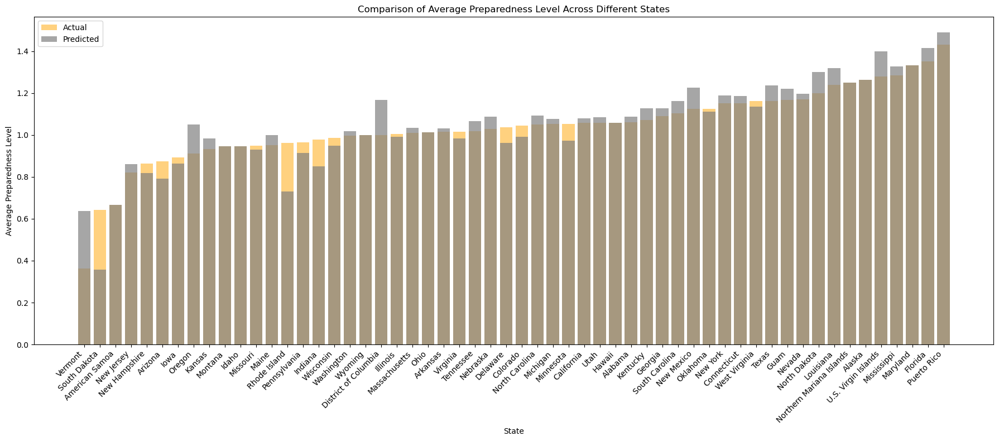

In [110]:
import pandas as pd
import matplotlib.pyplot as plt

# Decode categorical features
X_train_decoded = decode_categorical_features(X_train, label_encodings)
X_test_decoded = decode_categorical_features(X_test, label_encodings)

# Combine predictions from the bagging model for training and testing datasets
all_predictions = np.concatenate([train_preds, test_preds])

# Combine state information from training and testing datasets
all_states = np.concatenate([X_train_decoded['state'], X_test_decoded['state']])

# Create a dataframe with state and corresponding predicted preparedness level
predicted_df = pd.DataFrame({'State': all_states, 'Predicted Preparedness': all_predictions})

# Calculate the distribution of preparedness levels predicted by the bagging model across different states
state_distribution_predicted = predicted_df.groupby('State').mean().sort_values(by='Predicted Preparedness')

# Step 2: Grouping by State and Calculating Average Preparedness for actual data
actual_state_avg_preparedness = selected_data.groupby('state')['preparedness'].mean().sort_values()

# Step 3: Visualization
plt.figure(figsize=(18, 8))

# Get the index of states
states = actual_state_avg_preparedness.index

# Plot actual average preparedness levels
plt.bar(states, actual_state_avg_preparedness, color='orange', alpha=0.5, label='Actual')

# Plot predicted average preparedness levels
plt.bar(state_distribution_predicted.index, state_distribution_predicted['Predicted Preparedness'], color='grey', alpha=0.7, label='Predicted')

plt.title('Comparison of Average Preparedness Level Across Different States')
plt.xlabel('State')
plt.ylabel('Average Preparedness Level')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()


## Stacking Classifier

In [111]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import CategoricalNB
from sklearn.metrics import classification_report, confusion_matrix
from xgboost import XGBClassifier

X = X_encoded
y = selected_data['preparedness']

# Label encode the target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



In [112]:
from sklearn.ensemble import StackingClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Create a list of tuples containing the trained models and their names
base_estimators = [
    ('decision_tree', best_decision_tree),
    ('random_forest', best_rf_model),  
    ('xgb', best_xgb_model),  
]

# Initialize the stacking classifier
stacking_classifier = StackingClassifier(
    estimators=base_estimators,
    final_estimator=LogisticRegression(max_iter=1000, random_state=42)  
)

# Fit the stacking classifier
stacking_classifier.fit(X_train, y_train)

# Make predictions for training and testing data
y_train_pred_stacking = stacking_classifier.predict(X_train)
y_test_pred_stacking = stacking_classifier.predict(X_test)

# Calculate classification reports and confusion matrices for training and testing data
train_classification_report = classification_report(y_train, y_train_pred_stacking)
test_classification_report = classification_report(y_test, y_test_pred_stacking)

train_confusion_matrix = confusion_matrix(y_train, y_train_pred_stacking)
test_confusion_matrix = confusion_matrix(y_test, y_test_pred_stacking)

# Print classification reports and confusion matrices
print("Training Classification Report:\n", train_classification_report)
print("Training Confusion Matrix:\n", train_confusion_matrix)
print("Testing Classification Report:\n", test_classification_report)
print("Testing Confusion Matrix:\n", test_confusion_matrix)


Training Classification Report:
               precision    recall  f1-score   support

           0       0.64      0.69      0.67      1864
           1       0.47      0.19      0.27      1783
           2       0.59      0.82      0.69      2436

    accuracy                           0.60      6083
   macro avg       0.57      0.57      0.54      6083
weighted avg       0.57      0.60      0.56      6083

Training Confusion Matrix:
 [[1283  183  398]
 [ 470  342  971]
 [ 239  199 1998]]
Testing Classification Report:
               precision    recall  f1-score   support

           0       0.59      0.68      0.63       437
           1       0.41      0.14      0.21       460
           2       0.60      0.83      0.70       624

    accuracy                           0.58      1521
   macro avg       0.53      0.55      0.51      1521
weighted avg       0.54      0.58      0.53      1521

Testing Confusion Matrix:
 [[296  51  90]
 [143  64 253]
 [ 65  42 517]]


## Convolutional Neural Network

In [113]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, MaxPooling1D, Flatten
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

# Assuming X_encoded contains your encoded features and y contains the target labels
X = X_encoded
y = selected_data['preparedness']

# Label encode the target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Convert DataFrame to numpy array and then reshape
X_train = np.array(X_train).reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = np.array(X_test).reshape(X_test.shape[0], X_test.shape[1], 1)

# Define the CNN model
model = Sequential()
model.add(Conv1D(filters=128, kernel_size=5, activation='relu', input_shape=(X_train.shape[1], 1)))
model.add(MaxPooling1D(pool_size=2))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(3, activation='softmax'))  

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.1)

# Evaluate the model
train_loss, train_accuracy = model.evaluate(X_train, y_train, verbose=0)
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)

print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)

# Make predictions
y_train_pred_cnn = np.argmax(model.predict(X_train), axis=-1)
y_test_pred_cnn = np.argmax(model.predict(X_test), axis=-1)

# Print classification reports and confusion matrices
print("\nTraining Classification Report:")
print(classification_report(y_train, y_train_pred_cnn))
print("\nTesting Classification Report:")
print(classification_report(y_test, y_test_pred_cnn))

print("\nTraining Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_cnn))
print("\nTesting Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_cnn))

Epoch 1/100
172/172 [==============================] - 3s 12ms/step - loss: 6.6519 - accuracy: 0.3601 - val_loss: 6.3689 - val_accuracy: 0.4072
Epoch 2/100
172/172 [==============================] - 1s 7ms/step - loss: 3.6970 - accuracy: 0.3679 - val_loss: 6.6285 - val_accuracy: 0.2989
Epoch 3/100
172/172 [==============================] - 1s 7ms/step - loss: 2.4839 - accuracy: 0.4010 - val_loss: 2.3092 - val_accuracy: 0.3826
Epoch 4/100
172/172 [==============================] - 2s 10ms/step - loss: 1.8857 - accuracy: 0.4291 - val_loss: 1.9612 - val_accuracy: 0.4236
Epoch 5/100
172/172 [==============================] - 1s 8ms/step - loss: 1.5209 - accuracy: 0.4430 - val_loss: 3.4190 - val_accuracy: 0.4105
Epoch 6/100
172/172 [==============================] - 2s 10ms/step - loss: 1.6789 - accuracy: 0.4450 - val_loss: 1.5516 - val_accuracy: 0.4187
Epoch 7/100
172/172 [==============================] - 1s 7ms/step - loss: 1.4040 - accuracy: 0.4534 - val_loss: 1.8600 - val_accuracy: 0.4

In [114]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, MaxPooling1D, Flatten
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

# Assuming X_encoded contains your encoded features and y contains the target labels
X = X_encoded
y = selected_data['preparedness']

# Label encode the target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Convert DataFrame to numpy array and then reshape
X_train = np.array(X_train).reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = np.array(X_test).reshape(X_test.shape[0], X_test.shape[1], 1)

# Define the CNN model
model = Sequential()
model.add(Conv1D(filters=248, kernel_size=10, activation='relu', input_shape=(X_train.shape[1], 1)))
model.add(MaxPooling1D(pool_size=2))
model.add(Flatten())
model.add(Dense(248, activation='relu'))
model.add(Dense(3, activation='softmax'))  

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=250, batch_size=32, validation_split=0.1)

# Evaluate the model
train_loss, train_accuracy = model.evaluate(X_train, y_train, verbose=0)
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)

print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)

# Make predictions
y_train_pred_cnn = np.argmax(model.predict(X_train), axis=-1)
y_test_pred_cnn = np.argmax(model.predict(X_test), axis=-1)

# Print classification reports and confusion matrices
print("\nTraining Classification Report:")
print(classification_report(y_train, y_train_pred_cnn))
print("\nTesting Classification Report:")
print(classification_report(y_test, y_test_pred_cnn))

print("\nTraining Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_cnn))
print("\nTesting Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_cnn))

Epoch 1/250
172/172 [==============================] - 4s 16ms/step - loss: 6.9634 - accuracy: 0.3548 - val_loss: 2.7088 - val_accuracy: 0.3186
Epoch 2/250
172/172 [==============================] - 2s 12ms/step - loss: 1.9854 - accuracy: 0.3887 - val_loss: 0.9639 - val_accuracy: 0.5238
Epoch 3/250
172/172 [==============================] - 2s 12ms/step - loss: 1.7639 - accuracy: 0.3939 - val_loss: 2.6729 - val_accuracy: 0.4138
Epoch 4/250
172/172 [==============================] - 2s 13ms/step - loss: 1.2714 - accuracy: 0.4567 - val_loss: 1.5992 - val_accuracy: 0.3317
Epoch 5/250
172/172 [==============================] - 2s 12ms/step - loss: 1.2025 - accuracy: 0.4596 - val_loss: 1.2017 - val_accuracy: 0.3941
Epoch 6/250
172/172 [==============================] - 2s 13ms/step - loss: 1.1359 - accuracy: 0.4677 - val_loss: 1.0727 - val_accuracy: 0.5255
Epoch 7/250
172/172 [==============================] - 2s 14ms/step - loss: 1.1304 - accuracy: 0.4715 - val_loss: 1.5125 - val_accuracy:

I've added a Dropout layer with a dropout rate of 0.5 after the first Dense layer. Dropout is a regularization technique that helps prevent overfitting by randomly dropping a fraction of input units (set to 0) during training.
I've also added an additional Dense layer with 64 units before the final output layer to introduce more complexity to the model.
The model is trained for 100 epochs with a batch size of 32.

In [115]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, MaxPooling1D, Flatten, Dropout
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

# Assuming X_encoded contains your encoded features and y contains the target labels
X = X_encoded
y = selected_data['preparedness']

# Label encode the target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Convert DataFrame to numpy array and then reshape
X_train = np.array(X_train).reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = np.array(X_test).reshape(X_test.shape[0], X_test.shape[1], 1)

# Define the CNN model with dropout regularization
model = Sequential()
model.add(Conv1D(filters=128, kernel_size=5, activation='relu', input_shape=(X_train.shape[1], 1)))
model.add(MaxPooling1D(pool_size=2))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))  # Dropout layer with dropout rate of 0.5
model.add(Dense(64, activation='relu'))  # Additional dense layer
model.add(Dense(3, activation='softmax'))  

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.1)

# Evaluate the model
train_loss, train_accuracy = model.evaluate(X_train, y_train, verbose=0)
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)

print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)

# Make predictions
y_train_pred_cnn = np.argmax(model.predict(X_train), axis=-1)
y_test_pred_cnn = np.argmax(model.predict(X_test), axis=-1)

# Print classification reports and confusion matrices
print("\nTraining Classification Report:")
print(classification_report(y_train, y_train_pred_cnn))
print("\nTesting Classification Report:")
print(classification_report(y_test, y_test_pred_cnn))

print("\nTraining Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_cnn))
print("\nTesting Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_cnn))


Epoch 1/100
172/172 [==============================] - 3s 12ms/step - loss: 3.7304 - accuracy: 0.3750 - val_loss: 1.0923 - val_accuracy: 0.4072
Epoch 2/100
172/172 [==============================] - 1s 9ms/step - loss: 1.0923 - accuracy: 0.3997 - val_loss: 1.0873 - val_accuracy: 0.4072
Epoch 3/100
172/172 [==============================] - 1s 6ms/step - loss: 1.0894 - accuracy: 0.3997 - val_loss: 1.0873 - val_accuracy: 0.4072
Epoch 4/100
172/172 [==============================] - 1s 8ms/step - loss: 1.0896 - accuracy: 0.3999 - val_loss: 1.0871 - val_accuracy: 0.4072
Epoch 5/100
172/172 [==============================] - 1s 7ms/step - loss: 1.0889 - accuracy: 0.3997 - val_loss: 1.0869 - val_accuracy: 0.4072
Epoch 6/100
172/172 [==============================] - 1s 6ms/step - loss: 1.0888 - accuracy: 0.3997 - val_loss: 1.0868 - val_accuracy: 0.4072
Epoch 7/100
172/172 [==============================] - 1s 6ms/step - loss: 1.0888 - accuracy: 0.3997 - val_loss: 1.0867 - val_accuracy: 0.407

In [116]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, MaxPooling1D, Flatten
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import tensorflow as tf

# Assuming X_encoded contains your encoded features and y contains the target labels
X = X_encoded
y = selected_data['preparedness']

# Label encode the target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Convert DataFrame to numpy array and then reshape
X_train = np.array(X_train).reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = np.array(X_test).reshape(X_test.shape[0], X_test.shape[1], 1)

# Calculate class weights
class_weights = {0: 1, 1: 1, 2: 1}  # You can adjust these weights based on class frequencies

# Convert class weights to tensors
class_weights_tensor = np.array([class_weights[k] for k in range(len(class_weights))])
class_weights_tensor = tf.convert_to_tensor(class_weights_tensor, dtype=tf.float32)

# Define the weighted loss function
def weighted_loss(y_true, y_pred):
    # Calculate weights based on true labels
    weights = tf.gather(class_weights_tensor, tf.cast(y_true, dtype=tf.int32))
    # Apply weights to cross-entropy loss
    loss = tf.keras.losses.sparse_categorical_crossentropy(y_true, y_pred) * weights
    return tf.reduce_mean(loss)  # Take the mean over all samples in the batch

# Define the CNN model
model = Sequential()
model.add(Conv1D(filters=128, kernel_size=5, activation='relu', input_shape=(X_train.shape[1], 1)))
model.add(MaxPooling1D(pool_size=2))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(3, activation='softmax'))

# Compile the model with weighted loss function
model.compile(optimizer='adam', loss=weighted_loss, metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.1)

# Evaluate the model
train_loss, train_accuracy = model.evaluate(X_train, y_train, verbose=0)
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)

print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)

# Make predictions
y_train_pred_cnn = np.argmax(model.predict(X_train), axis=-1)
y_test_pred_cnn = np.argmax(model.predict(X_test), axis=-1)

# Print classification reports and confusion matrices
print("\nTraining Classification Report:")
print(classification_report(y_train, y_train_pred_cnn))
print("\nTesting Classification Report:")
print(classification_report(y_test, y_test_pred_cnn))

print("\nTraining Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_cnn))
print("\nTesting Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_cnn))


Epoch 1/100
172/172 [==============================] - 3s 11ms/step - loss: 6.7738 - accuracy: 0.3566 - val_loss: 4.6581 - val_accuracy: 0.4072
Epoch 2/100
172/172 [==============================] - 2s 10ms/step - loss: 2.2706 - accuracy: 0.3898 - val_loss: 2.6739 - val_accuracy: 0.3744
Epoch 3/100
172/172 [==============================] - 2s 10ms/step - loss: 2.3762 - accuracy: 0.3908 - val_loss: 1.9664 - val_accuracy: 0.4286
Epoch 4/100
172/172 [==============================] - 2s 9ms/step - loss: 1.7069 - accuracy: 0.4282 - val_loss: 1.7045 - val_accuracy: 0.3580
Epoch 5/100
172/172 [==============================] - 1s 8ms/step - loss: 1.4379 - accuracy: 0.4474 - val_loss: 3.0492 - val_accuracy: 0.4351
Epoch 6/100
172/172 [==============================] - 2s 10ms/step - loss: 1.6733 - accuracy: 0.4302 - val_loss: 2.3918 - val_accuracy: 0.4581
Epoch 7/100
172/172 [==============================] - 1s 7ms/step - loss: 1.5812 - accuracy: 0.4291 - val_loss: 1.7376 - val_accuracy: 0.

In [117]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, MaxPooling1D, Flatten
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import tensorflow as tf

# Assuming X_encoded contains your encoded features and y contains the target labels
X = X_encoded
y = selected_data['preparedness']

# Label encode the target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Convert DataFrame to numpy array and then reshape
X_train = np.array(X_train).reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = np.array(X_test).reshape(X_test.shape[0], X_test.shape[1], 1)

# Calculate class weights
class_weights = {0: 1, 1: 1, 2: 1}  # You can adjust these weights based on class frequencies

# Convert class weights to tensors
class_weights_tensor = np.array([class_weights[k] for k in range(len(class_weights))])
class_weights_tensor = tf.convert_to_tensor(class_weights_tensor, dtype=tf.float32)

# Define the weighted loss function
def weighted_loss(y_true, y_pred):
    # Calculate weights based on true labels
    weights = tf.gather(class_weights_tensor, tf.cast(y_true, dtype=tf.int32))
    # Apply weights to cross-entropy loss
    loss = tf.keras.losses.sparse_categorical_crossentropy(y_true, y_pred) * weights
    return tf.reduce_mean(loss)  # Take the mean over all samples in the batch

# Define the CNN model
model = Sequential()
model.add(Conv1D(filters=128, kernel_size=5, activation='relu', input_shape=(X_train.shape[1], 1)))
model.add(MaxPooling1D(pool_size=2))
model.add(Flatten())
model.add(Dense(248, activation='relu'))
model.add(Dense(3, activation='softmax'))

# Compile the model with weighted loss function
model.compile(optimizer='adam', loss=weighted_loss, metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=250, batch_size=32, validation_split=0.1)

# Evaluate the model
train_loss, train_accuracy = model.evaluate(X_train, y_train, verbose=0)
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)

print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)

# Make predictions
y_train_pred_cnn = np.argmax(model.predict(X_train), axis=-1)
y_test_pred_cnn = np.argmax(model.predict(X_test), axis=-1)

# Print classification reports and confusion matrices
print("\nTraining Classification Report:")
print(classification_report(y_train, y_train_pred_cnn))
print("\nTesting Classification Report:")
print(classification_report(y_test, y_test_pred_cnn))

print("\nTraining Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_cnn))
print("\nTesting Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_cnn))


Epoch 1/250
172/172 [==============================] - 4s 17ms/step - loss: 9.6816 - accuracy: 0.3577 - val_loss: 1.7430 - val_accuracy: 0.3908
Epoch 2/250
172/172 [==============================] - 2s 14ms/step - loss: 3.8843 - accuracy: 0.3738 - val_loss: 3.3348 - val_accuracy: 0.3498
Epoch 3/250
172/172 [==============================] - 3s 15ms/step - loss: 2.4855 - accuracy: 0.3906 - val_loss: 4.9844 - val_accuracy: 0.3186
Epoch 4/250
172/172 [==============================] - 2s 12ms/step - loss: 2.1365 - accuracy: 0.4141 - val_loss: 1.5791 - val_accuracy: 0.3941
Epoch 5/250
172/172 [==============================] - 2s 12ms/step - loss: 1.7166 - accuracy: 0.4353 - val_loss: 3.3267 - val_accuracy: 0.3186
Epoch 6/250
172/172 [==============================] - 2s 13ms/step - loss: 1.6276 - accuracy: 0.4295 - val_loss: 3.2816 - val_accuracy: 0.3186
Epoch 7/250
172/172 [==============================] - 2s 12ms/step - loss: 1.5209 - accuracy: 0.4492 - val_loss: 1.5300 - val_accuracy:

In [118]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, MaxPooling1D, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras import regularizers

# Assuming X_encoded contains your encoded features and y contains the target labels
X = X_encoded
y = selected_data['preparedness']

# Label encode the target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Convert DataFrame to numpy array and then reshape
X_train = np.array(X_train).reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = np.array(X_test).reshape(X_test.shape[0], X_test.shape[1], 1)

# Define the CNN model
model = Sequential()
model.add(Conv1D(filters=128, kernel_size=5, activation='relu', input_shape=(X_train.shape[1], 1)))
model.add(MaxPooling1D(pool_size=2))
model.add(Flatten())
model.add(Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.01)))
model.add(Dropout(0.5))  # Adding dropout for regularization
model.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.01)))  # Additional Dense layer
model.add(Dense(3, activation='softmax'))

# Compile the model with Adam optimizer and weighted loss function
model.compile(optimizer=Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model with early stopping callback
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.1, callbacks=[early_stopping])

# Evaluate the model
train_loss, train_accuracy = model.evaluate(X_train, y_train, verbose=0)
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)

print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)

# Make predictions
y_train_pred_cnn = np.argmax(model.predict(X_train), axis=-1)
y_test_pred_cnn = np.argmax(model.predict(X_test), axis=-1)

# Print classification reports and confusion matrices
print("\nTraining Classification Report:")
print(classification_report(y_train, y_train_pred_cnn))
print("\nTesting Classification Report:")
print(classification_report(y_test, y_test_pred_cnn))

print("\nTraining Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_cnn))
print("\nTesting Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_cnn))

Epoch 1/100
172/172 [==============================] - 3s 10ms/step - loss: 4.6392 - accuracy: 0.3732 - val_loss: 2.0822 - val_accuracy: 0.4072
Epoch 2/100
172/172 [==============================] - 2s 10ms/step - loss: 1.9632 - accuracy: 0.3995 - val_loss: 1.8742 - val_accuracy: 0.4072
Epoch 3/100
172/172 [==============================] - 1s 8ms/step - loss: 1.8193 - accuracy: 0.3997 - val_loss: 1.7662 - val_accuracy: 0.4072
Epoch 4/100
172/172 [==============================] - 1s 7ms/step - loss: 1.7256 - accuracy: 0.3997 - val_loss: 1.6834 - val_accuracy: 0.4072
Epoch 5/100
172/172 [==============================] - 2s 9ms/step - loss: 1.6503 - accuracy: 0.3997 - val_loss: 1.6139 - val_accuracy: 0.4072
Epoch 6/100
172/172 [==============================] - 1s 8ms/step - loss: 1.5856 - accuracy: 0.3997 - val_loss: 1.5536 - val_accuracy: 0.4072
Epoch 7/100
172/172 [==============================] - 1s 7ms/step - loss: 1.5291 - accuracy: 0.3997 - val_loss: 1.5011 - val_accuracy: 0.40

In [119]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, MaxPooling1D, Flatten
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

# Assuming X_encoded contains your encoded features and y contains the target labels
X = X_encoded
y = selected_data['preparedness']

# Label encode the target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Convert DataFrame to numpy array and then reshape
X_train = np.array(X_train).reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = np.array(X_test).reshape(X_test.shape[0], X_test.shape[1], 1)

# Calculate class weights
class_weights = {0: 1, 1: 1, 2: 1}  # You can adjust these weights based on class frequencies

# Define the CNN model
model = Sequential()
model.add(Conv1D(filters=128, kernel_size=5, activation='relu', input_shape=(X_train.shape[1], 1)))
model.add(MaxPooling1D(pool_size=2))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(3, activation='softmax'))

# Compile the model with weighted loss function
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the model with class weights
model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.1, class_weight=class_weights)

# Evaluate the model
train_loss, train_accuracy = model.evaluate(X_train, y_train, verbose=0)
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)

print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)

# Make predictions
y_train_pred_cnn = np.argmax(model.predict(X_train), axis=-1)
y_test_pred_cnn = np.argmax(model.predict(X_test), axis=-1)

# Print classification reports and confusion matrices
print("\nTraining Classification Report:")
print(classification_report(y_train, y_train_pred_cnn))
print("\nTesting Classification Report:")
print(classification_report(y_test, y_test_pred_cnn))

print("\nTraining Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_cnn))
print("\nTesting Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_cnn))

Epoch 1/100
172/172 [==============================] - 3s 11ms/step - loss: 5.7944 - accuracy: 0.3621 - val_loss: 2.4740 - val_accuracy: 0.3218
Epoch 2/100
172/172 [==============================] - 2s 9ms/step - loss: 2.6270 - accuracy: 0.3833 - val_loss: 1.3951 - val_accuracy: 0.3990
Epoch 3/100
172/172 [==============================] - 2s 9ms/step - loss: 1.8606 - accuracy: 0.3992 - val_loss: 1.7962 - val_accuracy: 0.3333
Epoch 4/100
172/172 [==============================] - 2s 10ms/step - loss: 1.7635 - accuracy: 0.4123 - val_loss: 2.4228 - val_accuracy: 0.4417
Epoch 5/100
172/172 [==============================] - 1s 8ms/step - loss: 1.7934 - accuracy: 0.4125 - val_loss: 0.9528 - val_accuracy: 0.5386
Epoch 6/100
172/172 [==============================] - 1s 8ms/step - loss: 1.3141 - accuracy: 0.4456 - val_loss: 1.1784 - val_accuracy: 0.4319
Epoch 7/100
172/172 [==============================] - 1s 8ms/step - loss: 1.4429 - accuracy: 0.4496 - val_loss: 0.9461 - val_accuracy: 0.55

In [120]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, MaxPooling1D, Flatten
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import StratifiedKFold
from scikeras.wrappers import KerasClassifier

# Assuming X_encoded contains your encoded features and y contains the target labels
X = X_encoded
y = selected_data['preparedness']

# Label encode the target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Convert DataFrame to numpy array and then reshape
X_train = np.array(X_train).reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = np.array(X_test).reshape(X_test.shape[0], X_test.shape[1], 1)

# Define the CNN model
def create_model():
    model = Sequential()
    model.add(Conv1D(filters=128, kernel_size=5, activation='relu', input_shape=(X_train.shape[1], 1)))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(Dense(3, activation='softmax'))
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Create the model
model = KerasClassifier(build_fn=create_model, verbose=0)

# Define the grid search parameters
param_grid = {
    'epochs': [50, 100, 150, 200],
    'batch_size': [32, 64, 128]
}

# Define cross-validation
kfold = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Perform grid search
grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=kfold)
grid_result = grid.fit(X_train, y_train)

# Print the best parameters and results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.549237 using {'batch_size': 32, 'epochs': 100}
0.527375 (0.027032) with: {'batch_size': 32, 'epochs': 50}
0.549237 (0.006380) with: {'batch_size': 32, 'epochs': 100}
0.546275 (0.008814) with: {'batch_size': 32, 'epochs': 150}
0.531644 (0.008335) with: {'batch_size': 32, 'epochs': 200}
0.446996 (0.061310) with: {'batch_size': 64, 'epochs': 50}
0.544634 (0.008654) with: {'batch_size': 64, 'epochs': 100}
0.546607 (0.006989) with: {'batch_size': 64, 'epochs': 150}
0.544305 (0.007221) with: {'batch_size': 64, 'epochs': 200}
0.507314 (0.017462) with: {'batch_size': 128, 'epochs': 50}
0.532959 (0.021207) with: {'batch_size': 128, 'epochs': 100}
0.522277 (0.010286) with: {'batch_size': 128, 'epochs': 150}
0.520965 (0.023185) with: {'batch_size': 128, 'epochs': 200}


In [121]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, MaxPooling1D, Flatten
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import StratifiedKFold
from scikeras.wrappers import KerasClassifier

# Assuming X_encoded contains your encoded features and y contains the target labels
X = X_encoded
y = selected_data['preparedness']

# Label encode the target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Convert DataFrame to numpy array and then reshape
X_train = np.array(X_train).reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = np.array(X_test).reshape(X_test.shape[0], X_test.shape[1], 1)

# Define the CNN model
def create_model():
    model = Sequential()
    model.add(Conv1D(filters=128, kernel_size=5, activation='relu', input_shape=(X_train.shape[1], 1)))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(Dense(3, activation='softmax'))
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Create the model
model = KerasClassifier(build_fn=create_model, verbose=0)

# Define the grid search parameters
param_grid = {
    'epochs': [50, 100, 150],
    'batch_size': [32, 64, 128]
}

# Define cross-validation
kfold = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Perform grid search
grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=kfold)
grid_result = grid.fit(X_train, y_train)

# Print the best parameters and results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

# Get the best model
best_model = grid_result.best_estimator_

# Make predictions
y_train_pred_cnn = best_model.predict(X_train)
y_test_pred_cnn = best_model.predict(X_test)

# Evaluate predictions
train_accuracy = np.mean(best_model.predict_proba(X_train))
test_accuracy = np.mean(best_model.predict_proba(X_test))

print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)

# Print classification reports and confusion matrices
print("\nTraining Classification Report:")
print(classification_report(y_train, y_train_pred_cnn))
print("\nTesting Classification Report:")
print(classification_report(y_test, y_test_pred_cnn))

print("\nTraining Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_cnn))
print("\nTesting Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_cnn))


Best: 0.549729 using {'batch_size': 128, 'epochs': 100}
0.542332 (0.004402) with: {'batch_size': 32, 'epochs': 50}
0.540851 (0.007007) with: {'batch_size': 32, 'epochs': 100}
0.549564 (0.003721) with: {'batch_size': 32, 'epochs': 150}
0.507967 (0.029433) with: {'batch_size': 64, 'epochs': 50}
0.540196 (0.012736) with: {'batch_size': 64, 'epochs': 100}
0.542498 (0.015280) with: {'batch_size': 64, 'epochs': 150}
0.488748 (0.040458) with: {'batch_size': 128, 'epochs': 50}
0.549729 (0.008668) with: {'batch_size': 128, 'epochs': 100}
0.524087 (0.016646) with: {'batch_size': 128, 'epochs': 150}
Training Accuracy: 0.33333334
Testing Accuracy: 0.33333334

Training Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.29      0.41      1864
           1       0.33      0.50      0.40      1783
           2       0.58      0.62      0.60      2436

    accuracy                           0.48      6083
   macro avg       0.54      0.47      0

In [122]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, MaxPooling1D, Flatten
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import StratifiedKFold
from scikeras.wrappers import KerasClassifier

# Assuming X_encoded contains your encoded features and y contains the target labels
X = X_encoded
y = selected_data['preparedness']

# Label encode the target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Convert X_train and X_test to numpy arrays
X_train = X_train.to_numpy()
X_test = X_test.to_numpy()

# Modify the input shape to accommodate multiple features
input_shape = (X_train.shape[1], X_train.shape[2]) if len(X_train.shape) > 2 else (X_train.shape[1], 1)

# Reshape X_train and X_test
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2] if len(X_train.shape) > 2 else 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2] if len(X_test.shape) > 2 else 1)

# Define the CNN model with the modified input shape
def create_model():
    model = Sequential()
    model.add(Conv1D(filters=128, kernel_size=5, activation='relu', input_shape=input_shape))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(Dense(3, activation='softmax'))
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Create the model
model = KerasClassifier(build_fn=create_model, verbose=0)

# Define the grid search parameters
param_grid = {
    'epochs': [50, 100, 150],
    'batch_size': [32, 64, 128]
}

# Define cross-validation
kfold = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Perform grid search
grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=kfold)
grid_result = grid.fit(X_train, y_train)

# Print the best parameters and results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

# Get the best model
best_model = grid_result.best_estimator_

# Make predictions
y_train_pred_cnn = best_model.predict(X_train)
y_test_pred_cnn = best_model.predict(X_test)

# Evaluate predictions
train_accuracy = np.mean(best_model.predict_proba(X_train))
test_accuracy = np.mean(best_model.predict_proba(X_test))

print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)

# Print classification reports and confusion matrices
print("\nTraining Classification Report:")
print(classification_report(y_train, y_train_pred_cnn))
print("\nTesting Classification Report:")
print(classification_report(y_test, y_test_pred_cnn))

print("\nTraining Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_cnn))
print("\nTesting Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_cnn))


Best: 0.549234 using {'batch_size': 64, 'epochs': 100}
0.546276 (0.004638) with: {'batch_size': 32, 'epochs': 50}
0.540196 (0.008582) with: {'batch_size': 32, 'epochs': 100}
0.536085 (0.005344) with: {'batch_size': 32, 'epochs': 150}
0.494495 (0.036933) with: {'batch_size': 64, 'epochs': 50}
0.549234 (0.007954) with: {'batch_size': 64, 'epochs': 100}
0.546443 (0.009563) with: {'batch_size': 64, 'epochs': 150}
0.503211 (0.023654) with: {'batch_size': 128, 'epochs': 50}
0.460943 (0.061709) with: {'batch_size': 128, 'epochs': 100}
0.522772 (0.014437) with: {'batch_size': 128, 'epochs': 150}
Training Accuracy: 0.33333334
Testing Accuracy: 0.33333334

Training Classification Report:
              precision    recall  f1-score   support

           0       0.67      0.60      0.63      1864
           1       0.40      0.26      0.32      1783
           2       0.59      0.78      0.67      2436

    accuracy                           0.57      6083
   macro avg       0.55      0.55      0.

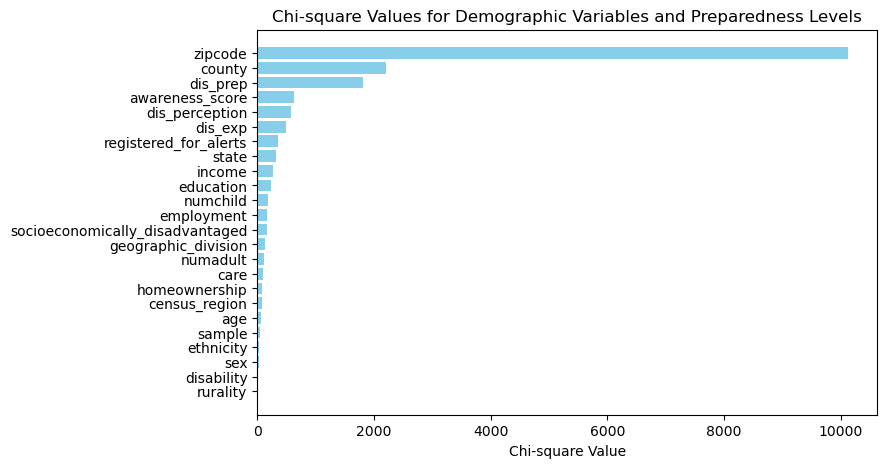

In [123]:
from scipy.stats import chi2_contingency

demographic_variables = selected_data.drop(['preparedness', 'id'], axis=1)

# Initialize an empty dictionary to store chi-square values
chi_square_values = {}

# Iterate over each demographic variable
for variable in demographic_variables:
    # Create contingency table
    contingency_table = pd.crosstab(selected_data[variable], selected_data['preparedness'])
    
    # Perform chi-square test of independence
    chi2, p_value, dof, expected = chi2_contingency(contingency_table)
    
    # Store chi-square value in the dictionary
    chi_square_values[variable] = chi2

# Sort the chi-square values in descending order
sorted_chi_square_values = sorted(chi_square_values.items(), key=lambda x: x[1], reverse=True)

# Extract variable names and chi-square values
variables = [item[0] for item in sorted_chi_square_values]
values = [item[1] for item in sorted_chi_square_values]

# Plotting
plt.figure(figsize=(8, 5))
plt.barh(variables, values, color='skyblue')
plt.xlabel('Chi-square Value')
plt.title('Chi-square Values for Demographic Variables and Preparedness Levels')
plt.gca().invert_yaxis()  # Invert y-axis to have the highest value at the top
plt.show()

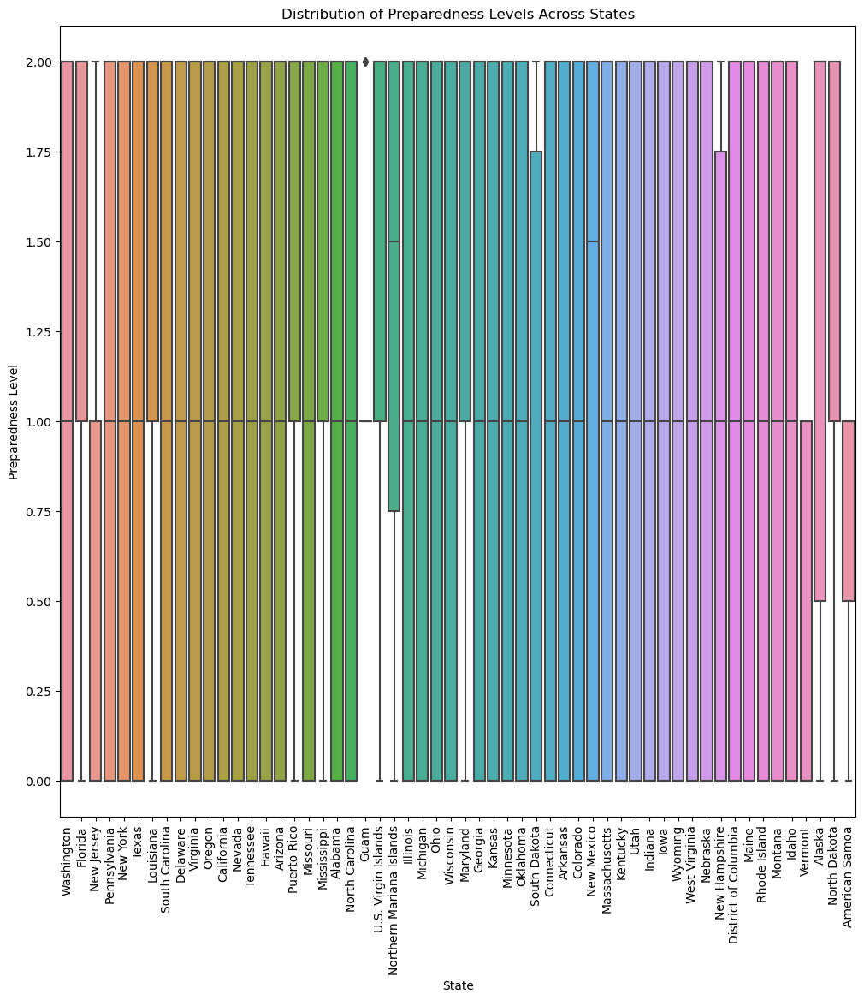

ANOVA Test Results:
F-Statistic: 4.300205445758878
p-value: 6.862556150064215e-24


In [124]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import f_oneway

# Calculate descriptive statistics for preparedness levels across states
statewise_preparedness_stats = selected_data.groupby('state')['preparedness'].describe()

# Plotting the distribution of preparedness levels across states
plt.figure(figsize=(12, 12))
sns.boxplot(x='state', y='preparedness', data=selected_data)
plt.title('Distribution of Preparedness Levels Across States')
plt.xlabel('State')
plt.ylabel('Preparedness Level')
plt.xticks(rotation=90)
plt.show()

# Perform ANOVA test to assess differences in preparedness levels across states
state_groups = [group['preparedness'] for name, group in selected_data.groupby('state')]
f_statistic, p_value = f_oneway(*state_groups)

print("ANOVA Test Results:")
print("F-Statistic:", f_statistic)
print("p-value:", p_value)

In [128]:
from scipy.stats import chi2_contingency

# For awareness score
awareness_crosstab = pd.crosstab(selected_data['awareness_score'], selected_data['preparedness'])
chi2_awareness, p_awareness, _, _ = chi2_contingency(awareness_crosstab)

# For past experiences
experiences_crosstab = pd.crosstab(selected_data['dis_exp'], selected_data['preparedness'])
chi2_experiences, p_experiences, _, _ = chi2_contingency(experiences_crosstab)

print("Chi-square test results for Awareness Score:")
print("Chi-square value:", chi2_awareness)
print("p-value:", p_awareness)

print("\nChi-square test results for Past Experiences:")
print("Chi-square value:", chi2_experiences)
print("p-value:", p_experiences)


Chi-square test results for Awareness Score:
Chi-square value: 633.618797877549
p-value: 1.302368860804913e-133

Chi-square test results for Past Experiences:
Chi-square value: 490.35774818452995
p-value: 8.154900821077549e-105


## Recurrent Neural Network

In [114]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix
from scikeras.wrappers import KerasClassifier

# Assuming X_encoded contains your encoded features and y contains the target labels
X = X_encoded
y = selected_data['preparedness']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Modify the input shape to accommodate multiple features
input_shape = (X_train.shape[1], X_train.shape[2]) if len(X_train.shape) > 2 else (X_train.shape[1], 1)

# Define the RNN model with the modified input shape
def create_rnn_model():
    model = Sequential()
    model.add(SimpleRNN(units=128, input_shape=input_shape, return_sequences=True))
    model.add(SimpleRNN(units=64))  # Adding another RNN layer
    model.add(Dense(32, activation='relu'))  # Additional Dense layer
    model.add(Dense(3, activation='softmax'))
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Create the model
model = KerasClassifier(build_fn=create_rnn_model, verbose=0)

# Define the grid search parameters
param_grid = {
    'epochs': [50, 100, 150],
    'batch_size': [32, 64, 128]
}

# Define cross-validation
kfold = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Perform grid search
grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=kfold, error_score='raise')
grid_result = grid.fit(X_train, y_train)

# Print the best parameters and results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

# Get the best model
best_model = grid_result.best_estimator_

# Make predictions
y_train_pred_rnn = best_model.predict(X_train)
y_test_pred_rnn = best_model.predict(X_test)

# Evaluate predictions
train_accuracy = np.mean(best_model.predict_proba(X_train))
test_accuracy = np.mean(best_model.predict_proba(X_test))

print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)

# Print classification reports and confusion matrices
print("\nTraining Classification Report:")
print(classification_report(y_train, y_train_pred_rnn))
print("\nTesting Classification Report:")
print(classification_report(y_test, y_test_pred_rnn))

print("\nTraining Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_rnn))
print("\nTesting Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_rnn))


Best: 0.506823 using {'batch_size': 128, 'epochs': 50}
0.498603 (0.012282) with: {'batch_size': 32, 'epochs': 50}
0.484631 (0.007930) with: {'batch_size': 32, 'epochs': 100}
0.489890 (0.001318) with: {'batch_size': 32, 'epochs': 150}
0.498442 (0.014991) with: {'batch_size': 64, 'epochs': 50}
0.471970 (0.005988) with: {'batch_size': 64, 'epochs': 100}
0.478877 (0.004745) with: {'batch_size': 64, 'epochs': 150}
0.506823 (0.005153) with: {'batch_size': 128, 'epochs': 50}
0.472955 (0.009664) with: {'batch_size': 128, 'epochs': 100}
0.479534 (0.008198) with: {'batch_size': 128, 'epochs': 150}
Training Accuracy: 0.33333334
Testing Accuracy: 0.33333334

Training Classification Report:
              precision    recall  f1-score   support

           0       0.67      0.85      0.75      1864
           1       0.69      0.29      0.41      1783
           2       0.68      0.84      0.75      2436

    accuracy                           0.68      6083
   macro avg       0.68      0.66      0.

In [115]:
X_train.shape[1]

23

In [27]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from keras.utils import to_categorical

# X_encoded contains encoded features and y contains the target labels
X = X_encoded
y = selected_data['preparedness']

# One-hot encode the target variable
y_encoded = label_encoder.fit_transform(y)
y_onehot = to_categorical(y_encoded, num_classes=3)  

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_onehot, test_size=0.2, random_state=42)


# Modify the input shape to accommodate multiple features
input_shape = (X_train.shape[1], 1)  # Assuming each feature is considered independently

# Define the RNN model with fixed hyperparameters
def create_rnn_model():
    model = Sequential()
    model.add(SimpleRNN(units=128, input_shape=input_shape, return_sequences=True))
    model.add(SimpleRNN(units=64))  # Adding another RNN layer
    model.add(Dense(32, activation='relu'))  # Additional Dense layer
    model.add(Dense(3, activation='softmax'))
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Create the model
model = create_rnn_model()

# Train the model
model.fit(X_train, y_train, epochs=100, batch_size=64, validation_data=(X_test, y_test), verbose=1)

# Evaluate the model
train_loss, train_accuracy = model.evaluate(X_train, y_train, verbose=0)
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)

print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)

# Make predictions
y_train_pred_rnn = np.argmax(model.predict(X_train), axis=1)
y_test_pred_rnn = np.argmax(model.predict(X_test), axis=1)

# Convert predicted values to one-hot encoded format
y_train_pred_rnn_onehot = to_categorical(y_train_pred_rnn)
y_test_pred_rnn_onehot = to_categorical(y_test_pred_rnn)

# Print classification reports and confusion matrices
print("\nTraining Classification Report:")
print(classification_report(y_train, y_train_pred_rnn_onehot))
print("\nTesting Classification Report:")
print(classification_report(y_test, y_test_pred_rnn_onehot))

print("\nTraining Confusion Matrix:")
print(confusion_matrix(y_train.argmax(axis=1), y_train_pred_rnn.argmax(axis=1)))
print("\nTesting Confusion Matrix:")
print(confusion_matrix(y_test.argmax(axis=1), y_test_pred_rnn.argmax(axis=1)))

Epoch 1/100
96/96 [==============================] - 8s 38ms/step - loss: 1.0734 - accuracy: 0.4279 - val_loss: 1.0431 - val_accuracy: 0.4648
Epoch 2/100
96/96 [==============================] - 3s 27ms/step - loss: 1.0164 - accuracy: 0.4907 - val_loss: 1.0214 - val_accuracy: 0.4826
Epoch 3/100
96/96 [==============================] - 3s 28ms/step - loss: 0.9910 - accuracy: 0.5170 - val_loss: 0.9943 - val_accuracy: 0.4990
Epoch 4/100
96/96 [==============================] - 3s 29ms/step - loss: 0.9746 - accuracy: 0.5308 - val_loss: 0.9337 - val_accuracy: 0.5588
Epoch 5/100
96/96 [==============================] - 3s 28ms/step - loss: 0.9548 - accuracy: 0.5402 - val_loss: 0.9889 - val_accuracy: 0.4931
Epoch 6/100
96/96 [==============================] - 3s 28ms/step - loss: 0.9820 - accuracy: 0.5215 - val_loss: 1.0037 - val_accuracy: 0.5181
Epoch 7/100
96/96 [==============================] - 3s 28ms/step - loss: 0.9531 - accuracy: 0.5377 - val_loss: 0.9444 - val_accuracy: 0.5556
Epoch 

AxisError: axis 1 is out of bounds for array of dimension 1

In [28]:
from sklearn.metrics import classification_report

# Convert predicted values to indices
y_train_pred_indices = np.argmax(y_train_pred_rnn_onehot, axis=1)
y_test_pred_indices = np.argmax(y_test_pred_rnn_onehot, axis=1)

# Convert one-hot encoded y_train and y_test back to class indices
y_train_indices = np.argmax(y_train, axis=1)
y_test_indices = np.argmax(y_test, axis=1)

# Print classification reports for training and testing data
print("\nTraining Classification Report:")
print(classification_report(y_train_indices, y_train_pred_indices))

print("\nTesting Classification Report:")
print(classification_report(y_test_indices, y_test_pred_indices))



Training Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.89      0.89      1864
           1       0.79      0.76      0.78      1783
           2       0.85      0.87      0.86      2436

    accuracy                           0.84      6083
   macro avg       0.84      0.84      0.84      6083
weighted avg       0.84      0.84      0.84      6083


Testing Classification Report:
              precision    recall  f1-score   support

           0       0.53      0.60      0.56       437
           1       0.34      0.30      0.32       460
           2       0.59      0.58      0.59       624

    accuracy                           0.50      1521
   macro avg       0.49      0.50      0.49      1521
weighted avg       0.50      0.50      0.50      1521



Epoch 1/100
96/96 [==============================] - 3s 31ms/step - loss: 0.4197 - accuracy: 0.8262 - val_loss: 1.7562 - val_accuracy: 0.4859
Epoch 2/100
96/96 [==============================] - 3s 29ms/step - loss: 0.4024 - accuracy: 0.8317 - val_loss: 1.7569 - val_accuracy: 0.5122
Epoch 3/100
96/96 [==============================] - 3s 30ms/step - loss: 0.3912 - accuracy: 0.8361 - val_loss: 1.7140 - val_accuracy: 0.4806
Epoch 4/100
96/96 [==============================] - 3s 26ms/step - loss: 0.3893 - accuracy: 0.8389 - val_loss: 1.9875 - val_accuracy: 0.4773
Epoch 5/100
96/96 [==============================] - 2s 25ms/step - loss: 0.3916 - accuracy: 0.8392 - val_loss: 1.8372 - val_accuracy: 0.5076
Epoch 6/100
96/96 [==============================] - 3s 27ms/step - loss: 0.3330 - accuracy: 0.8636 - val_loss: 1.8996 - val_accuracy: 0.4951
Epoch 7/100
96/96 [==============================] - 3s 29ms/step - loss: 0.3932 - accuracy: 0.8415 - val_loss: 1.8859 - val_accuracy: 0.4819
Epoch 

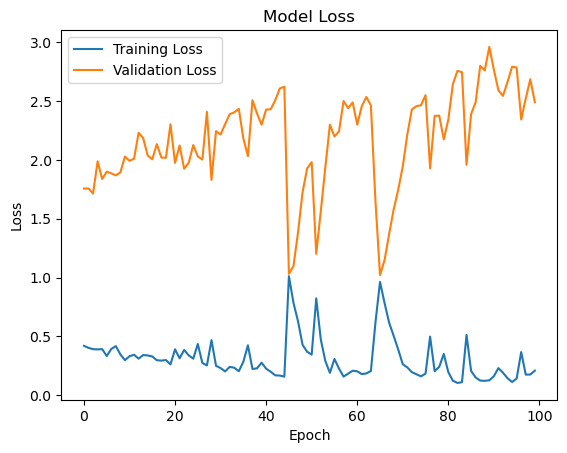

In [29]:
import matplotlib.pyplot as plt

# Train the model and save the training history
history = model.fit(X_train, y_train, epochs=100, batch_size=64, validation_data=(X_test, y_test), verbose=1)

# Plot training loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


Epoch 1/200
96/96 [==============================] - 8s 43ms/step - loss: 1.1272 - accuracy: 0.3630 - val_loss: 1.0844 - val_accuracy: 0.4122
Epoch 2/200
96/96 [==============================] - 3s 33ms/step - loss: 1.0998 - accuracy: 0.3745 - val_loss: 1.0489 - val_accuracy: 0.4471
Epoch 3/200
96/96 [==============================] - 3s 35ms/step - loss: 1.1018 - accuracy: 0.3817 - val_loss: 1.0851 - val_accuracy: 0.4103
Epoch 4/200
96/96 [==============================] - 3s 35ms/step - loss: 1.0967 - accuracy: 0.3860 - val_loss: 1.0956 - val_accuracy: 0.4017
Epoch 5/200
96/96 [==============================] - 3s 36ms/step - loss: 1.0941 - accuracy: 0.3875 - val_loss: 1.0889 - val_accuracy: 0.4103
Epoch 6/200
96/96 [==============================] - 3s 33ms/step - loss: 1.0917 - accuracy: 0.3959 - val_loss: 1.0828 - val_accuracy: 0.4103
Epoch 7/200
96/96 [==============================] - 3s 33ms/step - loss: 1.0761 - accuracy: 0.4097 - val_loss: 1.0258 - val_accuracy: 0.4898
Epoch 

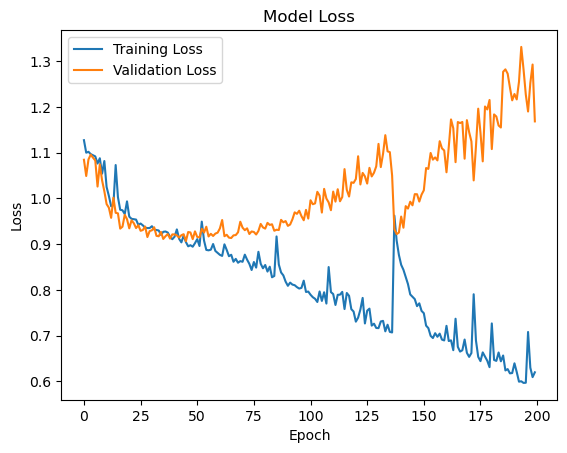

In [30]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense, Dropout
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from keras.utils import to_categorical

# Assuming X_encoded contains encoded features and y contains the target labels
X = X_encoded
y = selected_data['preparedness']

# One-hot encode the target variable
y_encoded = label_encoder.fit_transform(y)
y_onehot = to_categorical(y_encoded, num_classes=3)  

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_onehot, test_size=0.2, random_state=42)

# Modify the input shape to accommodate multiple features
input_shape = (X_train.shape[1], 1)  # Assuming each feature is considered independently

# Define the RNN model with dropout regularization
def create_rnn_model():
    model = Sequential()
    model.add(SimpleRNN(units=128, input_shape=input_shape, return_sequences=True))
    model.add(Dropout(0.2))  # Introducing dropout regularization
    model.add(SimpleRNN(units=64))  # Adding another RNN layer
    model.add(Dropout(0.2))  # Introducing dropout regularization
    model.add(Dense(32, activation='relu'))  # Additional Dense layer
    model.add(Dense(3, activation='softmax'))
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Create the model
model = create_rnn_model()

# Train the model with increased number of epochs
history = model.fit(X_train, y_train, epochs=200, batch_size=64, validation_data=(X_test, y_test), verbose=1)

# Evaluate the model
train_loss, train_accuracy = model.evaluate(X_train, y_train, verbose=0)
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)

print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)

# Make predictions
y_train_pred_rnn = np.argmax(model.predict(X_train), axis=1)
y_test_pred_rnn = np.argmax(model.predict(X_test), axis=1)

# Convert predicted values to one-hot encoded format
y_train_pred_rnn_onehot = to_categorical(y_train_pred_rnn)
y_test_pred_rnn_onehot = to_categorical(y_test_pred_rnn)

# Print classification reports and confusion matrices
print("\nTraining Classification Report:")
print(classification_report(y_train.argmax(axis=1), y_train_pred_rnn))
print("\nTesting Classification Report:")
print(classification_report(y_test.argmax(axis=1), y_test_pred_rnn))

print("\nTraining Confusion Matrix:")
print(confusion_matrix(y_train.argmax(axis=1), y_train_pred_rnn))
print("\nTesting Confusion Matrix:")
print(confusion_matrix(y_test.argmax(axis=1), y_test_pred_rnn))

# Plot training loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [40]:
X_train.shape

(6083, 23)

In [27]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from keras.utils import to_categorical

# Assuming X_encoded contains encoded features and y contains the target labels
X = X_encoded
y = selected_data['preparedness']

# One-hot encode the target variable
y_encoded = label_encoder.fit_transform(y)
y_onehot = to_categorical(y_encoded, num_classes=3)  

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_onehot, test_size=0.2, random_state=42)

# Modify the input shape to consider it as time series data
time_steps = X_train.shape[1]  # Number of time steps
num_features = X_train.shape[2] if len(X_train.shape) > 2 else 1  # Number of features at each time step
input_shape = (time_steps, num_features)

# Define the RNN model with the updated input shape
def create_rnn_model():
    model = Sequential()
    model.add(SimpleRNN(units=128, input_shape=input_shape, return_sequences=True))
    model.add(SimpleRNN(units=64))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(3, activation='softmax'))
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Create the model
model = create_rnn_model()

# Train the model
history = model.fit(X_train, y_train, epochs=250, batch_size=64, validation_data=(X_test, y_test), verbose=1)

# Evaluate the model
train_loss, train_accuracy = model.evaluate(X_train, y_train, verbose=0)
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)

print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)

# Make predictions
y_train_pred_rnn = np.argmax(model.predict(X_train), axis=1)
y_test_pred_rnn = np.argmax(model.predict(X_test), axis=1)

# Convert predicted values to one-hot encoded format
y_train_pred_rnn_onehot = to_categorical(y_train_pred_rnn)
y_test_pred_rnn_onehot = to_categorical(y_test_pred_rnn)

# Print classification reports and confusion matrices
print("\nTraining Classification Report:")
print(classification_report(y_train.argmax(axis=1), y_train_pred_rnn))
print("\nTesting Classification Report:")
print(classification_report(y_test.argmax(axis=1), y_test_pred_rnn))

print("\nTraining Confusion Matrix:")
print(confusion_matrix(y_train.argmax(axis=1), y_train_pred_rnn))
print("\nTesting Confusion Matrix:")
print(confusion_matrix(y_test.argmax(axis=1), y_test_pred_rnn))


Epoch 1/250
96/96 [==============================] - 10s 58ms/step - loss: 1.0827 - accuracy: 0.4144 - val_loss: 0.9834 - val_accuracy: 0.5194
Epoch 2/250
96/96 [==============================] - 3s 28ms/step - loss: 1.0001 - accuracy: 0.5111 - val_loss: 1.0141 - val_accuracy: 0.5036
Epoch 3/250
96/96 [==============================] - 3s 36ms/step - loss: 0.9792 - accuracy: 0.5252 - val_loss: 0.9456 - val_accuracy: 0.5496
Epoch 4/250
96/96 [==============================] - 3s 36ms/step - loss: 0.9642 - accuracy: 0.5346 - val_loss: 0.9331 - val_accuracy: 0.5582
Epoch 5/250
96/96 [==============================] - 3s 31ms/step - loss: 0.9553 - accuracy: 0.5364 - val_loss: 0.9296 - val_accuracy: 0.5634
Epoch 6/250
96/96 [==============================] - 3s 36ms/step - loss: 0.9502 - accuracy: 0.5402 - val_loss: 0.9287 - val_accuracy: 0.5536
Epoch 7/250
96/96 [==============================] - 4s 45ms/step - loss: 0.9485 - accuracy: 0.5425 - val_loss: 1.0178 - val_accuracy: 0.4760
Epoch

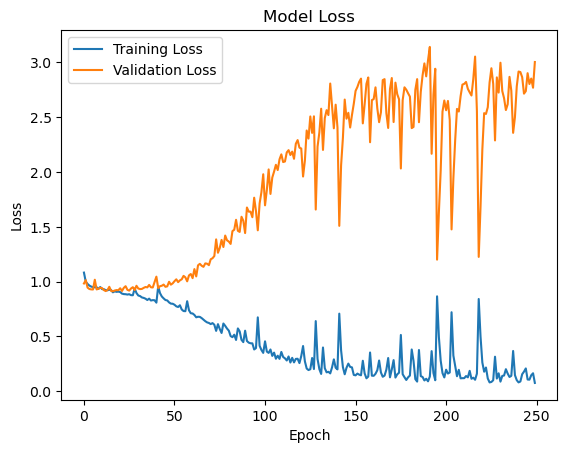

In [28]:
# Plot training loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

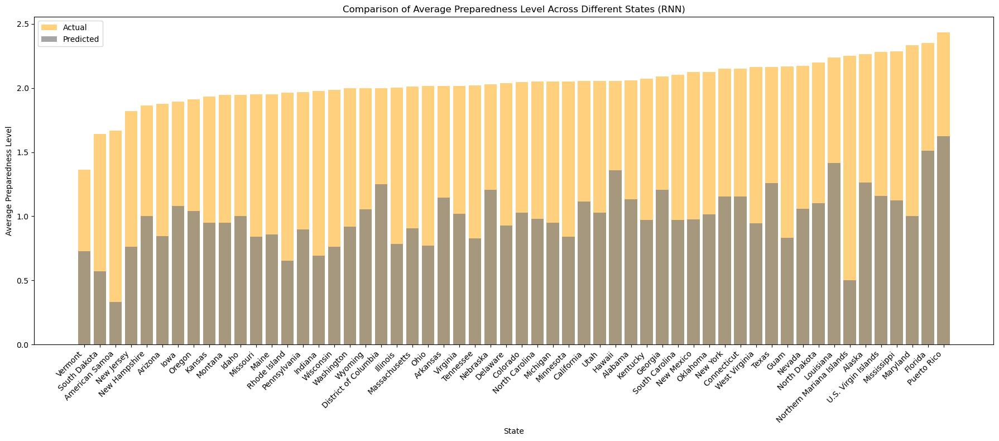

In [116]:
import pandas as pd
import matplotlib.pyplot as plt

# Combine predictions from the RNN model for training and testing datasets
all_predictions_rnn = np.concatenate([y_train_pred_rnn, y_test_pred_rnn])

# Combine state information from training and testing datasets
all_states_rnn = np.concatenate([selected_data.loc[X_train.index, 'state'], selected_data.loc[X_test.index, 'state']])

# Create a dataframe with state and corresponding predicted preparedness level
predicted_df_rnn = pd.DataFrame({'State': all_states_rnn, 'Predicted Preparedness': all_predictions_rnn})

# Calculate the distribution of preparedness levels predicted by the RNN model across different states
state_distribution_predicted_rnn = predicted_df_rnn.groupby('State').mean().sort_values(by='Predicted Preparedness')

# Step 2: Grouping by State and Calculating Average Preparedness for actual data
actual_state_avg_preparedness = selected_data.groupby('state')['preparedness'].mean().sort_values()

# Step 3: Visualization
plt.figure(figsize=(18, 8))

# Get the index of states
states = actual_state_avg_preparedness.index

# Plot actual average preparedness levels
plt.bar(states, actual_state_avg_preparedness, color='orange', alpha=0.5, label='Actual')

# Plot predicted average preparedness levels
plt.bar(state_distribution_predicted_rnn.index, state_distribution_predicted_rnn['Predicted Preparedness'], color='grey', alpha=0.7, label='Predicted')

plt.title('Comparison of Average Preparedness Level Across Different States (RNN)')
plt.xlabel('State')
plt.ylabel('Average Preparedness Level')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()


Epoch [1/10], Train Loss: 1.1090, Test Loss: 1.1090
Epoch [2/10], Train Loss: 1.0934, Test Loss: 1.0934
Epoch [3/10], Train Loss: 1.1091, Test Loss: 1.1091
Epoch [4/10], Train Loss: 1.1058, Test Loss: 1.1058
Epoch [5/10], Train Loss: 1.1161, Test Loss: 1.1161
Epoch [6/10], Train Loss: 1.1191, Test Loss: 1.1191
Epoch [7/10], Train Loss: 1.1090, Test Loss: 1.1090
Epoch [8/10], Train Loss: 1.1100, Test Loss: 1.1100
Epoch [9/10], Train Loss: 1.1052, Test Loss: 1.1052
Epoch [10/10], Train Loss: 1.1318, Test Loss: 1.1318


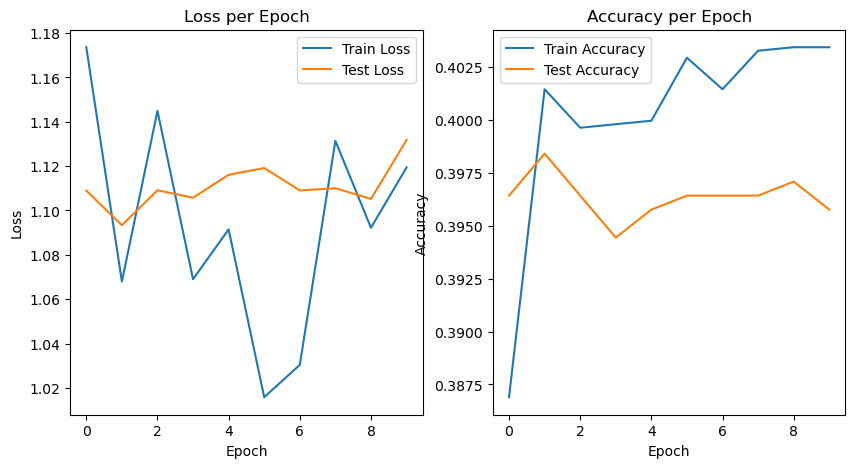

Classification Report for Train Data:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      1842
           1       0.46      0.01      0.02      1768
           2       0.40      1.00      0.57      2433

    accuracy                           0.40      6043
   macro avg       0.29      0.33      0.20      6043
weighted avg       0.30      0.40      0.24      6043

Classification Report for Test Data:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       450
           1       0.00      0.00      0.00       462
           2       0.40      1.00      0.57       599

    accuracy                           0.40      1511
   macro avg       0.13      0.33      0.19      1511
weighted avg       0.16      0.40      0.23      1511



In [128]:
import torch
import numpy as np
import pandas as pd
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.nn.functional as F
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

# Step 1: Encode categorical variables into numerical representations
label_encoder = LabelEncoder()
one_hot_encoder = OneHotEncoder(sparse=False)

# Encode 'dis_prep', 'dis_perception', and 'dis_exp'
selected_data['dis_prep_encoded'] = label_encoder.fit_transform(selected_data['dis_prep'])
selected_data['dis_perception_encoded'] = label_encoder.fit_transform(selected_data['dis_perception'])
selected_data['dis_exp_encoded'] = label_encoder.fit_transform(selected_data['dis_exp'])

# Step 2: Create a new dataframe with encoded features along with 'awareness_score' and 'preparedness'
encoded_df = pd.DataFrame({
    'awareness_score': selected_data['awareness_score'],
    'dis_prep_encoded': selected_data['dis_prep_encoded'],
    'dis_perception_encoded': selected_data['dis_perception_encoded'],
    'dis_exp_encoded': selected_data['dis_exp_encoded'],
    'preparedness': selected_data['preparedness']
})

def time_sequence(df, n_day):
    X = []
    y = []
    for i in range(len(df) - n_day):
        a = []
        b = 0
        for j in range(n_day):
            # Replace original features with encoded features
            a.append([
                df.iloc[i+j]['awareness_score'], 
                df.iloc[i+j]['dis_prep_encoded'], 
                df.iloc[i+j]['dis_perception_encoded'], 
                df.iloc[i+j]['dis_exp_encoded']
            ])
        b = df.iloc[i+j+1]['preparedness']  # Assuming the target variable is 'preparedness'
        X.append(a)
        y.append(b)
    X = np.array(X)
    y = np.array(y)
    return X, y

# Call the modified function to create input sequences
n_days = 50
X, y = time_sequence(encoded_df, n_days)

"""def time_sequence(df, n_day):
    X = []
    y = []
    features = ['awareness_score', 'dis_exp', 'dis_perception', 'dis_prep']
    for i in range(len(df) - n_day):
        # Convert object type features to numerical data
        X_values = df[features].iloc[i:i+n_day].astype(float).values
        X.append(X_values)
        y.append(df['preparedness'].iloc[i + n_day])  # Assuming the target variable is 'preparedness'
    X = np.array(X)
    y = np.array(y)
    return X, y


# Form the sequence input data for the interval of 50 days
n_days = 50
X, y = time_sequence(selected_data, n_days)"""

# Split the data into train and test subsets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the dataset class
class PreparednessDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.tensor(X, dtype=torch.float32)
        self.y = torch.tensor(y, dtype=torch.long)

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

# Create train and test datasets
train_dataset = PreparednessDataset(X_train, y_train)
test_dataset = PreparednessDataset(X_test, y_test)

# Create train and test data loaders
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

# Define the RNN model
class RNNModel(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(RNNModel, self).__init__()
        self.rnn = nn.RNN(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        out, _ = self.rnn(x)
        out = self.fc(out[:, -1, :])  # Extract the last time step's output
        return out

# Initialize the model
input_size = 4  # Number of input features
hidden_size = 128
num_layers = 2
output_size = 3  
model = RNNModel(input_size, hidden_size, num_layers, output_size)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Train the model
num_epochs = 100
train_losses = []
test_losses = []
train_accuracy = []
test_accuracy = []

for epoch in range(num_epochs):
    # Train the model
    model.train()
    correct_train = 0
    total_train = 0
    for inputs, labels in train_loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        _, predicted = torch.max(outputs, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
        
    train_accuracy.append(correct_train / total_train)
    train_losses.append(loss.item())

    # Evaluate the model on test data
    model.eval()
    correct_test = 0
    total_test = 0
    with torch.no_grad():
        for inputs, labels in test_loader:
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            
            _, predicted = torch.max(outputs, 1)
            total_test += labels.size(0)
            correct_test += (predicted == labels).sum().item()
            
    test_accuracy.append(correct_test / total_test)
    test_losses.append(loss.item())

    print(f'Epoch [{epoch+1}/{num_epochs}], Train Loss: {loss.item():.4f}, Test Loss: {test_losses[-1]:.4f}')

# Plot loss function and accuracy
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss per Epoch')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_accuracy, label='Train Accuracy')
plt.plot(test_accuracy, label='Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy per Epoch')
plt.legend()
plt.show()

# Print classification report
model.eval()
with torch.no_grad():
    y_true_train = []
    y_pred_train = []
    for inputs, labels in train_loader:
        outputs = model(inputs)
        _, predicted = torch.max(outputs, 1)
        y_true_train.extend(labels.numpy())
        y_pred_train.extend(predicted.numpy())

    y_true_test = []
    y_pred_test = []
    for inputs, labels in test_loader:
        outputs = model(inputs)
        _, predicted = torch.max(outputs, 1)
        y_true_test.extend(labels.numpy())
        y_pred_test.extend(predicted.numpy())

print('Classification Report for Train Data:')
print(classification_report(y_true_train, y_pred_train))

print('Classification Report for Test Data:')
print(classification_report(y_true_test, y_pred_test))

In [129]:
selected_data.drop(['dis_prep_encoded', 'dis_perception_encoded', 'dis_exp_encoded'], axis=1, inplace=True)

In [129]:
import torch
import numpy as np
import pandas as pd
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.nn.functional as F
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

# Step 1: Encode categorical variables into numerical representations
label_encoder = LabelEncoder()
one_hot_encoder = OneHotEncoder(sparse=False)

# Encode 'dis_prep', 'dis_perception', and 'dis_exp'
selected_data['dis_prep_encoded'] = label_encoder.fit_transform(selected_data['dis_prep'])
selected_data['dis_perception_encoded'] = label_encoder.fit_transform(selected_data['dis_perception'])
selected_data['dis_exp_encoded'] = label_encoder.fit_transform(selected_data['dis_exp'])
selected_data['registered_for_alerts_encoded'] = label_encoder.fit_transform(selected_data['registered_for_alerts'])

In [130]:
# Step 2: Create a new dataframe with encoded features along with 'awareness_score' and 'preparedness'
encoded_df = pd.DataFrame({
    'awareness_score': selected_data['awareness_score'],
    'dis_prep_encoded': selected_data['dis_prep_encoded'],
    'dis_perception_encoded': selected_data['dis_perception_encoded'],
    'registered_for_alerts_encoded': selected_data['registered_for_alerts_encoded'],
    'dis_exp_encoded': selected_data['dis_exp_encoded'],
    'preparedness': selected_data['preparedness']
})

def time_sequence(df, n_day):
    X = []
    y = []
    for i in range(len(df) - n_day):
        a = []
        b = 0
        for j in range(n_day):
            # Replace original features with encoded features
            a.append([
                df.iloc[i+j]['awareness_score'], 
                df.iloc[i+j]['dis_prep_encoded'], 
                df.iloc[i+j]['dis_perception_encoded'],
                df.iloc[i+j]['registered_for_alerts_encoded'], 
                df.iloc[i+j]['dis_exp_encoded']
            ])
        b = df.iloc[i+j+1]['preparedness']  # Assuming the target variable is 'preparedness'
        X.append(a)
        y.append(b)
    X = np.array(X)
    y = np.array(y)
    return X, y

# Call the modified function to create input sequences
n_days = 150
X, y = time_sequence(encoded_df, n_days)


# Split the data into train and test subsets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the dataset class
class PreparednessDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.tensor(X, dtype=torch.float32)
        self.y = torch.tensor(y, dtype=torch.long)

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

# Create train and test datasets
train_dataset = PreparednessDataset(X_train, y_train)
test_dataset = PreparednessDataset(X_test, y_test)

# Create train and test data loaders
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

Epoch [1/100], Train Loss: 1.0934, Test Loss: 1.0934
Epoch [2/100], Train Loss: 1.0974, Test Loss: 1.0974
Epoch [3/100], Train Loss: 1.0971, Test Loss: 1.0971
Epoch [4/100], Train Loss: 1.0940, Test Loss: 1.0940
Epoch [5/100], Train Loss: 1.0978, Test Loss: 1.0978
Epoch [6/100], Train Loss: 1.0969, Test Loss: 1.0969
Epoch [7/100], Train Loss: 1.0973, Test Loss: 1.0973
Epoch [8/100], Train Loss: 1.0984, Test Loss: 1.0984
Epoch [9/100], Train Loss: 1.0939, Test Loss: 1.0939
Epoch [10/100], Train Loss: 1.0979, Test Loss: 1.0979
Epoch [11/100], Train Loss: 1.0954, Test Loss: 1.0954
Epoch [12/100], Train Loss: 1.0998, Test Loss: 1.0998
Epoch [13/100], Train Loss: 1.1016, Test Loss: 1.1016
Epoch [14/100], Train Loss: 1.0968, Test Loss: 1.0968
Epoch [15/100], Train Loss: 1.1017, Test Loss: 1.1017
Epoch [16/100], Train Loss: 1.1010, Test Loss: 1.1010
Epoch [17/100], Train Loss: 1.0988, Test Loss: 1.0988
Epoch [18/100], Train Loss: 1.1042, Test Loss: 1.1042
Epoch [19/100], Train Loss: 1.0936, T

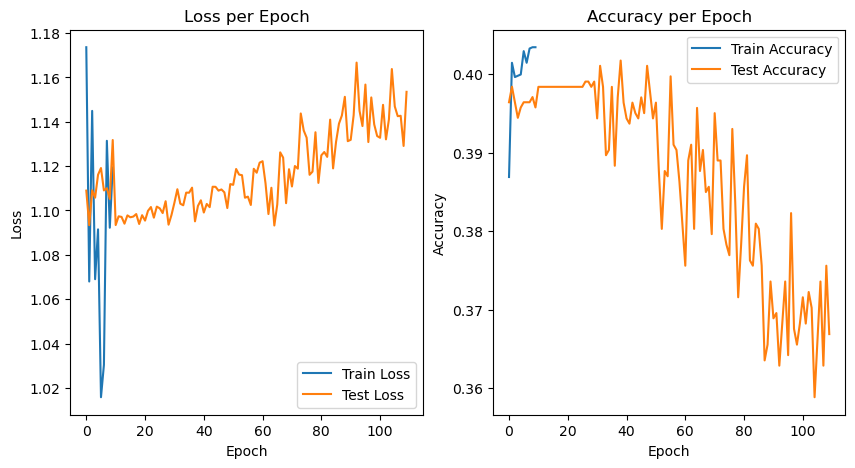

In [ ]:
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR

# Define the model architecture with additional Dense layer and dropout
class ImprovedRNN(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, num_classes, dropout_prob=0.5):
        super(ImprovedRNN, self).__init__()
        self.rnn = nn.RNN(input_size, hidden_size, num_layers, batch_first=True)
        self.fc1 = nn.Linear(hidden_size, hidden_size)
        self.dropout = nn.Dropout(dropout_prob)
        self.fc2 = nn.Linear(hidden_size, num_classes)

    def forward(self, x):
        out, _ = self.rnn(x)
        out = F.relu(self.fc1(out[:, -1, :]))  # Use only the last time step
        out = self.dropout(out)
        out = self.fc2(out)
        return out

# Define model hyperparameters
input_size = 5  # Number of input features
hidden_size = 128  # Number of neurons in RNN layer
num_layers = 3  # Number of RNN layers
num_classes = 3  # Number of classes

# Create model instance
model = ImprovedRNN(input_size, hidden_size, num_layers, num_classes)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()  # Categorical cross-entropy
optimizer = optim.AdamW(model.parameters())  # Advanced Adam optimizer
# optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)  # SGD optimizer

# Train the model
num_epochs = 100
for epoch in range(num_epochs):
    # Training loop
    model.train()
    for inputs, labels in train_loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
    
    # Evaluation loop
    model.eval()
    correct_test = 0
    total_test = 0
    with torch.no_grad():
        for inputs, labels in test_loader:
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            
            _, predicted = torch.max(outputs, 1)
            total_test += labels.size(0)
            correct_test += (predicted == labels).sum().item()
            
    test_accuracy.append(correct_test / total_test)
    test_losses.append(loss.item())

    print(f'Epoch [{epoch+1}/{num_epochs}], Train Loss: {loss.item():.4f}, Test Loss: {test_losses[-1]:.4f}')

# Plot loss function and accuracy
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss per Epoch')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_accuracy, label='Train Accuracy')
plt.plot(test_accuracy, label='Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy per Epoch')
plt.legend()
plt.show()


In [ ]:
# Print classification report
model.eval()
with torch.no_grad():
    y_true_train = []
    y_pred_train = []
    for inputs, labels in train_loader:
        outputs = model(inputs)
        _, predicted = torch.max(outputs, 1)
        y_true_train.extend(labels.numpy())
        y_pred_train.extend(predicted.numpy())

    y_true_test = []
    y_pred_test = []
    for inputs, labels in test_loader:
        outputs = model(inputs)
        _, predicted = torch.max(outputs, 1)
        y_true_test.extend(labels.numpy())
        y_pred_test.extend(predicted.numpy())

print('Classification Report for Train Data:')
print(classification_report(y_true_train, y_pred_train))

print('Classification Report for Test Data:')
print(classification_report(y_true_test, y_pred_test))

Classification Report for Train Data:
              precision    recall  f1-score   support

           0       0.55      0.17      0.26      1790
           1       0.52      0.26      0.34      1780
           2       0.45      0.85      0.59      2393

    accuracy                           0.47      5963
   macro avg       0.51      0.43      0.40      5963
weighted avg       0.50      0.47      0.42      5963

Classification Report for Test Data:
              precision    recall  f1-score   support

           0       0.29      0.09      0.13       474
           1       0.26      0.14      0.18       423
           2       0.40      0.75      0.52       594

    accuracy                           0.37      1491
   macro avg       0.32      0.33      0.28      1491
weighted avg       0.32      0.37      0.30      1491



Epoch [1/50], Train Loss: 1.0915, Test Loss: 1.0915
Epoch [2/50], Train Loss: 1.0925, Test Loss: 1.0925
Epoch [3/50], Train Loss: 1.0968, Test Loss: 1.0968
Epoch [4/50], Train Loss: 1.0999, Test Loss: 1.0999
Epoch [5/50], Train Loss: 1.0984, Test Loss: 1.0984
Epoch [6/50], Train Loss: 1.0978, Test Loss: 1.0978
Epoch [7/50], Train Loss: 1.0946, Test Loss: 1.0946
Epoch [8/50], Train Loss: 1.0910, Test Loss: 1.0910
Epoch [9/50], Train Loss: 1.0821, Test Loss: 1.0821
Epoch [10/50], Train Loss: 1.0843, Test Loss: 1.0843
Epoch [11/50], Train Loss: 1.0813, Test Loss: 1.0813
Epoch [12/50], Train Loss: 1.1017, Test Loss: 1.1017
Epoch [13/50], Train Loss: 1.0848, Test Loss: 1.0848
Epoch [14/50], Train Loss: 1.0907, Test Loss: 1.0907
Epoch [15/50], Train Loss: 1.1273, Test Loss: 1.1273
Epoch [16/50], Train Loss: 1.1003, Test Loss: 1.1003
Epoch [17/50], Train Loss: 1.1012, Test Loss: 1.1012
Epoch [18/50], Train Loss: 1.1100, Test Loss: 1.1100
Epoch [19/50], Train Loss: 1.1053, Test Loss: 1.1053
Ep

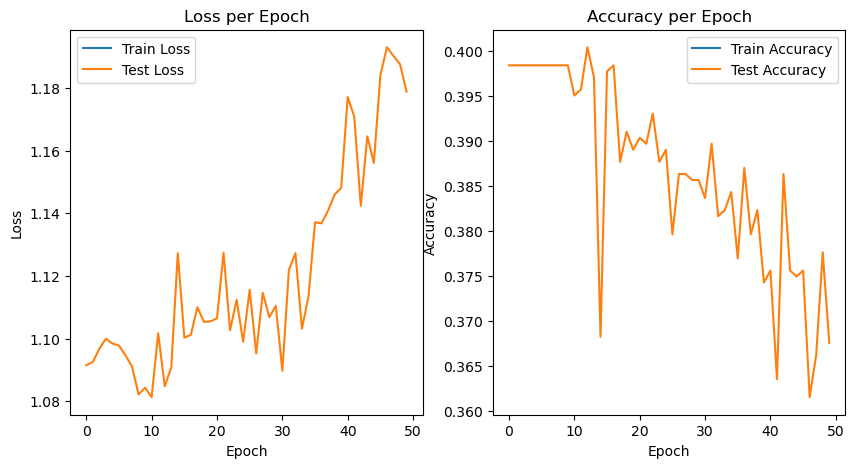

In [133]:
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR

# Initialize empty lists for storing accuracy and loss values
train_accuracy = []
train_losses = []
test_accuracy = []
test_losses = []

# Define the model architecture with additional Dense layer and dropout
class ImprovedRNN(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, num_classes, dropout_prob=0.5):
        super(ImprovedRNN, self).__init__()
        self.rnn = nn.RNN(input_size, hidden_size, num_layers, batch_first=True)
        self.fc1 = nn.Linear(hidden_size, hidden_size)
        self.dropout = nn.Dropout(dropout_prob)
        self.fc2 = nn.Linear(hidden_size, num_classes)

    def forward(self, x):
        out, _ = self.rnn(x)
        out = F.relu(self.fc1(out[:, -1, :]))  # Use only the last time step
        out = self.dropout(out)
        out = self.fc2(out)
        return out

# Define model hyperparameters
input_size = 5  # Number of input features
hidden_size = 128  # Number of neurons in RNN layer
num_layers = 3  # Number of RNN layers
num_classes = 3  # Number of classes

# Create model instance
model = ImprovedRNN(input_size, hidden_size, num_layers, num_classes)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()  # Categorical cross-entropy
#optimizer = optim.AdamW(model.parameters())  # Advanced Adam optimizer
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)  # SGD optimizer

# Train the model
num_epochs = 50
for epoch in range(num_epochs):
    # Training loop
    model.train()
    for inputs, labels in train_loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
    
    # Evaluation loop
    model.eval()
    correct_test = 0
    total_test = 0
    with torch.no_grad():
        for inputs, labels in test_loader:
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            
            _, predicted = torch.max(outputs, 1)
            total_test += labels.size(0)
            correct_test += (predicted == labels).sum().item()
            
    test_accuracy.append(correct_test / total_test)
    test_losses.append(loss.item())

    print(f'Epoch [{epoch+1}/{num_epochs}], Train Loss: {loss.item():.4f}, Test Loss: {test_losses[-1]:.4f}')

# Plot loss function and accuracy
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss per Epoch')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_accuracy, label='Train Accuracy')
plt.plot(test_accuracy, label='Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy per Epoch')
plt.legend()
plt.show()


In [134]:
model.eval()
with torch.no_grad():
    y_true_train = []
    y_pred_train = []
    for inputs, labels in train_loader:
        outputs = model(inputs)
        _, predicted = torch.max(outputs, 1)
        y_true_train.extend(labels.numpy())
        y_pred_train.extend(predicted.numpy())

    y_true_test = []
    y_pred_test = []
    for inputs, labels in test_loader:
        outputs = model(inputs)
        _, predicted = torch.max(outputs, 1)
        y_true_test.extend(labels.numpy())
        y_pred_test.extend(predicted.numpy())

print('Classification Report for Train Data:')
print(classification_report(y_true_train, y_pred_train))

print('Classification Report for Test Data:')
print(classification_report(y_true_test, y_pred_test))

Classification Report for Train Data:
              precision    recall  f1-score   support

           0       0.51      0.22      0.31      1790
           1       0.53      0.30      0.38      1780
           2       0.47      0.82      0.60      2393

    accuracy                           0.49      5963
   macro avg       0.50      0.45      0.43      5963
weighted avg       0.50      0.49      0.45      5963

Classification Report for Test Data:
              precision    recall  f1-score   support

           0       0.32      0.13      0.19       474
           1       0.28      0.18      0.22       423
           2       0.40      0.69      0.51       594

    accuracy                           0.37      1491
   macro avg       0.33      0.33      0.30      1491
weighted avg       0.34      0.37      0.32      1491



## Fully Connected Neural Network

In [128]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder

# Assuming X_encoded contains your encoded features and y contains the target labels
X = X_encoded
y = selected_data['preparedness']

# Encode the target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Define the fully connected neural network model
model = Sequential()
model.add(Dense(128, input_dim=X_train.shape[1], activation='relu'))  # Input layer with 128 neurons
model.add(Dense(64, activation='relu'))  # Hidden layer with 64 neurons
model.add(Dense(3, activation='softmax'))  # Output layer with 3 neurons for classification
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=1, validation_split=0.2)

# Evaluate the model on the testing set
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print("Testing Accuracy:", test_accuracy)

# Make predictions
y_train_pred_fnn = best_model.predict(X_train)
y_test_pred_fnn = best_model.predict(X_test)

# Print classification reports and confusion matrices
print("\nTraining Classification Report:")
print(classification_report(y_train, y_train_pred_fnn))
print("\nTesting Classification Report:")
print(classification_report(y_test, y_test_pred_fnn))

print("\nTraining Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_fnn))
print("\nTesting Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_fnn))


Epoch 1/50
153/153 [==============================] - 3s 8ms/step - loss: 22.5071 - accuracy: 0.3633 - val_loss: 13.9656 - val_accuracy: 0.2966
Epoch 2/50
153/153 [==============================] - 1s 4ms/step - loss: 7.5509 - accuracy: 0.3586 - val_loss: 5.8898 - val_accuracy: 0.3131
Epoch 3/50
153/153 [==============================] - 1s 5ms/step - loss: 6.9055 - accuracy: 0.3477 - val_loss: 3.4387 - val_accuracy: 0.4051
Epoch 4/50
153/153 [==============================] - 1s 5ms/step - loss: 7.4979 - accuracy: 0.3453 - val_loss: 6.6882 - val_accuracy: 0.4051
Epoch 5/50
153/153 [==============================] - 1s 4ms/step - loss: 6.1322 - accuracy: 0.3658 - val_loss: 4.8323 - val_accuracy: 0.4133
Epoch 6/50
153/153 [==============================] - 1s 4ms/step - loss: 4.4650 - accuracy: 0.3868 - val_loss: 8.8189 - val_accuracy: 0.4150
Epoch 7/50
153/153 [==============================] - 1s 4ms/step - loss: 4.4640 - accuracy: 0.3919 - val_loss: 3.1638 - val_accuracy: 0.4651
Epoc

In [130]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder

# Assuming X_encoded contains your encoded features and y contains the target labels
X = X_encoded
y = selected_data['preparedness']

# Encode the target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Define the fully connected neural network model
model = Sequential()
model.add(Dense(248, input_dim=X_train.shape[1], activation='relu'))  # Input layer with 128 neurons
model.add(Dense(128, activation='relu'))  # Hidden layer with 64 neurons
model.add(Dense(64,activation='relu'))
model.add(Dense(3, activation='softmax'))  # Output layer with 3 neurons for classification
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=100, batch_size=32, verbose=1, validation_split=0.2)

# Evaluate the model on the testing set
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print("Testing Accuracy:", test_accuracy)

# Make predictions
y_train_pred_fnn = best_model.predict(X_train)
y_test_pred_fnn = best_model.predict(X_test)

# Print classification reports and confusion matrices
print("\nTraining Classification Report:")
print(classification_report(y_train, y_train_pred_fnn))
print("\nTesting Classification Report:")
print(classification_report(y_test, y_test_pred_fnn))

print("\nTraining Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_fnn))
print("\nTesting Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_fnn))

Epoch 1/100


153/153 [==============================] - 3s 8ms/step - loss: 19.8575 - accuracy: 0.3426 - val_loss: 14.8915 - val_accuracy: 0.3040
Epoch 2/100
153/153 [==============================] - 1s 5ms/step - loss: 7.8240 - accuracy: 0.3533 - val_loss: 12.6582 - val_accuracy: 0.3065
Epoch 3/100
153/153 [==============================] - 1s 5ms/step - loss: 5.5330 - accuracy: 0.3670 - val_loss: 4.0961 - val_accuracy: 0.4018
Epoch 4/100
153/153 [==============================] - 1s 6ms/step - loss: 5.0082 - accuracy: 0.3613 - val_loss: 10.6265 - val_accuracy: 0.3196
Epoch 5/100
153/153 [==============================] - 1s 5ms/step - loss: 4.6242 - accuracy: 0.3763 - val_loss: 7.2689 - val_accuracy: 0.3180
Epoch 6/100
153/153 [==============================] - 1s 5ms/step - loss: 2.5473 - accuracy: 0.3857 - val_loss: 5.3016 - val_accuracy: 0.3369
Epoch 7/100
153/153 [==============================] - 1s 6ms/step - loss: 2.5867 - accuracy: 0.3763 - val_loss: 3.0630 - val_accuracy: 0.3016
Epoch 8

In [131]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder

# Assuming X_encoded contains your encoded features and y contains the target labels
X = X_encoded
y = selected_data['preparedness']

# Encode the target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Define the fully connected neural network model
model = Sequential()
model.add(Dense(248, input_dim=X_train.shape[1], activation='relu'))  # Input layer with 128 neurons
model.add(Dense(128, activation='relu'))  # Hidden layer with 64 neurons
model.add(Dense(64,activation='relu'))
model.add(Dense(3, activation='softmax'))  # Output layer with 3 neurons for classification
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=200, batch_size=32, verbose=1, validation_split=0.2)

# Evaluate the model on the testing set
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print("Testing Accuracy:", test_accuracy)

# Make predictions
y_train_pred_fnn = best_model.predict(X_train)
y_test_pred_fnn = best_model.predict(X_test)

# Print classification reports and confusion matrices
print("\nTraining Classification Report:")
print(classification_report(y_train, y_train_pred_fnn))
print("\nTesting Classification Report:")
print(classification_report(y_test, y_test_pred_fnn))

print("\nTraining Confusion Matrix:")
print(confusion_matrix(y_train, y_train_pred_fnn))
print("\nTesting Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_fnn))

Epoch 1/200
153/153 [==============================] - 2s 6ms/step - loss: 12.5090 - accuracy: 0.3428 - val_loss: 8.3883 - val_accuracy: 0.3155
Epoch 2/200
153/153 [==============================] - 1s 4ms/step - loss: 5.0870 - accuracy: 0.3535 - val_loss: 4.1527 - val_accuracy: 0.3969
Epoch 3/200
153/153 [==============================] - 1s 5ms/step - loss: 3.8103 - accuracy: 0.3522 - val_loss: 3.1758 - val_accuracy: 0.3237
Epoch 4/200
153/153 [==============================] - 1s 6ms/step - loss: 3.1396 - accuracy: 0.3578 - val_loss: 5.5617 - val_accuracy: 0.3139
Epoch 5/200
153/153 [==============================] - 1s 7ms/step - loss: 2.0740 - accuracy: 0.3812 - val_loss: 4.2339 - val_accuracy: 0.3131
Epoch 6/200
153/153 [==============================] - 1s 6ms/step - loss: 2.0306 - accuracy: 0.3880 - val_loss: 1.5498 - val_accuracy: 0.3911
Epoch 7/200
153/153 [==============================] - 1s 6ms/step - loss: 1.7544 - accuracy: 0.3966 - val_loss: 2.1679 - val_accuracy: 0.332

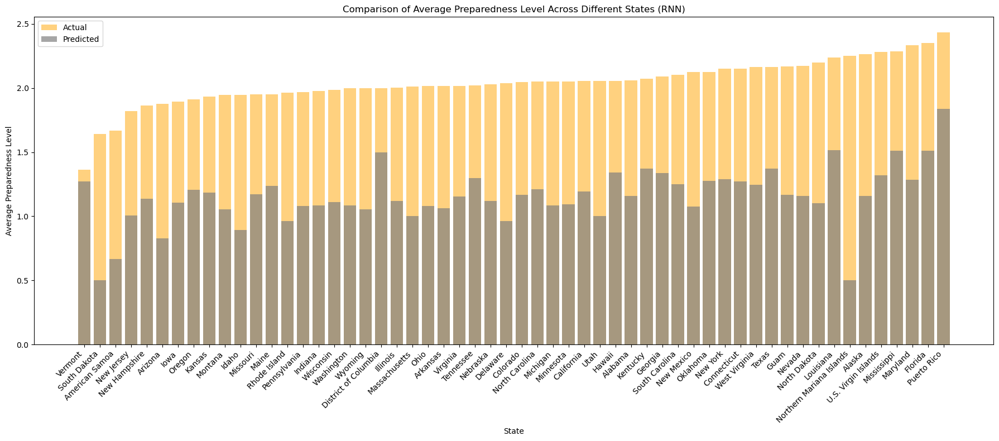

In [132]:
import pandas as pd
import matplotlib.pyplot as plt

# Combine predictions from the RNN model for training and testing datasets
all_predictions_fnn = np.concatenate([y_train_pred_fnn, y_test_pred_fnn])

# Combine state information from training and testing datasets
all_states_fnn = np.concatenate([selected_data.loc[X_train.index, 'state'], selected_data.loc[X_test.index, 'state']])

# Create a dataframe with state and corresponding predicted preparedness level
predicted_df_fnn = pd.DataFrame({'State': all_states_fnn, 'Predicted Preparedness': all_predictions_fnn})

# Calculate the distribution of preparedness levels predicted by the RNN model across different states
state_distribution_predicted_fnn = predicted_df_fnn.groupby('State').mean().sort_values(by='Predicted Preparedness')

# Step 2: Grouping by State and Calculating Average Preparedness for actual data
actual_state_avg_preparedness = selected_data.groupby('state')['preparedness'].mean().sort_values()

# Step 3: Visualization
plt.figure(figsize=(18, 8))

# Get the index of states
states = actual_state_avg_preparedness.index

# Plot actual average preparedness levels
plt.bar(states, actual_state_avg_preparedness, color='orange', alpha=0.5, label='Actual')

# Plot predicted average preparedness levels
plt.bar(state_distribution_predicted_fnn.index, state_distribution_predicted_fnn['Predicted Preparedness'], color='grey', alpha=0.7, label='Predicted')

plt.title('Comparison of Average Preparedness Level Across Different States (RNN)')
plt.xlabel('State')
plt.ylabel('Average Preparedness Level')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()


## Clustering

### Segmentation of Preparedness Levels

In [70]:
selected_data['education'].unique()

array(["Bachelor's degree",
       'Post graduate work/degree or professional degree',
       'High school degree or diploma', 'Some college, no degree',
       "Associate's degree", 'Less than high school diploma'],
      dtype=object)

Optimization terminated successfully.
         Current function value: 1.073208
         Iterations 5
Segment Counts:
2    6139
0    1461
1       4
Name: predicted_class, dtype: int64

Chi-square test for education:
Chi-square statistic: 386.30764949129514
P-value: 7.705519299088126e-77

Chi-square test for employment:
Chi-square statistic: 974.4507289552697
P-value: 3.301133739039772e-197

Chi-square test for income:
Chi-square statistic: 1205.706832328467
P-value: 6.699667212428763e-245

Chi-square test for homeownership:
Chi-square statistic: 2617.754384971604
P-value: 0.0

Chi-square test for socioeconomically_disadvantaged:
Chi-square statistic: 406.7286516510673
P-value: 9.781389766442469e-87

Chi-square test for care:
Chi-square statistic: 611.4620543100764
P-value: 5.12223699999927e-131

Chi-square test for disability:
Chi-square statistic: 68.44820142276654
P-value: 1.369814985345691e-15

Z-test for proportion of 'education' in segment 2:
Z-statistic: nan
P-value: nan

Z-test 

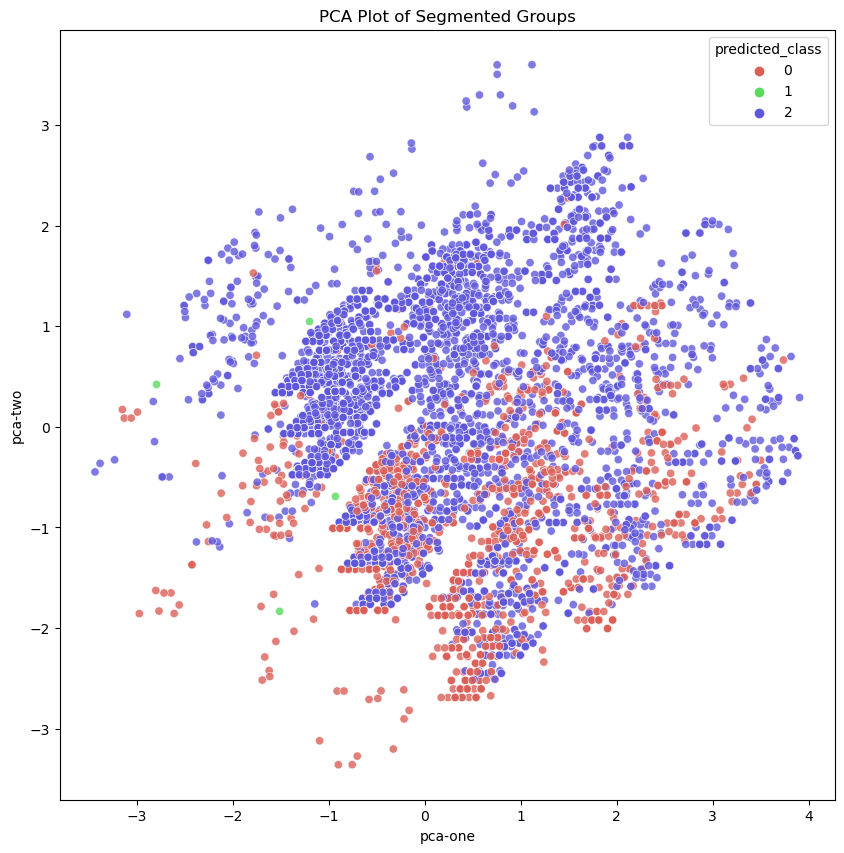

In [73]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler
from scipy.stats import chi2_contingency
from statsmodels.stats.proportion import proportions_ztest
from statsmodels.discrete.discrete_model import MNLogit

# Define demographic features
demographic_features = ['education', 'employment', 'income', 'homeownership', 'socioeconomically_disadvantaged', 'care', 'disability']

# Create a new dataframe containing only the demographic features
df = selected_data[demographic_features + ['preparedness']].copy()

# Label encode categorical variables
le = LabelEncoder()
for feature in demographic_features:
    df[feature] = le.fit_transform(df[feature])

# Standardize the data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df)

# Fit the Latent Class Model
model = MNLogit(df['preparedness'], df[demographic_features])
result = model.fit()

# Get the predicted probabilities for each class
probabilities = result.predict(df[demographic_features])

# Assign each observation to the class with the highest probability
predicted_class = np.argmax(probabilities.values, axis=1)

# Add predicted class to the dataframe
df['predicted_class'] = predicted_class

# Analyze the segmentation
segment_counts = df['predicted_class'].value_counts()
print("Segment Counts:")
print(segment_counts)

# Perform chi-square test for each demographic variable
for feature in demographic_features:
    contingency_table = pd.crosstab(df['predicted_class'], df[feature])
    chi2, p, _, _ = chi2_contingency(contingency_table)
    print(f"\nChi-square test for {feature}:")
    print(f"Chi-square statistic: {chi2}")
    print(f"P-value: {p}")

# Perform z-test for proportions for binary variables
binary_features = ['socioeconomically_disadvantaged', 'care', 'disability']
for feature in demographic_features:
    for segment in df['predicted_class'].unique():
        segment_data = df[df['predicted_class'] == segment]
        successes_segment = segment_data[feature].sum()
        nobs_segment = len(segment_data)
        successes_total = df[feature].sum()
        nobs_total = len(df)
        z_stat, p_val = proportions_ztest(count=[successes_segment, successes_total], nobs=[nobs_segment, nobs_total])
        print(f"\nZ-test for proportion of '{feature}' in segment {segment}:")
        print(f"Z-statistic: {z_stat}")
        print(f"P-value: {p_val}")

# Visualize the segmentation
# You can use various visualization techniques such as PCA, t-SNE, or 3D plots
# Here's an example using PCA
pca = PCA(n_components=3)
pca_result = pca.fit_transform(df_scaled)
df['pca-one'] = pca_result[:,0]
df['pca-two'] = pca_result[:,1]
df['pca-three'] = pca_result[:,2]
plt.figure(figsize=(10,10))
sns.scatterplot(
    x="pca-one", y="pca-two",
    hue="predicted_class",
    palette=sns.color_palette("hls", len(df['predicted_class'].unique())),
    data=df,
    legend="full",
    alpha=0.8
)
plt.title('PCA Plot of Segmented Groups')
plt.show()


## Geographical Patterns of Preparedness

In [110]:
# Import necessary libraries
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# Select relevant features
features = ['state', 'county']

gp = selected_data[features + ['preparedness']].copy()

In [111]:
import geopandas as gpd
# Load counties GeoJSON file
counties_gdf = gpd.read_file("D:/DATA 606/DS/Dataset/Counties.csv")

counties_gdf.head()

,city,city_ascii,state_id,state_name,county_fips,county_name,lat,lng,population,density,source,military,incorporated,timezone,ranking,zips,id,geometry
0,New York,New York,NY,New York,36081,Queens,40.6943,-73.9249,18908608,11080.3,shape,FALSE,TRUE,America/New_York,1,11229 11228 11226 11225 11224 11222 11221 1122...,1840034016,None
1,Los Angeles,Los Angeles,CA,California,6037,Los Angeles,34.1141,-118.4068,11922389,3184.7,shape,FALSE,TRUE,America/Los_Angeles,1,91367 90291 90293 90292 91316 91311 90035 9003...,1840020491,None
2,Chicago,Chicago,IL,Illinois,17031,Cook,41.8375,-87.6866,8497759,4614.5,shape,FALSE,TRUE,America/Chicago,1,60018 60649 60641 60640 60643 60642 60645 6064...,1840000494,None
3,Miami,Miami,FL,Florida,12086,Miami-Dade,25.784,-80.2101,6080145,4758.9,shape,FALSE,TRUE,America/New_York,1,33128 33129 33125 33126 33127 33149 33144 3314...,1840015149,None
4,Houston,Houston,TX,Texas,48201,Harris,29.786,-95.3885,5970127,1384,shape,FALSE,TRUE,America/Chicago,1,77069 77068 77061 77060 77063 77062 77065 7706...,1840020925,None


In [114]:
# Merge selected_data with counties_gdf to get preparedness scores for each county
fts = ['state_name', 'county_name', 'lat', 'lng']
ct = counties_gdf[fts].copy()

# Merge the preparedness data with the county geometries
merged_gdf = ct.merge(gp, left_on='county_name', right_on='county')

merged_gdf.head()

,state_name,county_name,lat,lng,state,county,preparedness
0,New York,Queens,40.6943,-73.9249,New York,Queens,2
1,New York,Queens,40.6943,-73.9249,New York,Queens,0
2,New York,Queens,40.6943,-73.9249,New York,Queens,1
3,New York,Queens,40.6943,-73.9249,New York,Queens,0
4,New York,Queens,40.6943,-73.9249,New York,Queens,2


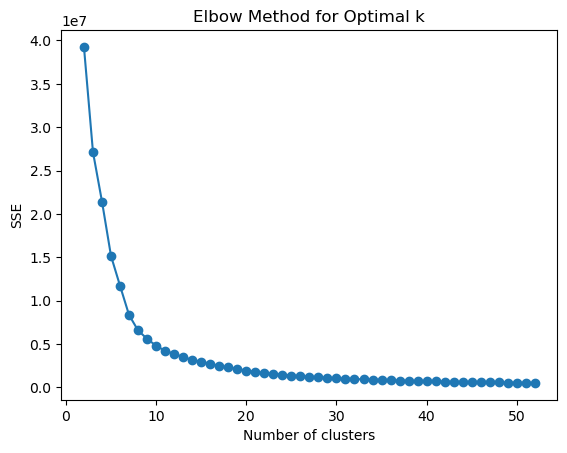

In [133]:
# Determine the optimal number of clusters using the elbow method
sse = []
for k in range(2, 53):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(merged_gdf[['lat', 'lng']])
    sse.append(kmeans.inertia_)

# Plot the SSE values against k to identify the elbow point
plt.plot(range(2, 53), sse, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('SSE')
plt.title('Elbow Method for Optimal k')
plt.show()

In [135]:
import plotly.express as px
# Based on the elbow method, choose the optimal value of k
optimal_k = 54  # Adjust this based on the elbow plot

# Perform KMeans clustering with the optimal number of clusters
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
kmeans.fit(merged_gdf[['lat', 'lng']])
merged_gdf['cluster'] = kmeans.labels_

# Calculate the average preparedness level for each cluster
cluster_preparedness = merged_gdf.groupby('cluster')['preparedness'].mean().reset_index()

# Merge cluster preparedness with cluster centroids
cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=['lat', 'lng'])
cluster_centers = pd.concat([cluster_centers, cluster_preparedness], axis=1)

# Visualize clusters on a map
fig = px.scatter_mapbox(cluster_centers, 
                        lat="lat", 
                        lon="lng", 
                        color="preparedness",
                        size="preparedness", 
                        hover_name="cluster",
                        zoom=5,
                        mapbox_style="open-street-map")
fig.update_layout(title="Spatial Clustering of Preparedness Levels",
                  coloraxis_colorbar=dict(title="Preparedness Level"))
fig.show()

## Association Between Past Experience, Awareness and Preparedness

In [29]:
# Select relevant features including awareness_score and preparedness
dis_fts = ['dis_exp', 'dis_prep', 'dis_perception']
x = ['preparedness', 'awareness_score']
# Create a new dataframe containing the selected features
dt = selected_data[dis_fts + x].copy()

In [30]:
import pandas as pd

# Assuming df is your DataFrame containing the data
correlation = selected_data['awareness_score'].corr(selected_data['preparedness'])

print("Correlation coefficient between awareness_score and preparedness:", correlation)

Correlation coefficient between awareness_score and preparedness: 0.2790085014225535


In [31]:
spearman_corr = selected_data['awareness_score'].corr(selected_data['preparedness'], method='spearman')
print("Spearman correlation coefficient between awareness_score and preparedness:", spearman_corr)


Spearman correlation coefficient between awareness_score and preparedness: 0.2756497588522714


The correlation coefficients suggest a positive but moderate association between awareness score and preparedness. This means that individuals with higher awareness scores tend to have slightly higher preparedness levels.

In [32]:
import pandas as pd
import statsmodels.api as sm

# Convert categorical variables to one-hot encoding
X_encoded = pd.get_dummies(selected_data[['dis_exp', 'dis_prep', 'dis_perception']])

# Add awareness_score as a numerical feature
X_encoded['awareness_score'] = selected_data['awareness_score']

# Add a constant to the predictor variables
X_encoded = sm.add_constant(X_encoded)

# Define the target variable
y = selected_data['preparedness']

# Fit the multiple regression model
model = sm.OLS(y, X_encoded).fit()

# Print the summary of the regression model
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:           preparedness   R-squared:                       0.281
Model:                            OLS   Adj. R-squared:                  0.280
Method:                 Least Squares   F-statistic:                     269.6
Date:                Thu, 25 Apr 2024   Prob (F-statistic):               0.00
Time:                        13:29:58   Log-Likelihood:                -8152.7
No. Observations:                7604   AIC:                         1.633e+04
Df Residuals:                    7592   BIC:                         1.641e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                                                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------

dis_exp_Yes: Individuals who have experienced disasters in the past ('dis_exp_Yes') tend to have higher levels of preparedness compared to those who haven't experienced disasters ('dis_exp_No').

dis_prep_Yes, and I have taken steps to prepare: Individuals who have taken steps to prepare for disasters tend to have higher levels of preparedness compared to those who haven't prepared ('dis_prep_No').

dis_perception_Likely: Individuals who perceive the occurrence of disasters as likely tend to have higher levels of preparedness compared to those who perceive it as unlikely ('dis_perception_Unlikely').

awareness_score: For each one-unit increase in awareness score, the preparedness level increases by approximately 0.0830 units, holding other variables constant.

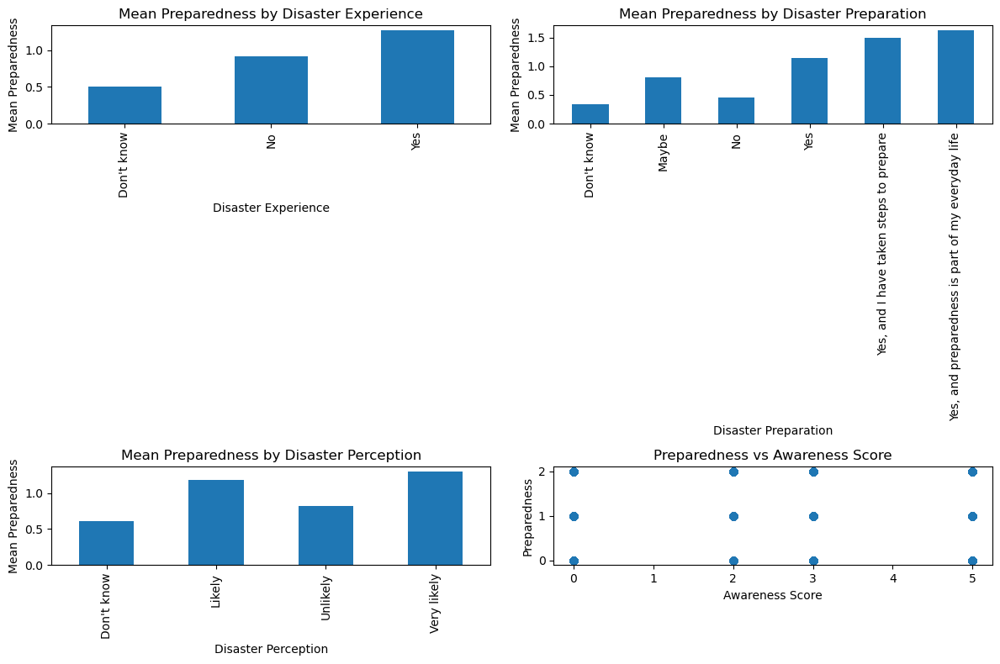

In [33]:
import matplotlib.pyplot as plt

# Bar plot for categorical variables
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
selected_data.groupby('dis_exp')['preparedness'].mean().plot(kind='bar')
plt.title('Mean Preparedness by Disaster Experience')
plt.xlabel('Disaster Experience')
plt.ylabel('Mean Preparedness')

plt.subplot(2, 2, 2)
selected_data.groupby('dis_prep')['preparedness'].mean().plot(kind='bar')
plt.title('Mean Preparedness by Disaster Preparation')
plt.xlabel('Disaster Preparation')
plt.ylabel('Mean Preparedness')

plt.subplot(2, 2, 3)
selected_data.groupby('dis_perception')['preparedness'].mean().plot(kind='bar')
plt.title('Mean Preparedness by Disaster Perception')
plt.xlabel('Disaster Perception')
plt.ylabel('Mean Preparedness')

# Scatter plot for awareness score
plt.subplot(2, 2, 4)
plt.scatter(selected_data['awareness_score'], selected_data['preparedness'])
plt.title('Preparedness vs Awareness Score')
plt.xlabel('Awareness Score')
plt.ylabel('Preparedness')

plt.tight_layout()
plt.show()


## Comparison of Disaster Types

In [145]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler, LabelEncoder

# Define features and target variable
features = ['sample', 'dis_prep', 'dis_exp', 'dis_perception', 'registered_for_alerts']
num_fts = ['awareness_score', 'preparedness']

# Extract the relevant data
data_selected = selected_data[features + num_fts].copy()

# Check data types before label encoding
print("Data Types Before Label Encoding:")
print(data_selected.dtypes)

# Label encode categorical features
label_encoders = {}
for feature in features:
    le = LabelEncoder()
    data_selected[feature] = le.fit_transform(data_selected[feature])
    label_encoders[feature] = le

# Check data types after label encoding
print("\nData Types After Label Encoding:")
print(data_selected.dtypes)

# Inspect unique values of categorical features before and after encoding
print("\nUnique Values Before Label Encoding:")
for feature in features:
    print(f"{feature}: {data_selected[feature].unique()}")

# Print a sample of the original data and the encoded data
print("\nSample of Original Data:")
print(data_selected.head())

# Inspect encoded data
print("\nSample of Encoded Data:")
print(data_selected.head())




Data Types Before Label Encoding:
sample                   object
dis_prep                 object
dis_exp                  object
dis_perception           object
registered_for_alerts    object
awareness_score           int64
preparedness              int64
dtype: object

Data Types After Label Encoding:
sample                   int32
dis_prep                 int32
dis_exp                  int32
dis_perception           int32
registered_for_alerts    int32
awareness_score          int64
preparedness             int64
dtype: object

Unique Values Before Label Encoding:
sample: [1 2 3 6 5 7 4 0]
dis_prep: [3 1 4 2 5 0]
dis_exp: [2 1 0]
dis_perception: [3 1 0 2]
registered_for_alerts: [1 0]

Sample of Original Data:
   sample  dis_prep  dis_exp  dis_perception  registered_for_alerts  \
0       1         3        2               3                      1   
1       1         3        2               1                      1   
2       1         1        2               3                    

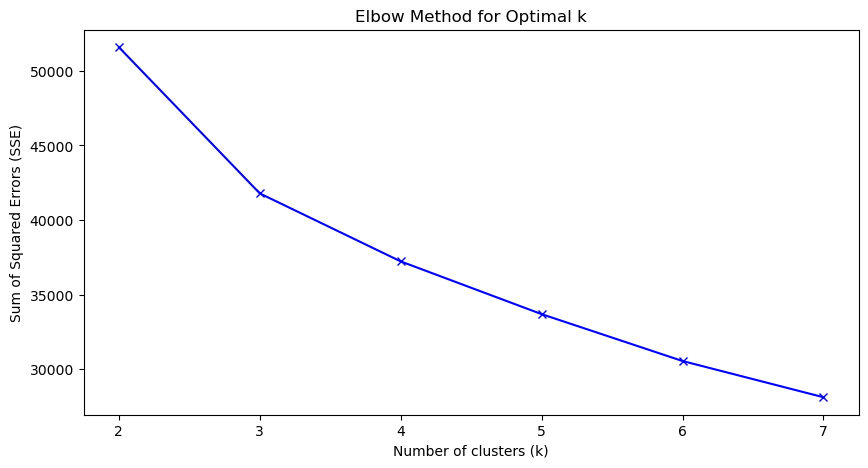

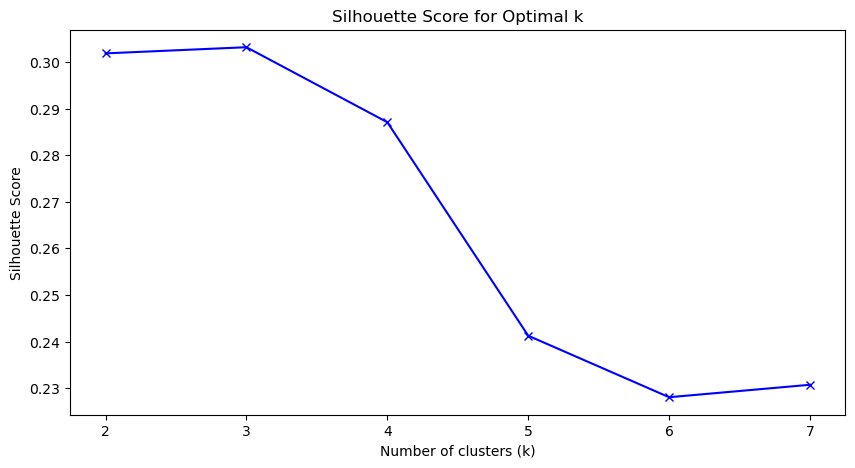

In [146]:
# Determine the optimal number of clusters using the Elbow Method and Silhouette Score
sse = []
silhouette_scores = []
K = range(2, 8)  # change this range according to your needs
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(data_selected)
    sse.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(data_selected, kmeans.labels_))

# Plot the Elbow Method graph
plt.figure(figsize=(10,5))
plt.plot(K, sse, 'bx-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Sum of Squared Errors (SSE)')
plt.title('Elbow Method for Optimal k')
plt.show()

# Plot the Silhouette Score graph
plt.figure(figsize=(10,5))
plt.plot(K, silhouette_scores, 'bx-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Optimal k')
plt.show()

In [147]:
# Inspect Encoded Data
for feature in features:
    print(f"Unique values of {feature} after encoding:")
    print(data_selected[feature].unique())

# Decode Labels
decoded_data = data_selected.copy()
for feature, le in label_encoders.items():
    decoded_data[feature] = le.inverse_transform(data_selected[feature])

# Verify Decoding
print("\nSample of Decoded Data:")
print(decoded_data.head())

Unique values of sample after encoding:
[1 2 3 6 5 7 4 0]
Unique values of dis_prep after encoding:
[3 1 4 2 5 0]
Unique values of dis_exp after encoding:
[2 1 0]
Unique values of dis_perception after encoding:
[3 1 0 2]
Unique values of registered_for_alerts after encoding:
[1 0]

Sample of Decoded Data:
             sample                                dis_prep dis_exp  \
0  Coastal Flooding                                     Yes     Yes   
1  Coastal Flooding                                     Yes     Yes   
2  Coastal Flooding                                   Maybe     Yes   
3  Coastal Flooding  Yes, and I have taken steps to prepare      No   
4  Coastal Flooding  Yes, and I have taken steps to prepare     Yes   

  dis_perception registered_for_alerts  awareness_score  preparedness  
0    Very likely                   Yes                3             1  
1         Likely                   Yes                5             2  
2    Very likely                   Yes            

In [148]:

# Fit the KMeans model
kmeans = KMeans(n_clusters=3, random_state=42)  # choose the number of clusters
kmeans.fit(data_selected[features])

# Add the cluster labels to your dataframe
data_selected['cluster'] = kmeans.labels_

# Decode categorical features
decoded_data = data_selected.copy()
for feature, le in label_encoders.items():
    decoded_data[feature] = le.inverse_transform(decoded_data[feature])


Disaster Type: -1.6088716878480323
           sample  dis_prep   dis_exp  dis_perception  registered_for_alerts
cluster                                                                     
0       -1.608872 -0.597757 -0.949400       -0.271941               0.394936
1       -1.608872  0.179223  0.534173        1.145611               0.394936
2       -1.608872  0.240333  0.629984       -0.741317               0.394936
3       -1.608872  0.440666  0.440963        0.103533              -2.532056


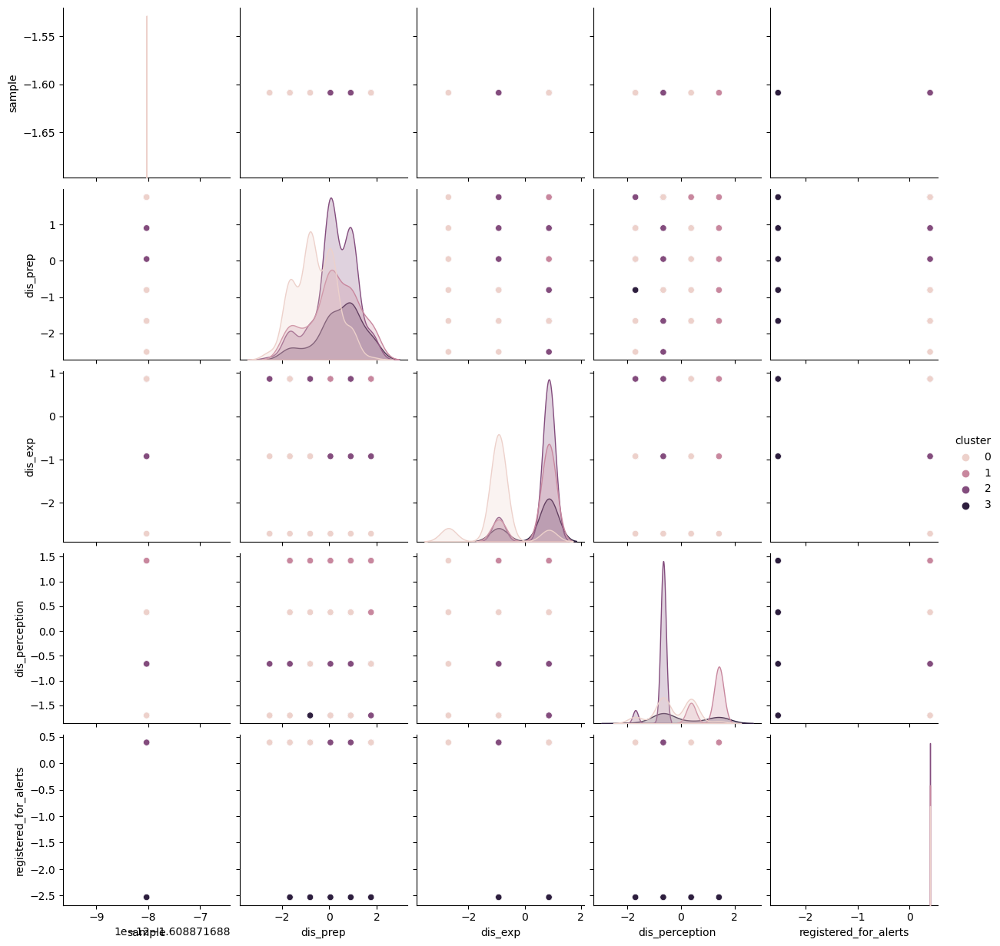

Disaster Type: -1.01957205806015
           sample  dis_prep   dis_exp  dis_perception  registered_for_alerts
cluster                                                                     
0       -1.019572 -0.599760 -1.068047       -0.491005               0.394936
1       -1.019572  0.383221  0.507847        1.213647               0.394936
2       -1.019572  0.261208  0.572110       -0.760586               0.394936
3       -1.019572  0.318179 -0.064174       -0.200441              -2.532056


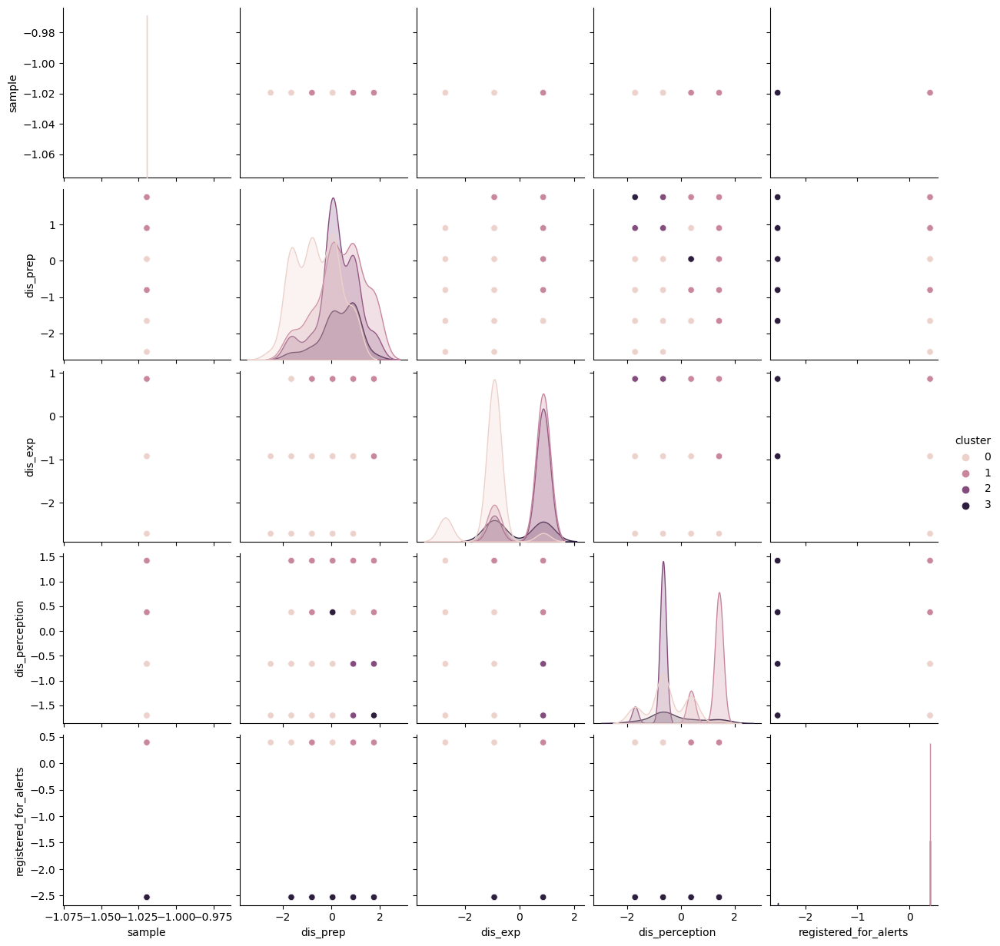

Disaster Type: -0.4302724282722676
           sample  dis_prep   dis_exp  dis_perception  registered_for_alerts
cluster                                                                     
0       -0.430272 -0.604822 -0.880674       -0.463884               0.394936
1       -0.430272  0.473671  0.691920        1.308417               0.394936
2       -0.430272  0.461512  0.826283       -0.728326               0.394936
3       -0.430272  0.556625  0.681830        0.061367              -2.532056


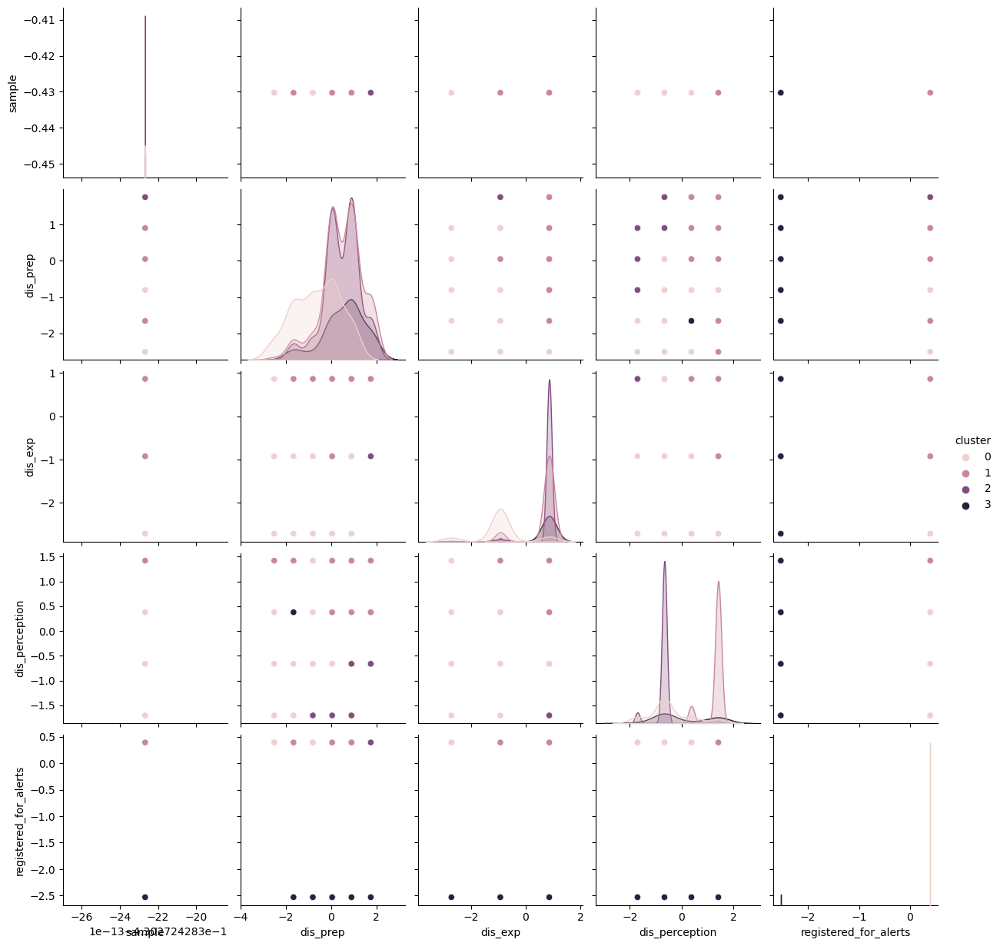

Disaster Type: 1.3376264610913795
           sample  dis_prep   dis_exp  dis_perception  registered_for_alerts
cluster                                                                     
0        1.337626 -0.706277 -1.033143       -0.412507               0.394936
1        1.337626  0.372592  0.416120        1.197422               0.394936
2        1.337626  0.378237  0.558552       -0.740837               0.394936
3        1.337626  0.262862 -0.031050       -0.093688              -2.532056


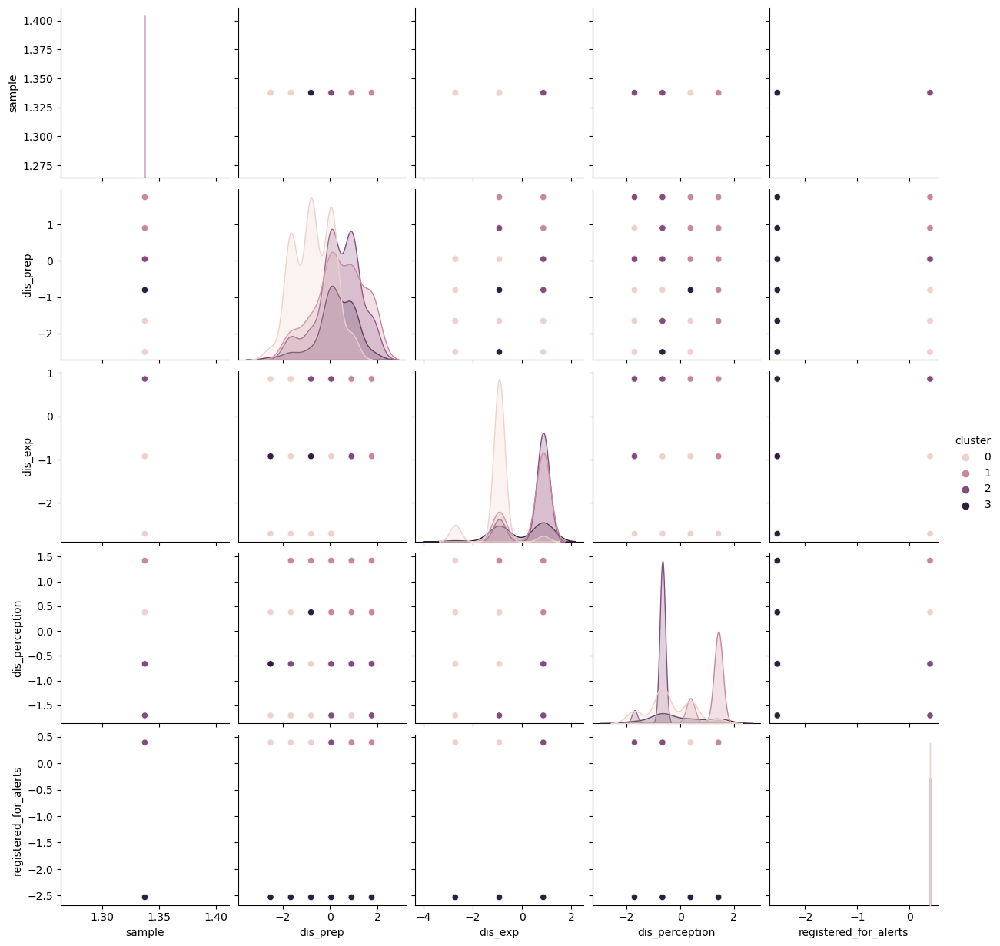

Disaster Type: 0.7483268313034972
           sample  dis_prep   dis_exp  dis_perception  registered_for_alerts
cluster                                                                     
0        0.748327 -0.586622 -0.892062       -0.165197               0.394936
1        0.748327  0.266939  0.510111        1.128670               0.394936
2        0.748327  0.292351  0.543364       -0.833100               0.394936
3        0.748327  0.142844  0.080742       -0.028551              -2.532056


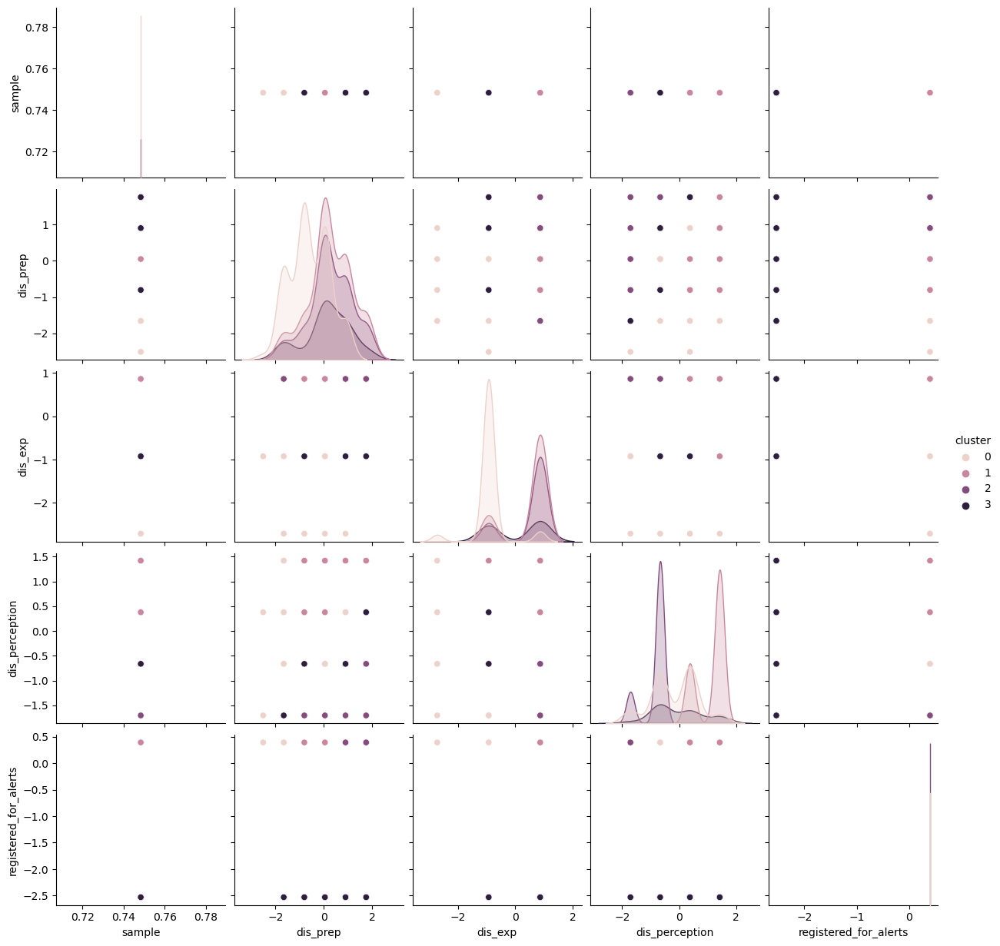

Disaster Type: 1.9269260908792618
           sample  dis_prep   dis_exp  dis_perception  registered_for_alerts
cluster                                                                     
0        1.926926 -0.713845 -0.992050       -0.339975               0.394936
1        1.926926  0.253699  0.446297        1.152209               0.394936
2        1.926926  0.315430  0.681830       -0.776920               0.394936
3        1.926926  0.576100  0.292435        0.178987              -2.532056


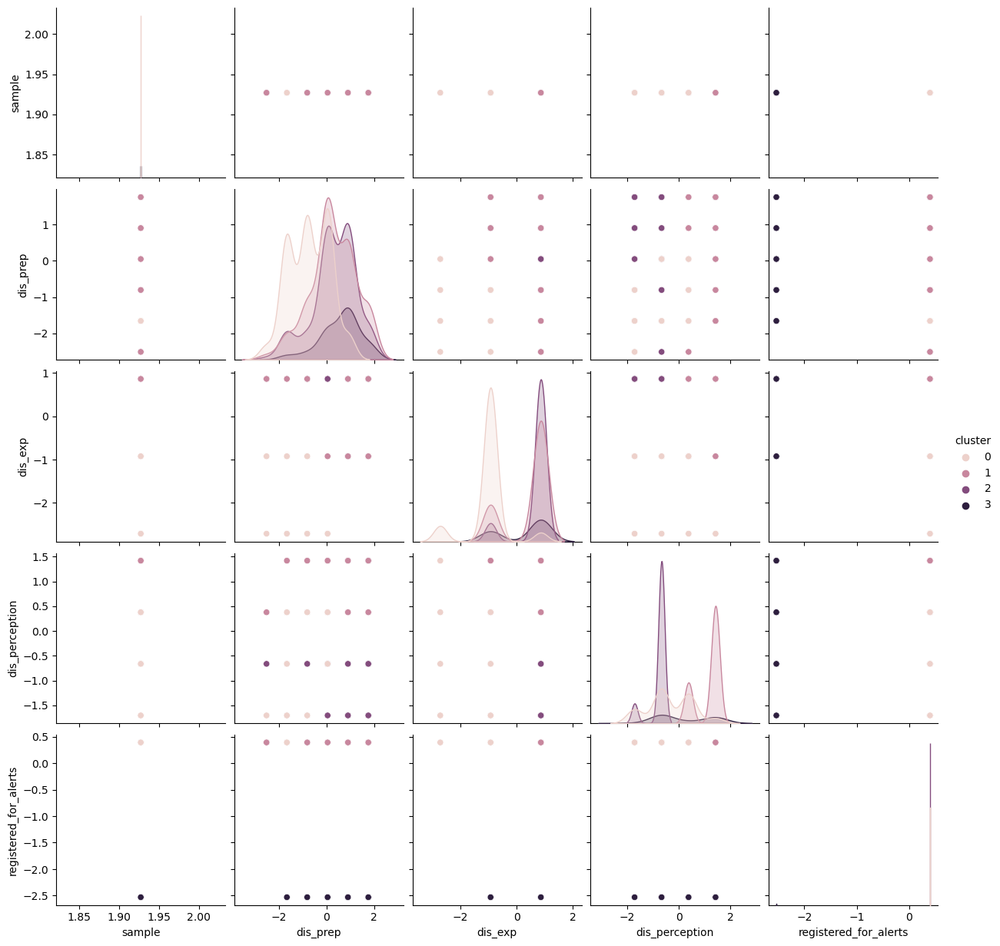

Disaster Type: 0.15902720151561478
           sample  dis_prep   dis_exp  dis_perception  registered_for_alerts
cluster                                                                     
0        0.159027 -0.674631 -0.964674       -0.363797               0.392793
1        0.159027  0.345298  0.434752        1.170071               0.394936
2        0.159027  0.328544  0.584557       -0.765267               0.394936
3        0.159027  0.204277  0.038678       -0.176103              -2.532056


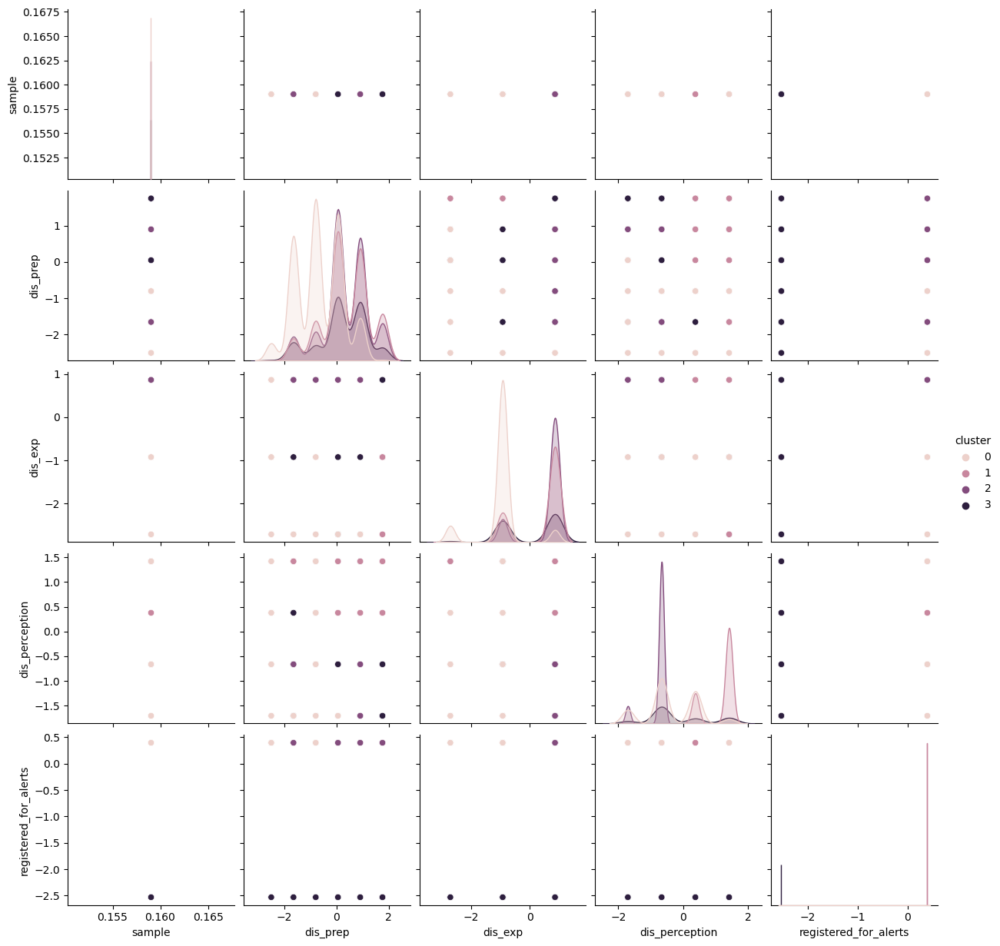

Disaster Type: -2.198171317635915
           sample  dis_prep   dis_exp  dis_perception  registered_for_alerts
cluster                                                                     
0       -2.198171 -0.769127 -1.083574       -0.387137               0.394936
1       -2.198171  0.127557  0.525186        1.230105               0.394936
2       -2.198171  0.267402  0.609577       -0.759727               0.394936
3       -2.198171  0.404011  0.175336        0.025813              -2.532056


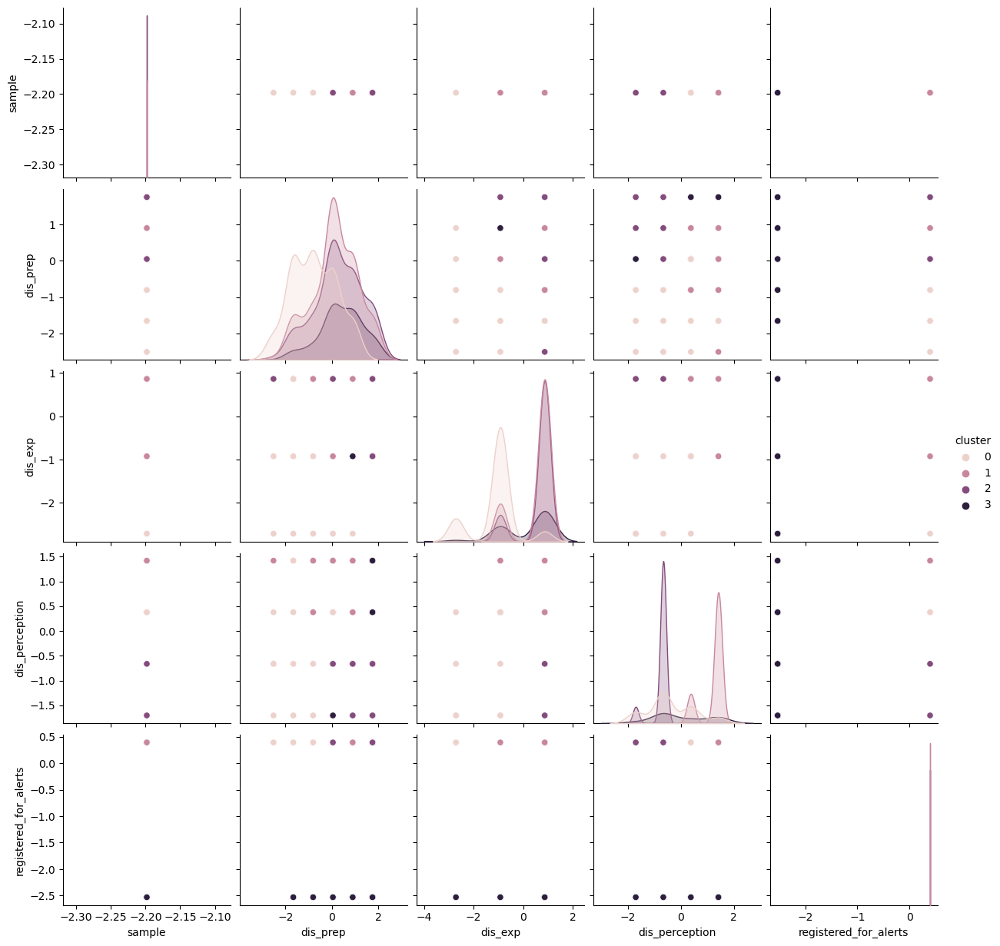

In [149]:
# Compare the clusters across different types of disasters
for disaster_type in data_decoded['sample'].unique():
    subset = data_decoded[data_decoded['sample'] == disaster_type]
    print(f"Disaster Type: {disaster_type}")
    print(subset.groupby('cluster')[features].mean())

    # Plot the clusters
    sns.pairplot(subset, hue='cluster', vars=features)
    plt.show()

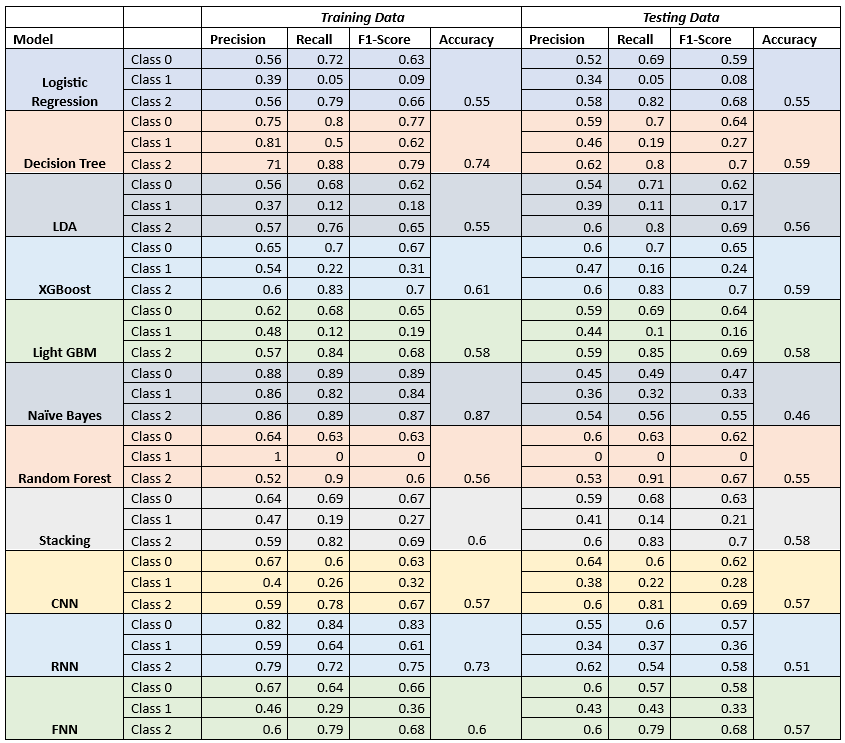